In [1]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns 
color = sns.color_palette()
from sklearn.model_selection import train_test_split,GridSearchCV
from sklearn import metrics
from sklearn.metrics import roc_auc_score,roc_curve,classification_report,confusion_matrix,ConfusionMatrixDisplay
import warnings
warnings.filterwarnings("ignore")

In [2]:
Default = pd.read_excel(("PD_modelling_dataset.xlsx"), keep_default_na=False, na_values=[''])

Default.head()

,userid,default,acct_amt_added_12_24m,acct_days_in_dc_12_24m,acct_days_in_rem_12_24m,acct_days_in_term_12_24m,acct_incoming_debt_vs_paid_0_24m,acct_status,acct_worst_status_0_3m,acct_worst_status_12_24m,...,num_arch_ok_12_24m,num_arch_rem_0_12m,status_max_archived_0_6_months,status_max_archived_0_12_months,status_max_archived_0_24_months,recovery_debt,sum_capital_paid_acct_0_12m,sum_capital_paid_acct_12_24m,sum_paid_inv_0_12m,time_hours
0,4567129.0,0,0.0,0,0,0,0,1,1,NA,...,14.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,178839.0,9.653333
1,2635118.0,0,0.0,0,0,0,NA,1,1,1,...,19.0,3.0,1.0,2.0,2.0,0.0,0.0,0.0,49014.0,13.181389
2,4804232.0,0,0.0,0,0,0,NA,NA,NA,NA,...,0.0,3.0,1.0,2.0,2.0,0.0,0.0,0.0,124839.0,11.561944
3,1442693.0,0,0.0,NA,NA,NA,NA,NA,NA,NA,...,21.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,324676.0,15.751111
4,4575322.0,0,0.0,0,0,0,NA,NA,NA,NA,...,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,7100.0,12.698611


In [3]:
Default.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99979 entries, 0 to 99978
Data columns (total 36 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   userid                            99977 non-null  float64
 1   default                           99977 non-null  object 
 2   acct_amt_added_12_24m             99977 non-null  float64
 3   acct_days_in_dc_12_24m            99977 non-null  object 
 4   acct_days_in_rem_12_24m           99977 non-null  object 
 5   acct_days_in_term_12_24m          99977 non-null  object 
 6   acct_incoming_debt_vs_paid_0_24m  99977 non-null  object 
 7   acct_status                       99977 non-null  object 
 8   acct_worst_status_0_3m            99977 non-null  object 
 9   acct_worst_status_12_24m          99977 non-null  object 
 10  acct_worst_status_3_6m            99977 non-null  object 
 11  acct_worst_status_6_12m           99977 non-null  object 
 12  age 

In [4]:
#Default['has_paid'] = Default['has_paid'].astype(bool)

Default['has_paid'] = Default['has_paid'].map({1: True, 0: False})

print(Default['has_paid'].unique())

[True False nan]


In [5]:
Default['has_paid'] = Default['has_paid'].astype('object')

print(Default['has_paid'].dtype)

object


In [6]:
Default.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99979 entries, 0 to 99978
Data columns (total 36 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   userid                            99977 non-null  float64
 1   default                           99977 non-null  object 
 2   acct_amt_added_12_24m             99977 non-null  float64
 3   acct_days_in_dc_12_24m            99977 non-null  object 
 4   acct_days_in_rem_12_24m           99977 non-null  object 
 5   acct_days_in_term_12_24m          99977 non-null  object 
 6   acct_incoming_debt_vs_paid_0_24m  99977 non-null  object 
 7   acct_status                       99977 non-null  object 
 8   acct_worst_status_0_3m            99977 non-null  object 
 9   acct_worst_status_12_24m          99977 non-null  object 
 10  acct_worst_status_3_6m            99977 non-null  object 
 11  acct_worst_status_6_12m           99977 non-null  object 
 12  age 

In [7]:
Default.duplicated().sum()

1

In [8]:
Default.drop_duplicates(inplace=True)

In [9]:
Default.duplicated().sum()

0

In [10]:
Default= Default.drop('userid', axis = 1)

In [11]:
pd.options.display.float_format = '{:.2f}'.format   

Default.describe().T

,count,mean,std,min,25%,50%,75%,max
acct_amt_added_12_24m,99977.00,12255.03,35481.33,0.00,0.00,0.00,4937.00,1128775.00
age,99977.00,36.02,13.00,0.00,25.00,34.00,45.00,100.00
max_paid_inv_0_12m,88943.00,9362.71,13672.42,0.00,2387.50,6170.00,11400.00,279000.00
max_paid_inv_0_24m,88943.00,11419.61,15431.71,0.00,3685.00,7720.00,13865.00,538500.00
num_active_inv,88943.00,0.63,1.61,0.00,0.00,0.00,1.00,47.00
num_arch_dc_0_12m,88943.00,0.06,0.38,0.00,0.00,0.00,0.00,17.00
num_arch_dc_12_24m,88943.00,0.06,0.36,0.00,0.00,0.00,0.00,13.00
num_arch_ok_0_12m,88943.00,7.79,16.74,0.00,0.00,3.00,8.00,261.00
num_arch_ok_12_24m,88943.00,6.85,16.07,0.00,0.00,2.00,7.00,313.00
num_arch_rem_0_12m,88943.00,0.48,1.40,0.00,0.00,0.00,0.00,42.00


In [12]:
Default["default"].value_counts()

default
0        88688
NA       10000
1         1288
10000        1
Name: count, dtype: int64

In [13]:
Default = Default[(Default['default'] == 0) | (Default['default'] == 1)]

In [14]:
print(Default["default"].value_counts())

default
0    88688
1     1288
Name: count, dtype: int64


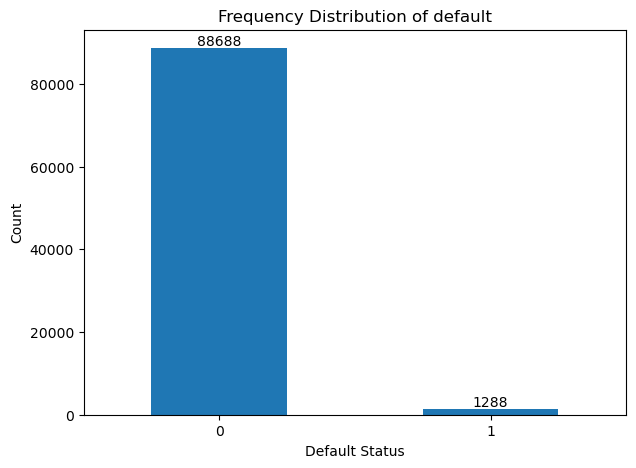

In [307]:
plt.figure(figsize=(7, 5))
ax = Default["default"].value_counts().plot.bar(title="Frequency Distribution of default")
ax.bar_label(ax.containers[0])

ax.set_xticklabels(ax.get_xticklabels(), rotation=0)

plt.xlabel('Default Status')
plt.ylabel('Count')

plt.show();

In [15]:
num_rows, num_columns = Default.shape
print("Number of rows in Default DataFrame:", num_rows)
print("Number of columns in Default DataFrame:", num_columns)

Number of rows in Default DataFrame: 89976
Number of columns in Default DataFrame: 35


In [16]:
# Get value counts including NaN values
print(Default["acct_status"].value_counts(dropna=False))

acct_status
NA    48934
1     39345
2      1687
3         7
4         3
Name: count, dtype: int64


In [17]:
Default["acct_status"].dtype

dtype('O')

In [18]:
#Default['acct_status'].fillna(0, inplace=True)

Default['acct_status']=Default['acct_status'].replace('NA', 0)

Default['acct_status'].replace([2, 3, 4], np.nan, inplace=True)

Default['acct_status'] = Default['acct_status'].astype('object')

print(Default["acct_status"].value_counts(dropna=False))

acct_status
0.00    48934
1.00    39345
 NaN     1697
Name: count, dtype: int64


In [19]:
Default["acct_status"].dtype

dtype('O')

In [20]:
print(Default['name_in_email'].unique())

['no_match' 'F+L' 'L1+F' 'F1+L' nan 'F' 'Nick' 'L' 'Initials']


In [21]:
def standardize_name(name):
    if pd.isnull(name) or name == 'no_match' or name == 'nan':
        return 'Unknown'  
    
    # For patterns F+L, L1+F, F1+L
    if '+' in name:
        parts = name.split('+')
        first_name = parts[0].replace('1', '')  # Remove any digit after F
        last_name = parts[1].replace('1', '')   # Remove any digit after L
        return f"{first_name} {last_name}"
    

    return name.replace('1', '')  


Default['name_in_email'] = Default['name_in_email'].apply(standardize_name)

Default['name_in_email'].fillna(value='Unknown', inplace=True)

# Print unique values in the standardized column
print(Default['name_in_email'].unique())


['Unknown' 'F L' 'L F' 'F' 'Nick' 'L' 'Initials']


In [22]:
def convert_value(x):
    if x == 'NA':
        return 0
    elif x == '':
        return None
    else:
        return float(x)


numeric_columns = Default.select_dtypes(include=['int','float']).columns

Default[numeric_columns] = Default[numeric_columns].applymap(convert_value)

Default.replace('NA', 0, inplace=True)

Default.head()

,default,acct_amt_added_12_24m,acct_days_in_dc_12_24m,acct_days_in_rem_12_24m,acct_days_in_term_12_24m,acct_incoming_debt_vs_paid_0_24m,acct_status,acct_worst_status_0_3m,acct_worst_status_12_24m,acct_worst_status_3_6m,...,num_arch_ok_12_24m,num_arch_rem_0_12m,status_max_archived_0_6_months,status_max_archived_0_12_months,status_max_archived_0_24_months,recovery_debt,sum_capital_paid_acct_0_12m,sum_capital_paid_acct_12_24m,sum_paid_inv_0_12m,time_hours
0,0,0.00,0,0,0,0.00,1.00,1,0,1,...,14.00,0.00,1.00,1.00,1.00,0.00,0.00,0.00,178839.00,9.65
1,0,0.00,0,0,0,0.00,1.00,1,1,1,...,19.00,3.00,1.00,2.00,2.00,0.00,0.00,0.00,49014.00,13.18
2,0,0.00,0,0,0,0.00,0.00,0,0,0,...,0.00,3.00,1.00,2.00,2.00,0.00,0.00,0.00,124839.00,11.56
3,0,0.00,0,0,0,0.00,0.00,0,0,0,...,21.00,0.00,1.00,1.00,1.00,0.00,0.00,0.00,324676.00,15.75
4,0,0.00,0,0,0,0.00,0.00,0,0,0,...,0.00,0.00,1.00,1.00,1.00,0.00,0.00,0.00,7100.00,12.70


In [23]:
Default.isnull().sum()

default                                0
acct_amt_added_12_24m                  0
acct_days_in_dc_12_24m                 0
acct_days_in_rem_12_24m                0
acct_days_in_term_12_24m               0
acct_incoming_debt_vs_paid_0_24m       0
acct_status                         1697
acct_worst_status_0_3m                 0
acct_worst_status_12_24m               0
acct_worst_status_3_6m                 0
acct_worst_status_6_12m                0
age                                    0
avg_payment_span_0_12m                 0
avg_payment_span_0_3m                  0
merchant_category                      0
merchant_group                         9
has_paid                            9944
max_paid_inv_0_12m                  9944
max_paid_inv_0_24m                  9944
name_in_email                          0
num_active_div_by_paid_inv_0_12m    9944
num_active_inv                      9944
num_arch_dc_0_12m                   9944
num_arch_dc_12_24m                  9944
num_arch_ok_0_12

In [24]:
Default.size

3149160

In [25]:
Default.isnull().sum().sum()

180698

In [26]:
180698/3149160


0.0573797457099671

5 % of data is missing

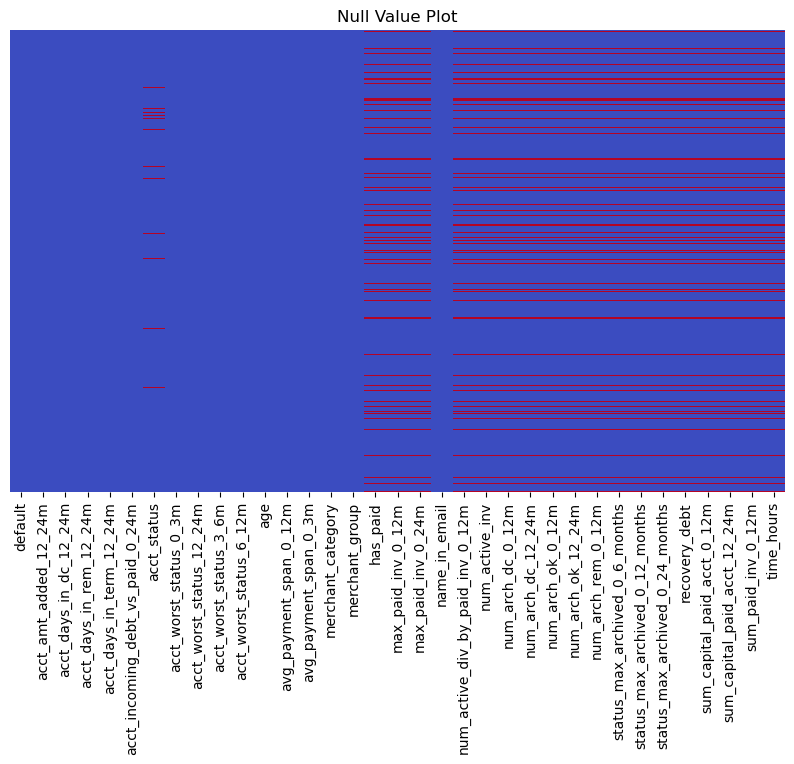

In [27]:
plt.figure(figsize = (10,6))
plt.title("Null Value Plot")
sns.heatmap(Default.isnull(), cbar = False, cmap = 'coolwarm', yticklabels = False)
plt.show()

In [28]:
Default.isnull().sum().sort_values(ascending = False)/Default.index.size

max_paid_inv_0_12m                 0.11
max_paid_inv_0_24m                 0.11
sum_paid_inv_0_12m                 0.11
sum_capital_paid_acct_12_24m       0.11
sum_capital_paid_acct_0_12m        0.11
recovery_debt                      0.11
status_max_archived_0_24_months    0.11
status_max_archived_0_12_months    0.11
status_max_archived_0_6_months     0.11
num_arch_rem_0_12m                 0.11
num_arch_ok_12_24m                 0.11
num_arch_ok_0_12m                  0.11
num_arch_dc_12_24m                 0.11
num_arch_dc_0_12m                  0.11
num_active_inv                     0.11
num_active_div_by_paid_inv_0_12m   0.11
time_hours                         0.11
has_paid                           0.11
acct_status                        0.02
merchant_group                     0.00
acct_amt_added_12_24m              0.00
acct_worst_status_12_24m           0.00
acct_days_in_dc_12_24m             0.00
acct_days_in_rem_12_24m            0.00
acct_days_in_term_12_24m           0.00


In [29]:
Default.info()

<class 'pandas.core.frame.DataFrame'>
Index: 89976 entries, 0 to 89975
Data columns (total 35 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   default                           89976 non-null  int64  
 1   acct_amt_added_12_24m             89976 non-null  float64
 2   acct_days_in_dc_12_24m            89976 non-null  int64  
 3   acct_days_in_rem_12_24m           89976 non-null  int64  
 4   acct_days_in_term_12_24m          89976 non-null  int64  
 5   acct_incoming_debt_vs_paid_0_24m  89976 non-null  float64
 6   acct_status                       88279 non-null  object 
 7   acct_worst_status_0_3m            89976 non-null  int64  
 8   acct_worst_status_12_24m          89976 non-null  int64  
 9   acct_worst_status_3_6m            89976 non-null  int64  
 10  acct_worst_status_6_12m           89976 non-null  int64  
 11  age                               89976 non-null  float64
 12  avg_payme

In [30]:
#acct_status_mode = Default['acct_status'].mode()[0]
#Default['acct_status'] = Default['acct_status'].fillna(acct_status_mode)


In [31]:
for column in Default.columns:
    if Default[column].dtype == 'object':
        mode = Default[column].mode().values[0]
        Default[column] = Default[column].fillna(mode)    
        
Default.isnull().sum()        

default                                0
acct_amt_added_12_24m                  0
acct_days_in_dc_12_24m                 0
acct_days_in_rem_12_24m                0
acct_days_in_term_12_24m               0
acct_incoming_debt_vs_paid_0_24m       0
acct_status                            0
acct_worst_status_0_3m                 0
acct_worst_status_12_24m               0
acct_worst_status_3_6m                 0
acct_worst_status_6_12m                0
age                                    0
avg_payment_span_0_12m                 0
avg_payment_span_0_3m                  0
merchant_category                      0
merchant_group                         0
has_paid                               0
max_paid_inv_0_12m                  9944
max_paid_inv_0_24m                  9944
name_in_email                          0
num_active_div_by_paid_inv_0_12m    9944
num_active_inv                      9944
num_arch_dc_0_12m                   9944
num_arch_dc_12_24m                  9944
num_arch_ok_0_12

In [32]:
# Convert the 'acct_status' column back to object type
Default['acct_status'] = Default['acct_status'].astype('object')

print(Default['acct_status'].dtype)

object


In [33]:
Default['acct_status'].unique()

array([1.0, 0.0], dtype=object)

In [34]:
Default['has_paid'] = Default['has_paid'].astype('object')

print(Default['has_paid'].dtype)

object


In [35]:
Default['has_paid'].unique()

array([True, False], dtype=object)

In [36]:
for column in Default.columns:
    if Default[column].dtype != 'object':
        mean = Default[column].median()
        Default[column] = Default[column].fillna(mean)    
        
Default.isnull().sum()        

default                             0
acct_amt_added_12_24m               0
acct_days_in_dc_12_24m              0
acct_days_in_rem_12_24m             0
acct_days_in_term_12_24m            0
acct_incoming_debt_vs_paid_0_24m    0
acct_status                         0
acct_worst_status_0_3m              0
acct_worst_status_12_24m            0
acct_worst_status_3_6m              0
acct_worst_status_6_12m             0
age                                 0
avg_payment_span_0_12m              0
avg_payment_span_0_3m               0
merchant_category                   0
merchant_group                      0
has_paid                            0
max_paid_inv_0_12m                  0
max_paid_inv_0_24m                  0
name_in_email                       0
num_active_div_by_paid_inv_0_12m    0
num_active_inv                      0
num_arch_dc_0_12m                   0
num_arch_dc_12_24m                  0
num_arch_ok_0_12m                   0
num_arch_ok_12_24m                  0
num_arch_rem

In [37]:
Default.columns

Index(['default', 'acct_amt_added_12_24m', 'acct_days_in_dc_12_24m',
       'acct_days_in_rem_12_24m', 'acct_days_in_term_12_24m',
       'acct_incoming_debt_vs_paid_0_24m', 'acct_status',
       'acct_worst_status_0_3m', 'acct_worst_status_12_24m',
       'acct_worst_status_3_6m', 'acct_worst_status_6_12m', 'age',
       'avg_payment_span_0_12m', 'avg_payment_span_0_3m', 'merchant_category',
       'merchant_group', 'has_paid', 'max_paid_inv_0_12m',
       'max_paid_inv_0_24m', 'name_in_email',
       'num_active_div_by_paid_inv_0_12m', 'num_active_inv',
       'num_arch_dc_0_12m', 'num_arch_dc_12_24m', 'num_arch_ok_0_12m',
       'num_arch_ok_12_24m', 'num_arch_rem_0_12m',
       'status_max_archived_0_6_months', 'status_max_archived_0_12_months',
       'status_max_archived_0_24_months', 'recovery_debt',
       'sum_capital_paid_acct_0_12m', 'sum_capital_paid_acct_12_24m',
       'sum_paid_inv_0_12m', 'time_hours'],
      dtype='object')

In [38]:
Default.info()

<class 'pandas.core.frame.DataFrame'>
Index: 89976 entries, 0 to 89975
Data columns (total 35 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   default                           89976 non-null  int64  
 1   acct_amt_added_12_24m             89976 non-null  float64
 2   acct_days_in_dc_12_24m            89976 non-null  int64  
 3   acct_days_in_rem_12_24m           89976 non-null  int64  
 4   acct_days_in_term_12_24m          89976 non-null  int64  
 5   acct_incoming_debt_vs_paid_0_24m  89976 non-null  float64
 6   acct_status                       89976 non-null  object 
 7   acct_worst_status_0_3m            89976 non-null  int64  
 8   acct_worst_status_12_24m          89976 non-null  int64  
 9   acct_worst_status_3_6m            89976 non-null  int64  
 10  acct_worst_status_6_12m           89976 non-null  int64  
 11  age                               89976 non-null  float64
 12  avg_payme

In [39]:
df_num = Default.select_dtypes(include = ['int64','float'])
lstnumericcolumns = list(df_num.columns.values)
lstnumericcolumns

['default',
 'acct_amt_added_12_24m',
 'acct_days_in_dc_12_24m',
 'acct_days_in_rem_12_24m',
 'acct_days_in_term_12_24m',
 'acct_incoming_debt_vs_paid_0_24m',
 'acct_worst_status_0_3m',
 'acct_worst_status_12_24m',
 'acct_worst_status_3_6m',
 'acct_worst_status_6_12m',
 'age',
 'avg_payment_span_0_12m',
 'avg_payment_span_0_3m',
 'max_paid_inv_0_12m',
 'max_paid_inv_0_24m',
 'num_active_div_by_paid_inv_0_12m',
 'num_active_inv',
 'num_arch_dc_0_12m',
 'num_arch_dc_12_24m',
 'num_arch_ok_0_12m',
 'num_arch_ok_12_24m',
 'num_arch_rem_0_12m',
 'status_max_archived_0_6_months',
 'status_max_archived_0_12_months',
 'status_max_archived_0_24_months',
 'recovery_debt',
 'sum_capital_paid_acct_0_12m',
 'sum_capital_paid_acct_12_24m',
 'sum_paid_inv_0_12m',
 'time_hours']

In [40]:
#from sklearn.preprocessing import StandardScaler #Scale train and test separately
#scaler = StandardScaler()
#scaled_data = pd.DataFrame(scaler.fit_transform(df_num), columns = df_num.columns)

In [41]:
#from sklearn.preprocessing import MinMaxScaler
#scaler = MinMaxScaler()
#scaled_data = pd.DataFrame(scaler.fit_transform(df_num), columns=df_num.columns)

In [42]:
#from sklearn.impute import KNNImputer 
#imputer = KNNImputer(n_neighbors=5)
#imputed_data = pd.DataFrame(imputer.fit_transform(scaled_data), columns=scaled_data.columns)
#imputed_data.isnull().sum().sum()

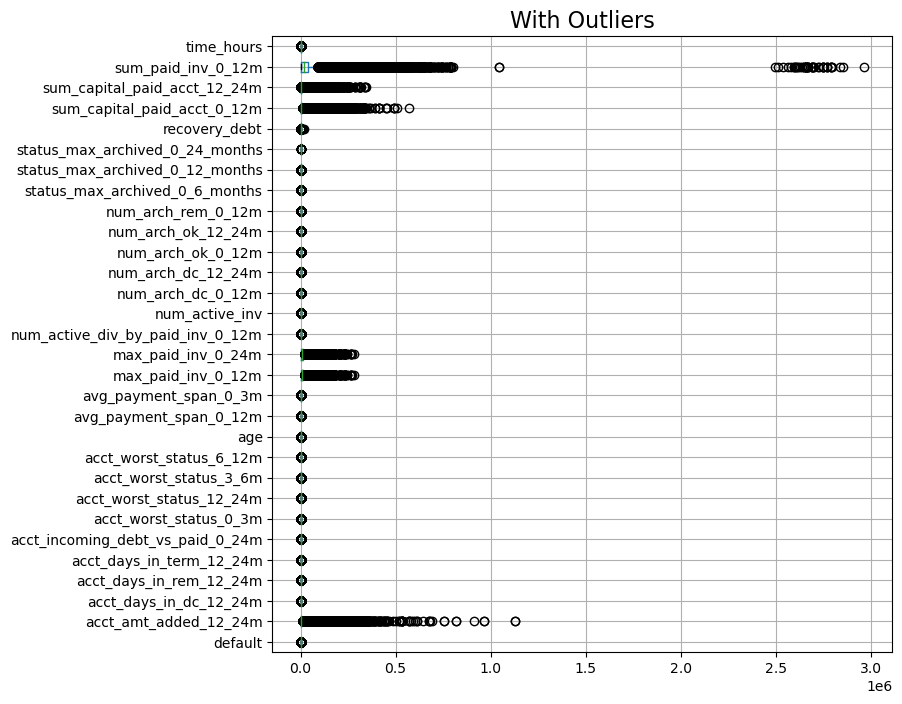

In [43]:
#cont = Default.select_dtypes(include=np.number).columns
plt.figure(figsize=(8,8))
df_num.boxplot(vert=0)
plt.title('With Outliers',fontsize=16)
plt.show();

In [44]:
UL = df_num.quantile(0.99)
LL = df_num.quantile(0.01)

In [45]:
((df_num > UL) | (df_num < LL)).sum()

default                                0
acct_amt_added_12_24m                900
acct_days_in_dc_12_24m               232
acct_days_in_rem_12_24m              892
acct_days_in_term_12_24m             863
acct_incoming_debt_vs_paid_0_24m     900
acct_worst_status_0_3m               496
acct_worst_status_12_24m             233
acct_worst_status_3_6m               591
acct_worst_status_6_12m              814
age                                  896
avg_payment_span_0_12m               899
avg_payment_span_0_3m                814
max_paid_inv_0_12m                   900
max_paid_inv_0_24m                   898
num_active_div_by_paid_inv_0_12m     511
num_active_inv                       803
num_arch_dc_0_12m                    872
num_arch_dc_12_24m                   872
num_arch_ok_0_12m                    894
num_arch_ok_12_24m                   893
num_arch_rem_0_12m                   853
status_max_archived_0_6_months         0
status_max_archived_0_12_months        5
status_max_archi

In [46]:
((df_num > UL) | (df_num < LL)).sum().sum()

20721

In [47]:
for column in lstnumericcolumns:
    df_num[column] = np.where(df_num[column] > UL[column], UL[column], df_num[column])
    df_num[column] = np.where(df_num[column] < LL[column], LL[column], df_num[column])

In [48]:
((df_num > UL) | (df_num < LL)).sum().sum()

0

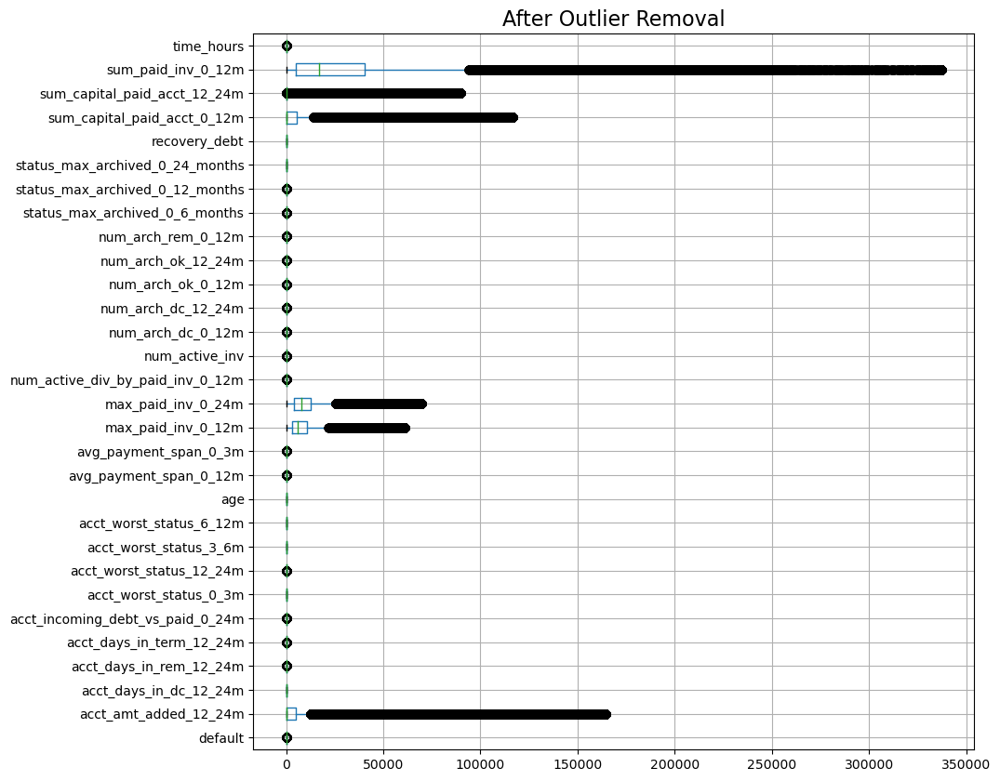

In [49]:
plt.figure(figsize=(10,10))
df_num.boxplot(vert=0)
plt.title('After Outlier Removal',fontsize=16)
plt.show();

In [50]:
def univariateAnalysis_numeric(column,nbins):
    print("Description of " + str(column))
    print("----------------------------------------------------------------------------")
    print(df_num[column].describe(),end=' ')
    print('\n\nSkew :',round(df_num[column].skew(),2))
    print('\n')
    plt.figure(figsize=(15,4))
    print("Distribution of " + str(column))
    print("----------------------------------------------------------------------------")
    plt.subplot(1,2,1)
    df_num[column].hist(bins=10, grid=False)
    plt.ylabel('count')
    plt.subplot(1,2,2)
    sns.boxplot(x=df_num[column])
    plt.show()

Description of default
----------------------------------------------------------------------------
count   89976.00
mean        0.01
std         0.12
min         0.00
25%         0.00
50%         0.00
75%         0.00
max         1.00
Name: default, dtype: float64 

Skew : 8.18


Distribution of default
----------------------------------------------------------------------------


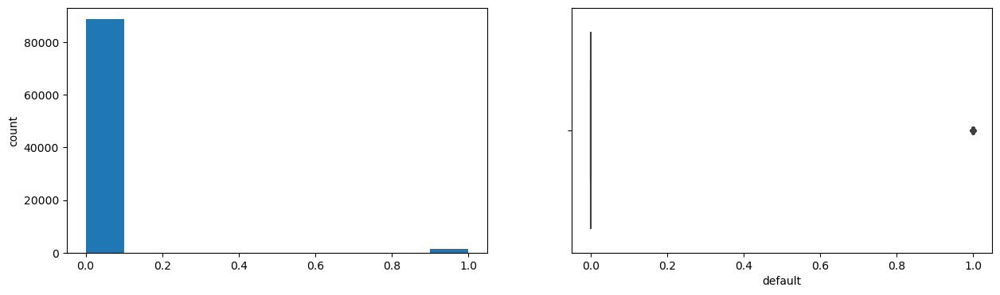

Description of acct_amt_added_12_24m
----------------------------------------------------------------------------
count    89976.00
mean     11456.43
std      28714.61
min          0.00
25%          0.00
50%          0.00
75%       4984.25
max     164684.50
Name: acct_amt_added_12_24m, dtype: float64 

Skew : 3.37


Distribution of acct_amt_added_12_24m
----------------------------------------------------------------------------


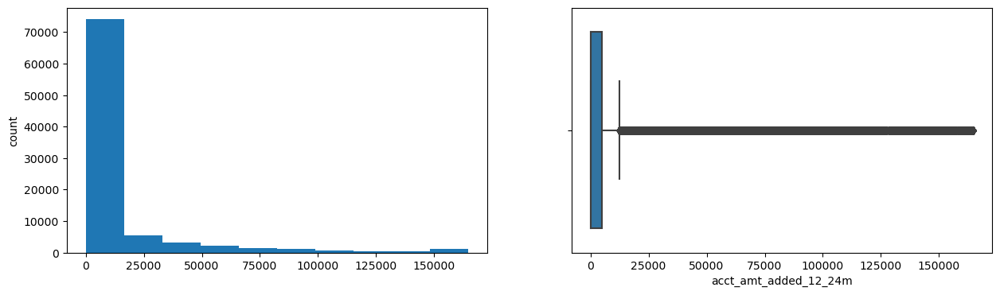

Description of acct_days_in_dc_12_24m
----------------------------------------------------------------------------
count   89976.00
mean        0.00
std         0.00
min         0.00
25%         0.00
50%         0.00
75%         0.00
max         0.00
Name: acct_days_in_dc_12_24m, dtype: float64 

Skew : 0.0


Distribution of acct_days_in_dc_12_24m
----------------------------------------------------------------------------


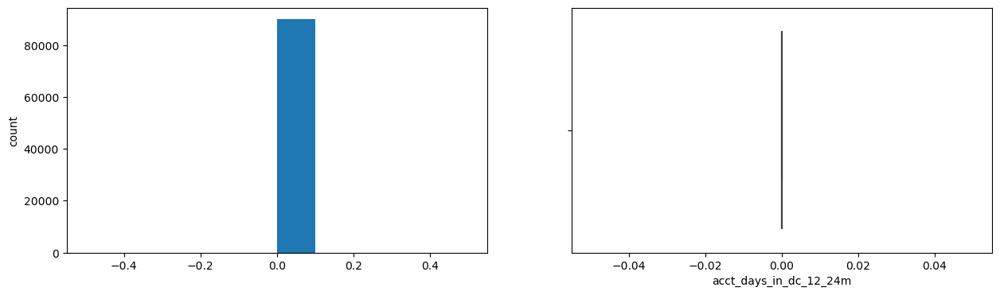

Description of acct_days_in_rem_12_24m
----------------------------------------------------------------------------
count   89976.00
mean        3.83
std        15.83
min         0.00
25%         0.00
50%         0.00
75%         0.00
max       108.00
Name: acct_days_in_rem_12_24m, dtype: float64 

Skew : 5.0


Distribution of acct_days_in_rem_12_24m
----------------------------------------------------------------------------


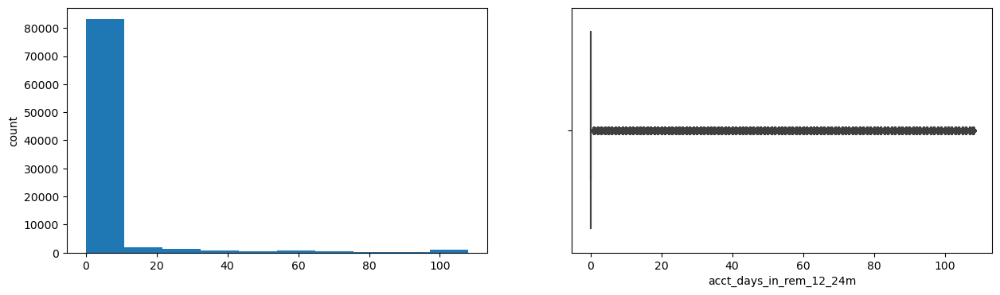

Description of acct_days_in_term_12_24m
----------------------------------------------------------------------------
count   89976.00
mean        0.08
std         0.72
min         0.00
25%         0.00
50%         0.00
75%         0.00
max         7.00
Name: acct_days_in_term_12_24m, dtype: float64 

Skew : 9.4


Distribution of acct_days_in_term_12_24m
----------------------------------------------------------------------------


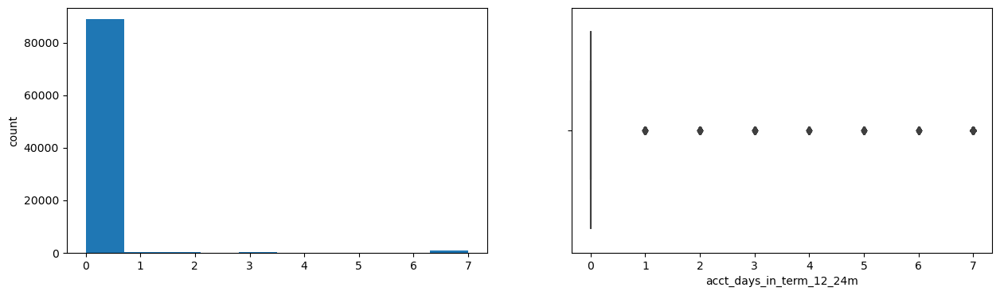

Description of acct_incoming_debt_vs_paid_0_24m
----------------------------------------------------------------------------
count   89976.00
mean        0.24
std         0.80
min         0.00
25%         0.00
50%         0.00
75%         0.00
max         6.05
Name: acct_incoming_debt_vs_paid_0_24m, dtype: float64 

Skew : 5.34


Distribution of acct_incoming_debt_vs_paid_0_24m
----------------------------------------------------------------------------


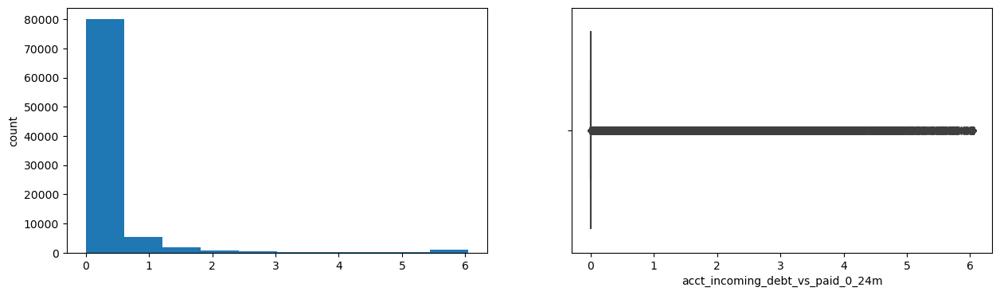

Description of acct_worst_status_0_3m
----------------------------------------------------------------------------
count   89976.00
mean        0.53
std         0.63
min         0.00
25%         0.00
50%         0.00
75%         1.00
max         2.00
Name: acct_worst_status_0_3m, dtype: float64 

Skew : 0.77


Distribution of acct_worst_status_0_3m
----------------------------------------------------------------------------


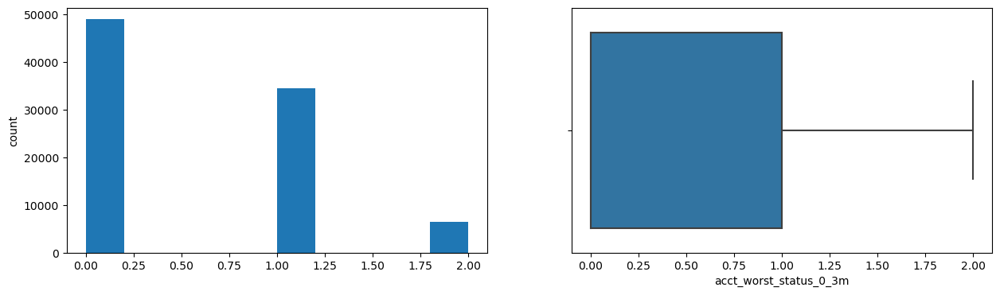

Description of acct_worst_status_12_24m
----------------------------------------------------------------------------
count   89976.00
mean        0.44
std         0.70
min         0.00
25%         0.00
50%         0.00
75%         1.00
max         3.00
Name: acct_worst_status_12_24m, dtype: float64 

Skew : 1.49


Distribution of acct_worst_status_12_24m
----------------------------------------------------------------------------


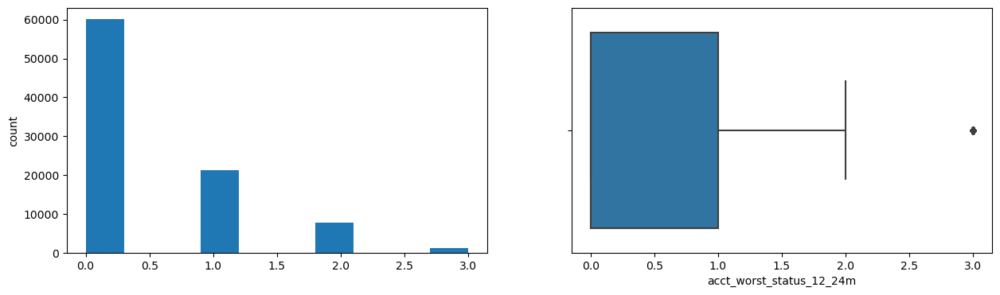

Description of acct_worst_status_3_6m
----------------------------------------------------------------------------
count   89976.00
mean        0.49
std         0.63
min         0.00
25%         0.00
50%         0.00
75%         1.00
max         2.00
Name: acct_worst_status_3_6m, dtype: float64 

Skew : 0.89


Distribution of acct_worst_status_3_6m
----------------------------------------------------------------------------


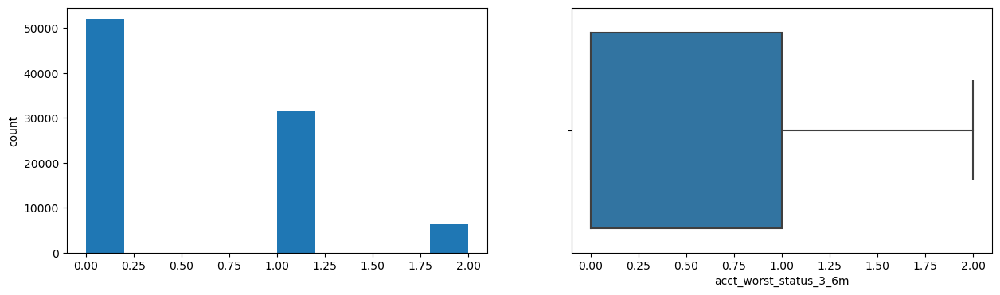

Description of acct_worst_status_6_12m
----------------------------------------------------------------------------
count   89976.00
mean        0.49
std         0.65
min         0.00
25%         0.00
50%         0.00
75%         1.00
max         2.00
Name: acct_worst_status_6_12m, dtype: float64 

Skew : 1.01


Distribution of acct_worst_status_6_12m
----------------------------------------------------------------------------


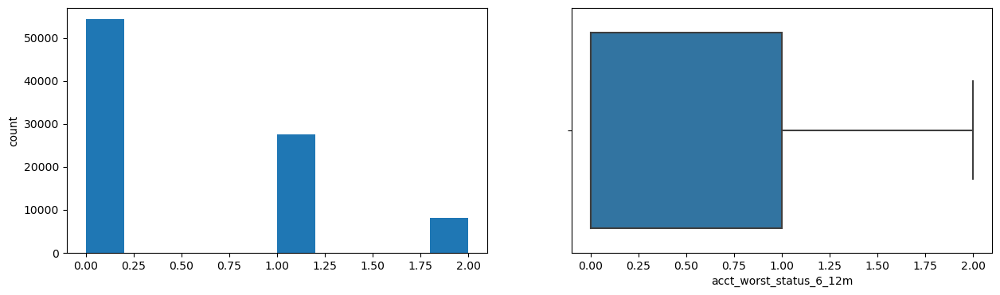

Description of age
----------------------------------------------------------------------------
count   89976.00
mean       35.96
std        12.82
min        18.00
25%        25.00
50%        34.00
75%        45.00
max        70.00
Name: age, dtype: float64 

Skew : 0.61


Distribution of age
----------------------------------------------------------------------------


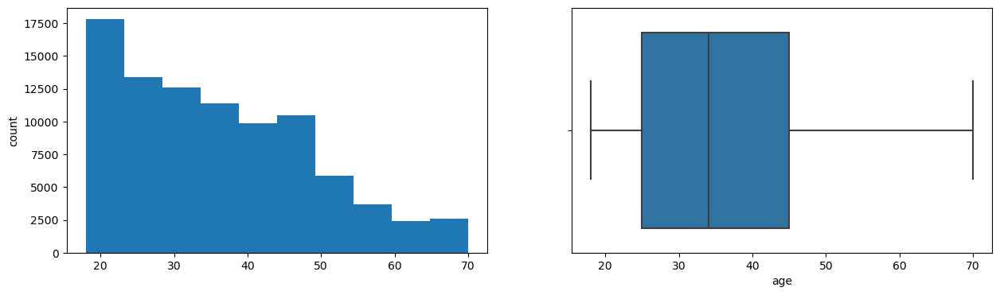

Description of avg_payment_span_0_12m
----------------------------------------------------------------------------
count   89976.00
mean       13.46
std        12.27
min         0.00
25%         2.00
50%        12.50
75%        18.60
max        60.50
Name: avg_payment_span_0_12m, dtype: float64 

Skew : 1.29


Distribution of avg_payment_span_0_12m
----------------------------------------------------------------------------


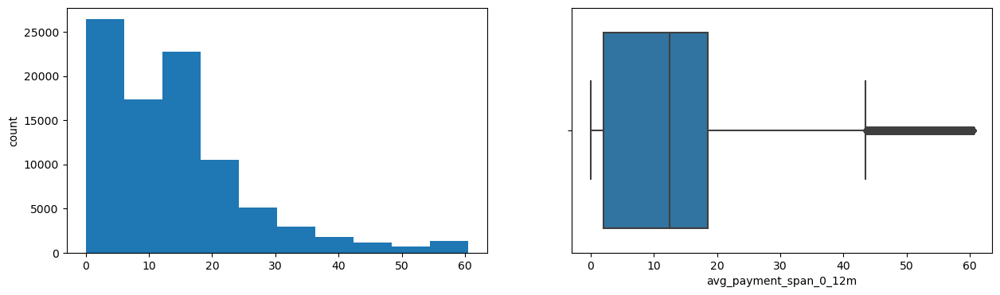

Description of avg_payment_span_0_3m
----------------------------------------------------------------------------
count   89976.00
mean        7.50
std        10.10
min         0.00
25%         0.00
50%         0.00
75%        13.20
max        47.00
Name: avg_payment_span_0_3m, dtype: float64 

Skew : 1.59


Distribution of avg_payment_span_0_3m
----------------------------------------------------------------------------


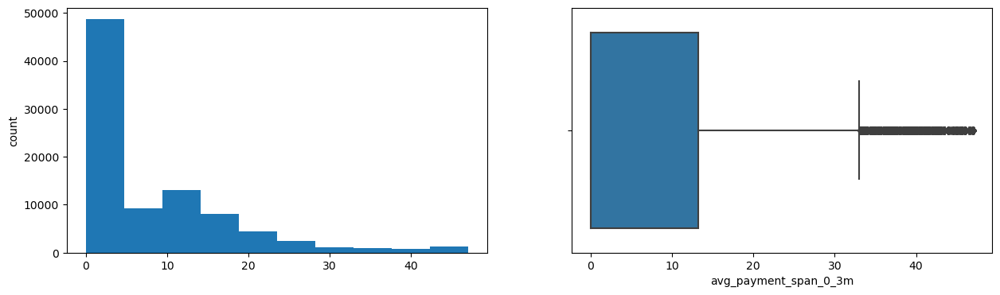

Description of max_paid_inv_0_12m
----------------------------------------------------------------------------
count   89976.00
mean     8661.44
std     10086.13
min         0.00
25%      2990.00
50%      6180.00
75%     10573.00
max     61062.50
Name: max_paid_inv_0_12m, dtype: float64 

Skew : 2.76


Distribution of max_paid_inv_0_12m
----------------------------------------------------------------------------


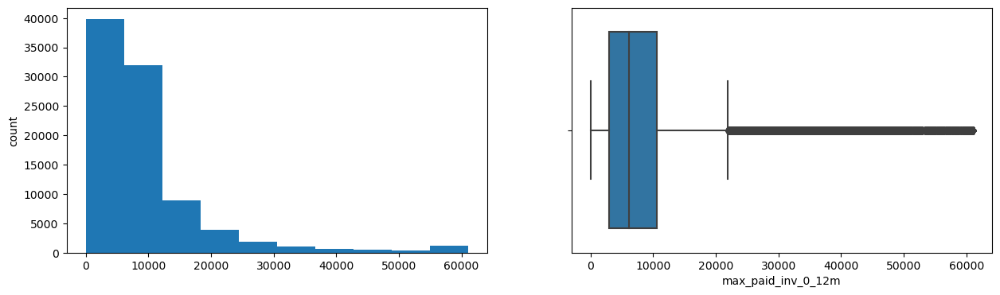

Description of max_paid_inv_0_24m
----------------------------------------------------------------------------
count   89976.00
mean    10639.50
std     11624.16
min         0.00
25%      4260.00
50%      7750.00
75%     12800.00
max     69758.00
Name: max_paid_inv_0_24m, dtype: float64 

Skew : 2.66


Distribution of max_paid_inv_0_24m
----------------------------------------------------------------------------


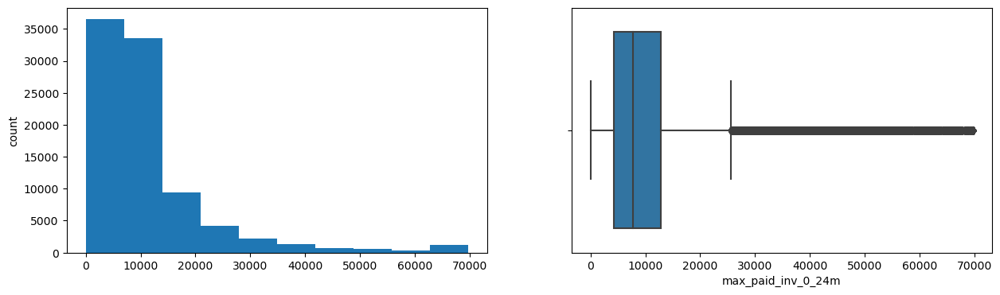

Description of num_active_div_by_paid_inv_0_12m
----------------------------------------------------------------------------
count   89976.00
mean        0.07
std         0.19
min         0.00
25%         0.00
50%         0.00
75%         0.03
max         1.00
Name: num_active_div_by_paid_inv_0_12m, dtype: float64 

Skew : 3.6


Distribution of num_active_div_by_paid_inv_0_12m
----------------------------------------------------------------------------


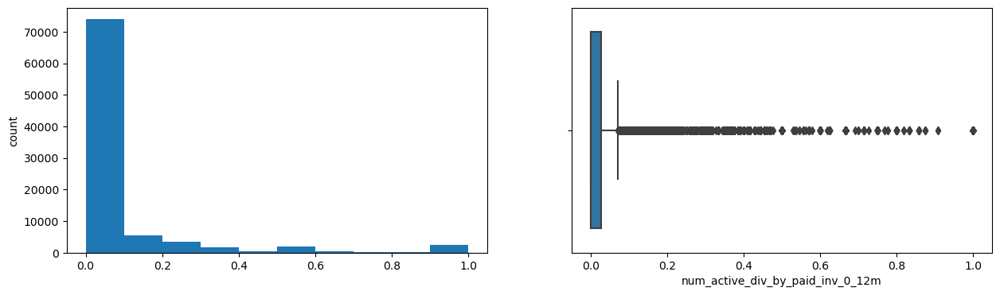

Description of num_active_inv
----------------------------------------------------------------------------
count   89976.00
mean        0.51
std         1.07
min         0.00
25%         0.00
50%         0.00
75%         1.00
max         6.00
Name: num_active_inv, dtype: float64 

Skew : 2.96


Distribution of num_active_inv
----------------------------------------------------------------------------


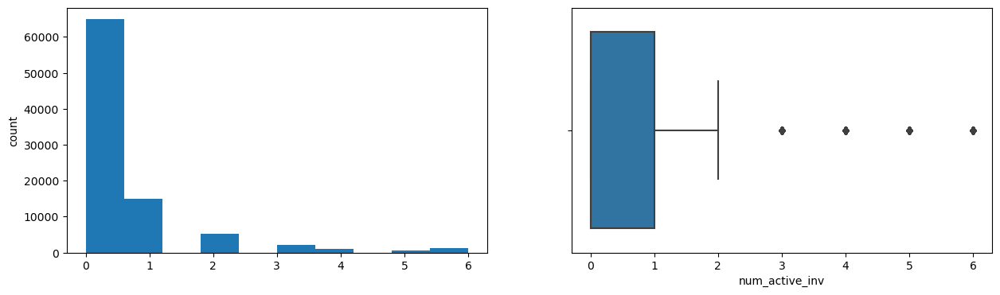

Description of num_arch_dc_0_12m
----------------------------------------------------------------------------
count   89976.00
mean        0.04
std         0.19
min         0.00
25%         0.00
50%         0.00
75%         0.00
max         1.00
Name: num_arch_dc_0_12m, dtype: float64 

Skew : 4.83


Distribution of num_arch_dc_0_12m
----------------------------------------------------------------------------


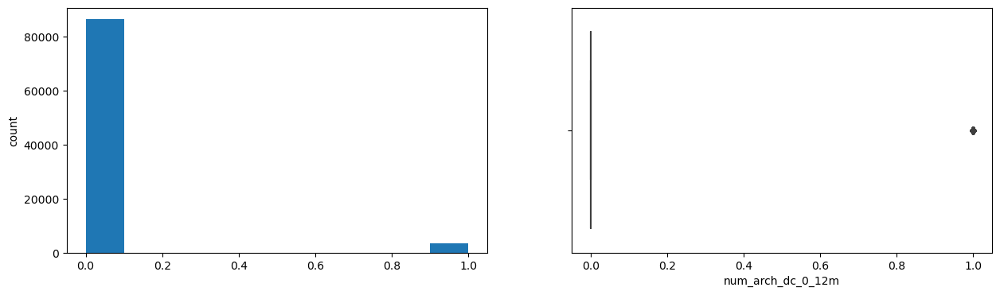

Description of num_arch_dc_12_24m
----------------------------------------------------------------------------
count   89976.00
mean        0.04
std         0.19
min         0.00
25%         0.00
50%         0.00
75%         0.00
max         1.00
Name: num_arch_dc_12_24m, dtype: float64 

Skew : 5.0


Distribution of num_arch_dc_12_24m
----------------------------------------------------------------------------


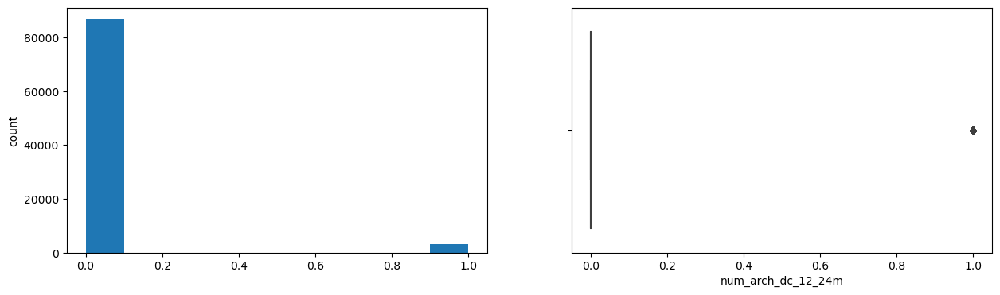

Description of num_arch_ok_0_12m
----------------------------------------------------------------------------
count   89976.00
mean        6.86
std        12.72
min         0.00
25%         1.00
50%         3.00
75%         7.00
max        81.00
Name: num_arch_ok_0_12m, dtype: float64 

Skew : 3.73


Distribution of num_arch_ok_0_12m
----------------------------------------------------------------------------


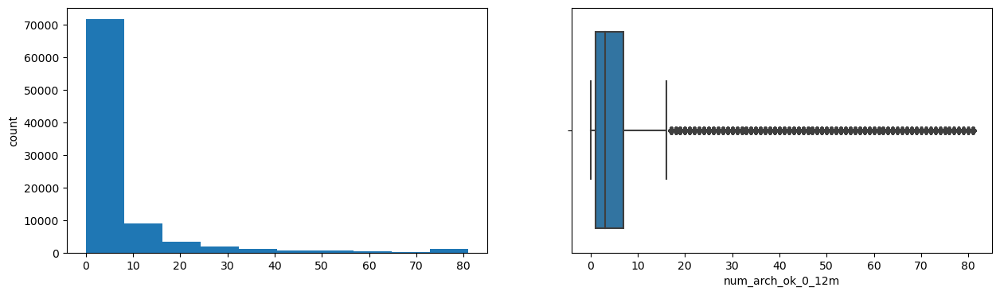

Description of num_arch_ok_12_24m
----------------------------------------------------------------------------
count   89976.00
mean        5.90
std        11.59
min         0.00
25%         0.00
50%         2.00
75%         6.00
max        73.00
Name: num_arch_ok_12_24m, dtype: float64 

Skew : 3.69


Distribution of num_arch_ok_12_24m
----------------------------------------------------------------------------


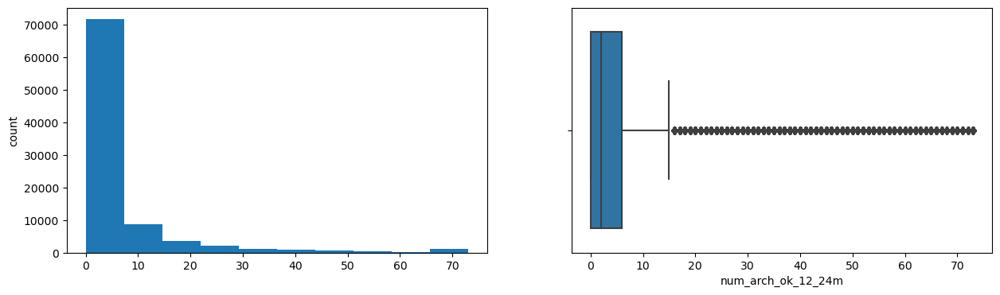

Description of num_arch_rem_0_12m
----------------------------------------------------------------------------
count   89976.00
mean        0.39
std         0.93
min         0.00
25%         0.00
50%         0.00
75%         0.00
max         5.00
Name: num_arch_rem_0_12m, dtype: float64 

Skew : 3.06


Distribution of num_arch_rem_0_12m
----------------------------------------------------------------------------


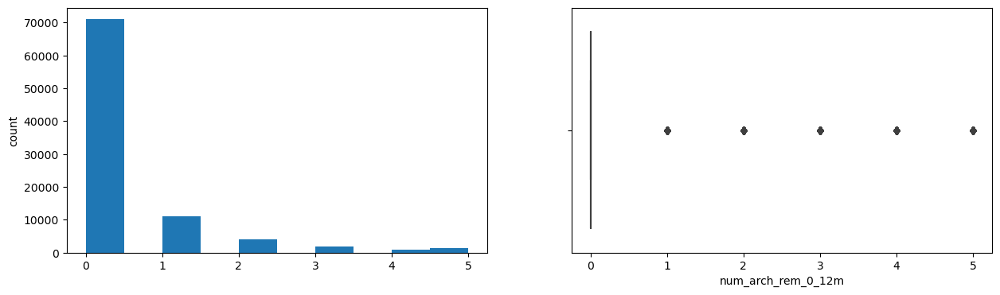

Description of status_max_archived_0_6_months
----------------------------------------------------------------------------
count   89976.00
mean        0.84
std         0.68
min         0.00
25%         0.00
50%         1.00
75%         1.00
max         3.00
Name: status_max_archived_0_6_months, dtype: float64 

Skew : 0.51


Distribution of status_max_archived_0_6_months
----------------------------------------------------------------------------


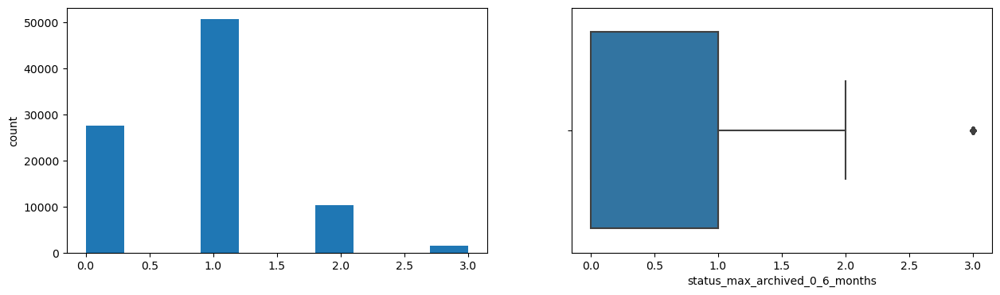

Description of status_max_archived_0_12_months
----------------------------------------------------------------------------
count   89976.00
mean        1.07
std         0.73
min         0.00
25%         1.00
50%         1.00
75%         1.00
max         3.00
Name: status_max_archived_0_12_months, dtype: float64 

Skew : 0.49


Distribution of status_max_archived_0_12_months
----------------------------------------------------------------------------


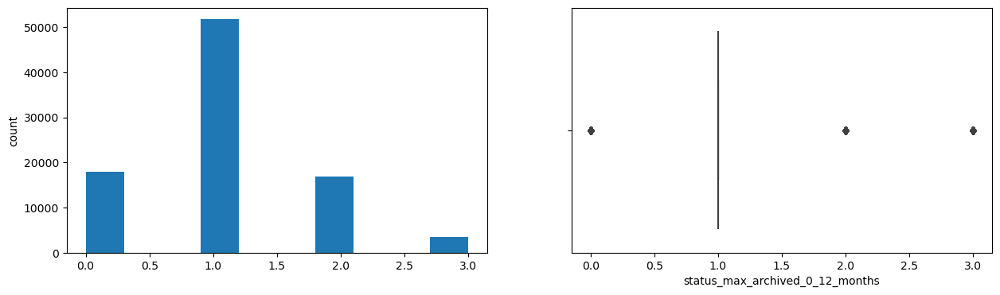

Description of status_max_archived_0_24_months
----------------------------------------------------------------------------
count   89976.00
mean        1.22
std         0.78
min         0.00
25%         1.00
50%         1.00
75%         2.00
max         3.00
Name: status_max_archived_0_24_months, dtype: float64 

Skew : 0.41


Distribution of status_max_archived_0_24_months
----------------------------------------------------------------------------


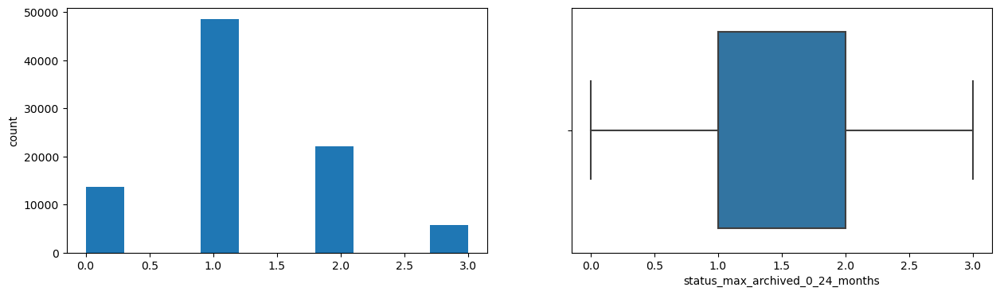

Description of recovery_debt
----------------------------------------------------------------------------
count   89976.00
mean        0.00
std         0.00
min         0.00
25%         0.00
50%         0.00
75%         0.00
max         0.00
Name: recovery_debt, dtype: float64 

Skew : 0.0


Distribution of recovery_debt
----------------------------------------------------------------------------


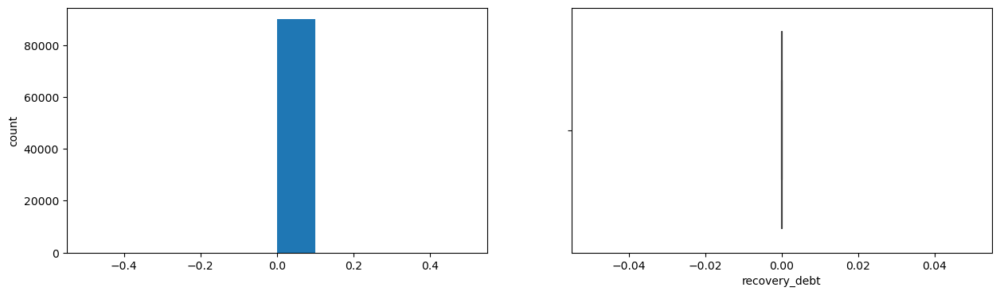

Description of sum_capital_paid_acct_0_12m
----------------------------------------------------------------------------
count    89976.00
mean      9094.90
std      21143.24
min          0.00
25%          0.00
50%          0.00
75%       5685.00
max     116525.50
Name: sum_capital_paid_acct_0_12m, dtype: float64 

Skew : 3.07


Distribution of sum_capital_paid_acct_0_12m
----------------------------------------------------------------------------


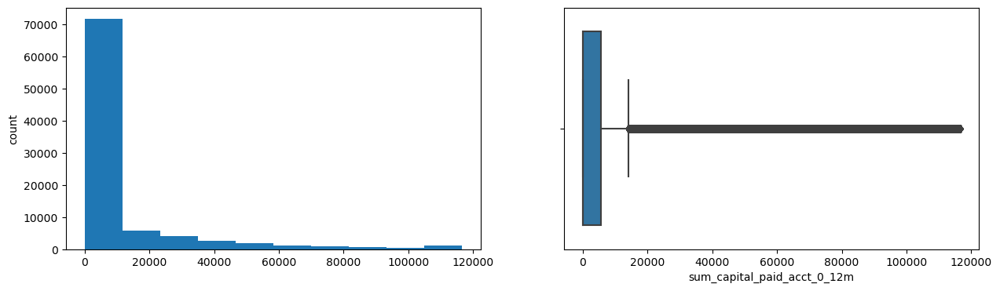

Description of sum_capital_paid_acct_12_24m
----------------------------------------------------------------------------
count   89976.00
mean     5499.19
std     15156.79
min         0.00
25%         0.00
50%         0.00
75%         0.00
max     89917.50
Name: sum_capital_paid_acct_12_24m, dtype: float64 

Skew : 3.63


Distribution of sum_capital_paid_acct_12_24m
----------------------------------------------------------------------------


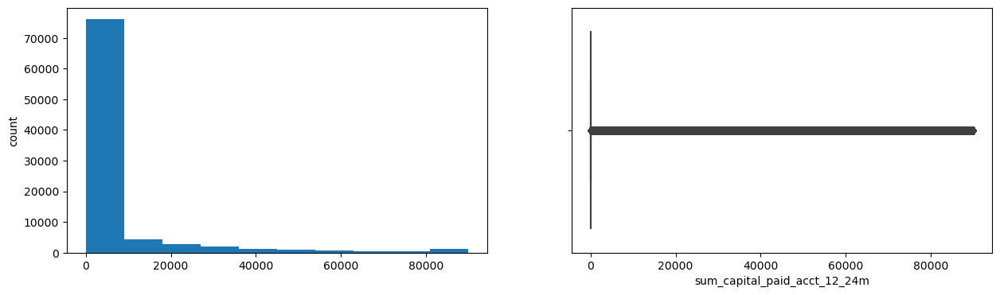

Description of sum_paid_inv_0_12m
----------------------------------------------------------------------------
count    89976.00
mean     35914.23
std      55889.60
min          0.00
25%       4889.50
50%      17085.00
75%      40533.50
max     337365.00
Name: sum_paid_inv_0_12m, dtype: float64 

Skew : 3.13


Distribution of sum_paid_inv_0_12m
----------------------------------------------------------------------------


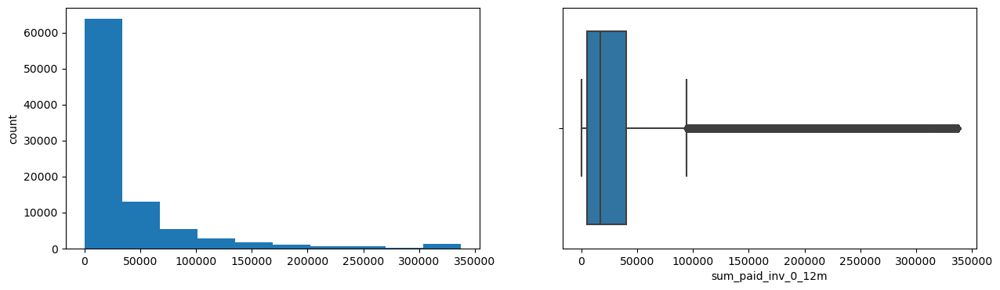

Description of time_hours
----------------------------------------------------------------------------
count   89976.00
mean       15.40
std         4.73
min         1.01
25%        12.17
50%        15.82
75%        19.18
max        23.43
Name: time_hours, dtype: float64 

Skew : -0.55


Distribution of time_hours
----------------------------------------------------------------------------


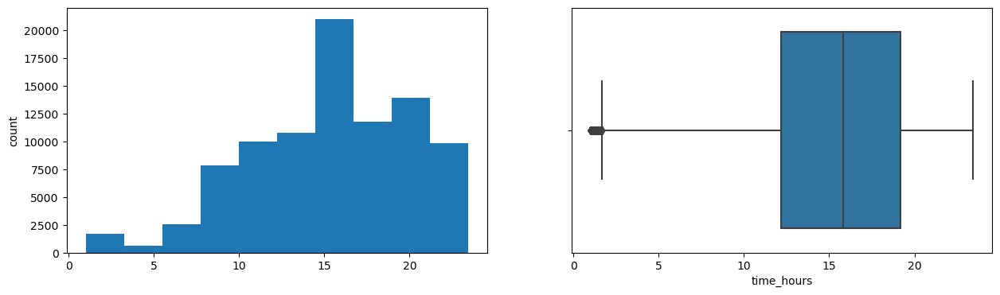

In [51]:
for x in lstnumericcolumns:
    univariateAnalysis_numeric(x,20)

In [52]:
df_cat = Default.select_dtypes(include=['object'])
lstcatcolumns = list(df_cat.columns.values)
lstcatcolumns

['acct_status',
 'merchant_category',
 'merchant_group',
 'has_paid',
 'name_in_email']

In [53]:
def univariateAnalysis_category(cat_column):
    print("Details of " + cat_column)
    print("----------------------------------------------------------------")
    print(df_cat[cat_column].value_counts())
    plt.figure(figsize=(18,6))
    ax=df_cat[cat_column].value_counts().plot.bar(title="Frequency Distribution of " + cat_column)
    #ax=sns.countplot(data=Auto_Motor_Company,x='Marital_status')
    ax.bar_label(ax.containers[0]);
    plt.show()
    print("       ")

Details of acct_status
----------------------------------------------------------------
acct_status
0.00    50631
1.00    39345
Name: count, dtype: int64


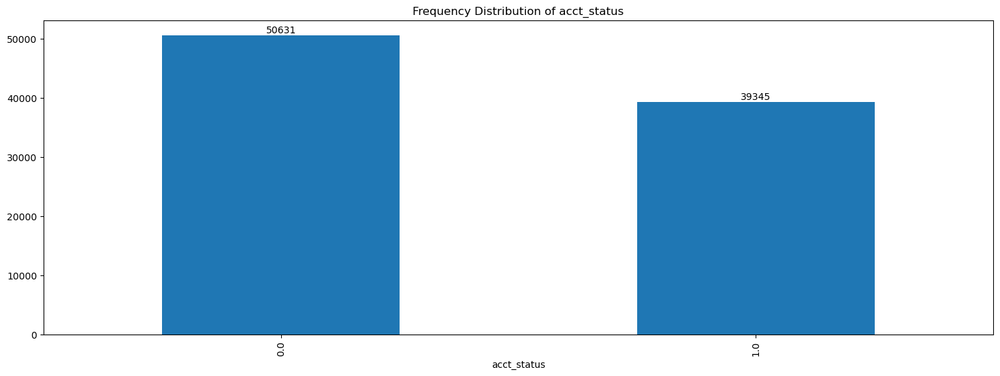

       
Details of merchant_category
----------------------------------------------------------------
merchant_category
Diversified entertainment                                  34781
Youthful Shoes & Clothing                                  10524
Books & Magazines                                           8447
General Shoes & Clothing                                    4162
Concept stores & Miscellaneous                              3969
Sports gear & Outdoor                                       3356
Dietary supplements                                         2777
Diversified children products                               2691
Diversified electronics                                     1627
Prints & Photos                                             1502
Children Clothes & Nurturing products                       1357
Pet supplies                                                1185
Electronic equipment & Related accessories                   946
Hobby articles                     

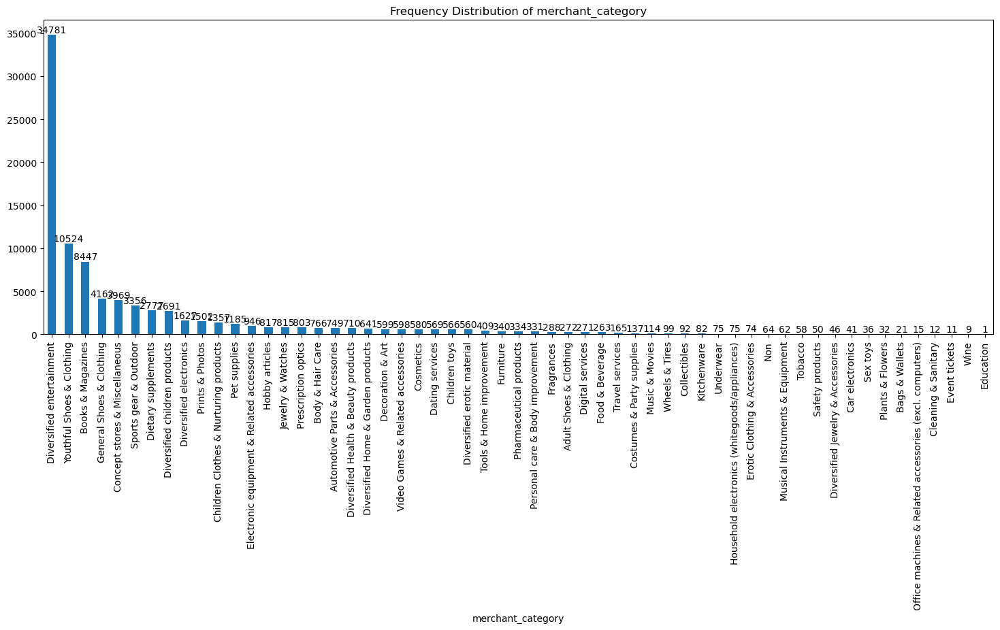

       
Details of merchant_group
----------------------------------------------------------------
merchant_group
Entertainment            43949
Clothing & Shoes         15033
Leisure                   9935
Health & Beauty           6589
Children Products         4614
Home & Garden             3350
Electronics               2704
Intangible products       1017
Jewelry & Accessories      946
Automotive Products        848
Erotic Materials           670
Food & Beverage            321
Name: count, dtype: int64


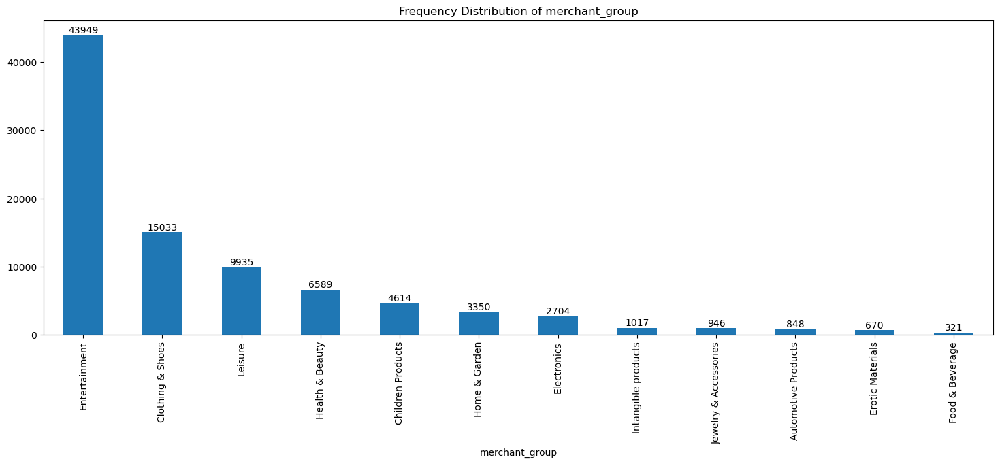

       
Details of has_paid
----------------------------------------------------------------
has_paid
True     79231
False    10745
Name: count, dtype: int64


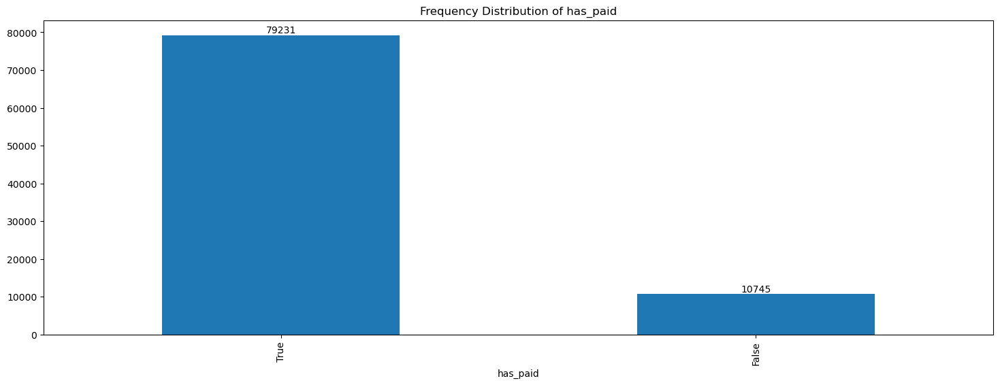

       
Details of name_in_email
----------------------------------------------------------------
name_in_email
F L         38087
Unknown     23019
L F         12881
F            8225
Nick         6697
L            1048
Initials       19
Name: count, dtype: int64


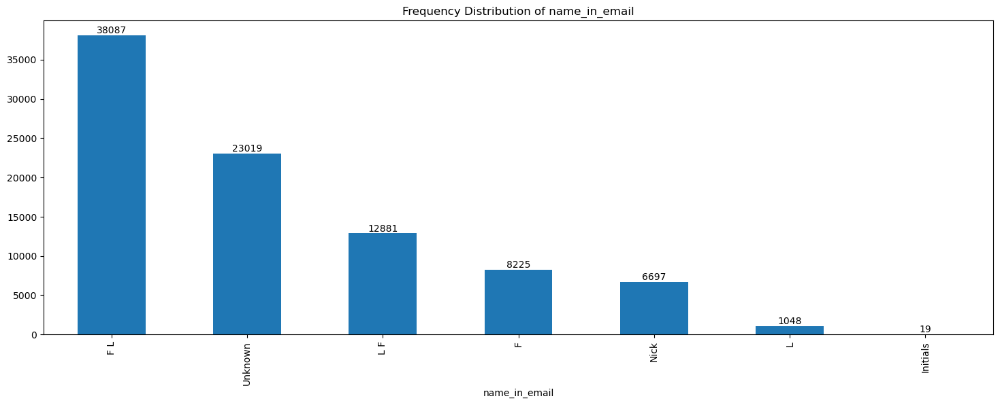

In [54]:
for x in lstcatcolumns:
    univariateAnalysis_category(x)

In [55]:
combined_df = pd.concat([df_num, df_cat], axis=1)

In [56]:
combined_df.head()

,default,acct_amt_added_12_24m,acct_days_in_dc_12_24m,acct_days_in_rem_12_24m,acct_days_in_term_12_24m,acct_incoming_debt_vs_paid_0_24m,acct_worst_status_0_3m,acct_worst_status_12_24m,acct_worst_status_3_6m,acct_worst_status_6_12m,...,recovery_debt,sum_capital_paid_acct_0_12m,sum_capital_paid_acct_12_24m,sum_paid_inv_0_12m,time_hours,acct_status,merchant_category,merchant_group,has_paid,name_in_email
0,0.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00,1.00,0.00,...,0.00,0.00,0.00,178839.00,9.65,1.00,Dietary supplements,Health & Beauty,True,Unknown
1,0.00,0.00,0.00,0.00,0.00,0.00,1.00,1.00,1.00,1.00,...,0.00,0.00,0.00,49014.00,13.18,1.00,Books & Magazines,Entertainment,True,F L
2,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,0.00,0.00,0.00,124839.00,11.56,0.00,Diversified entertainment,Entertainment,True,L F
3,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,0.00,0.00,0.00,324676.00,15.75,0.00,Diversified entertainment,Entertainment,True,F L
4,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,0.00,0.00,0.00,7100.00,12.70,0.00,Electronic equipment & Related accessories,Electronics,True,F L


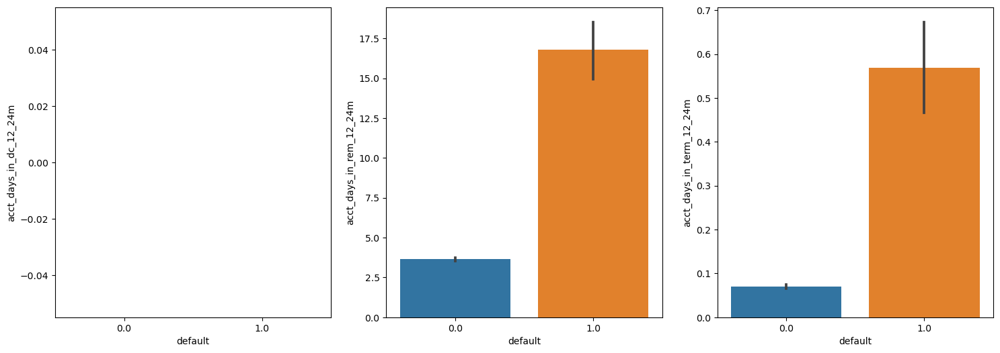

In [57]:
plt.figure(figsize = (18, 6))

plt.subplot(1, 3, 1)
sns.barplot(x='default', y='acct_days_in_dc_12_24m', data=combined_df)

plt.subplot(1, 3, 2)
sns.barplot(x='default', y='acct_days_in_rem_12_24m', data=combined_df)

plt.subplot(1, 3, 3)
sns.barplot(x='default', y='acct_days_in_term_12_24m', data=combined_df)

plt.show()

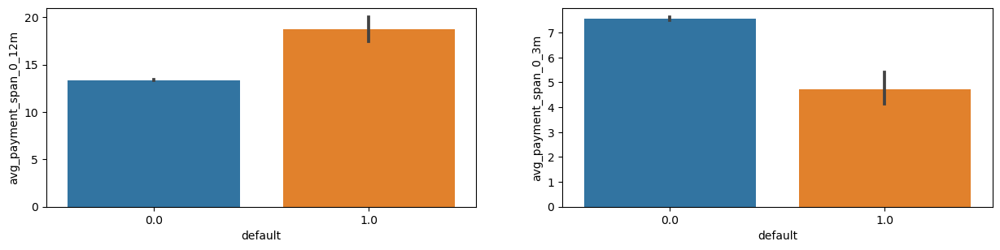

In [58]:
plt.figure(figsize = (15, 7))

plt.subplot(2, 2, 1)
sns.barplot(x='default', y='avg_payment_span_0_12m', data=combined_df)

plt.subplot(2, 2, 2)
sns.barplot(x='default', y='avg_payment_span_0_3m', data=combined_df)

plt.show();

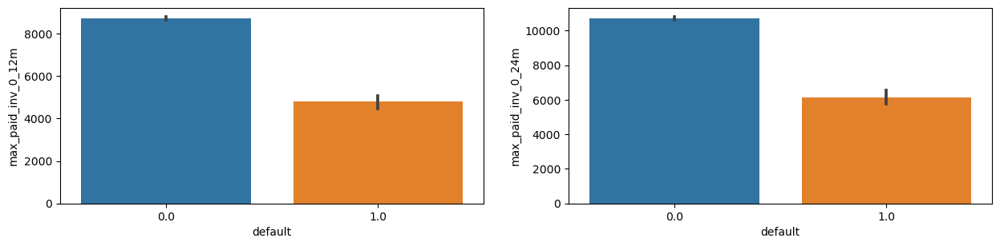

In [59]:
plt.figure(figsize = (15, 7))

plt.subplot(2, 2, 1)
sns.barplot(x='default', y='max_paid_inv_0_12m', data=combined_df)

plt.subplot(2, 2, 2)
sns.barplot(x='default', y='max_paid_inv_0_24m', data=combined_df)


plt.show();

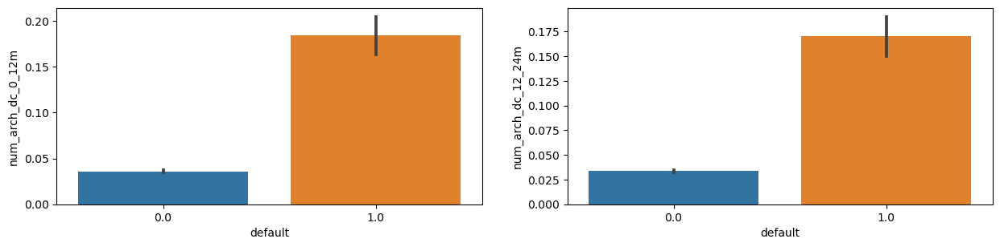

In [60]:
plt.figure(figsize = (15, 7))

plt.subplot(2, 2, 1)
sns.barplot(x='default', y='num_arch_dc_0_12m', data=combined_df)

plt.subplot(2, 2, 2)
sns.barplot(x='default', y='num_arch_dc_12_24m', data=combined_df)

plt.show();

<Axes: xlabel='default', ylabel='num_arch_ok_12_24m'>

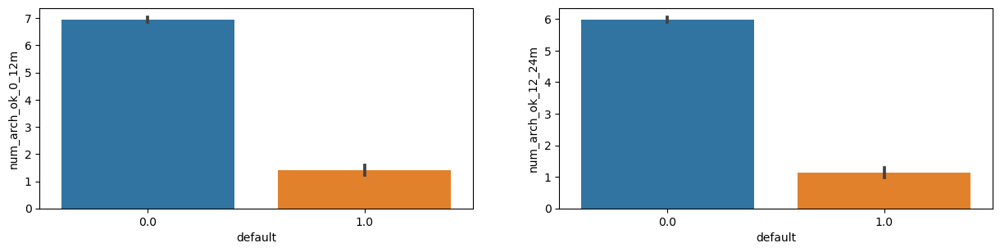

In [61]:
plt.figure(figsize = (15, 7))

plt.subplot(2, 2, 1)
sns.barplot(x='default', y='num_arch_ok_0_12m', data=combined_df)

plt.subplot(2, 2, 2)
sns.barplot(x='default', y='num_arch_ok_12_24m', data=combined_df)

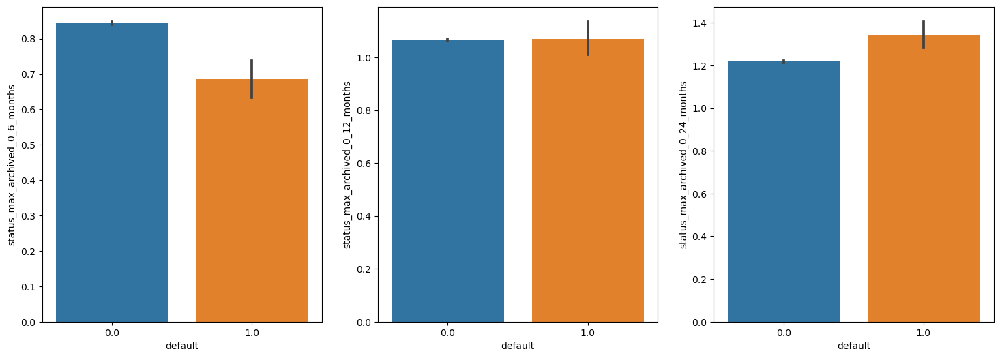

In [62]:
plt.figure(figsize = (18, 6))

plt.subplot(1, 3, 1)
sns.barplot(x='default', y='status_max_archived_0_6_months', data=combined_df)

plt.subplot(1, 3, 2)
sns.barplot(x='default', y='status_max_archived_0_12_months', data=combined_df)

plt.subplot(1, 3, 3)
sns.barplot(x='default', y='status_max_archived_0_24_months', data=combined_df)

plt.show();

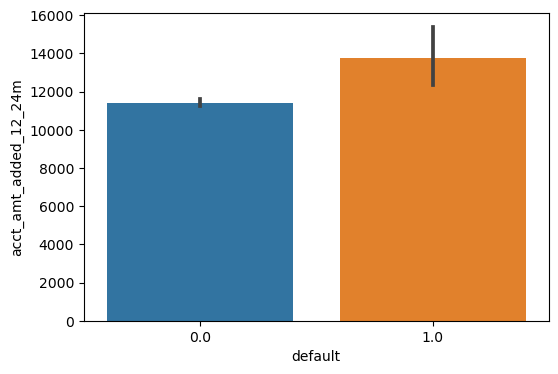

In [63]:
plt.figure(figsize = (6, 4))
sns.barplot(x='default', y='acct_amt_added_12_24m', data=combined_df)
plt.show()

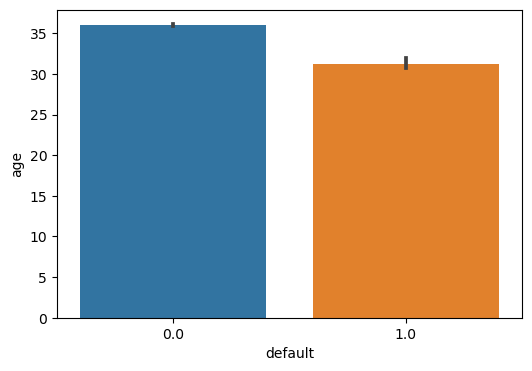

In [64]:
plt.figure(figsize = (6, 4))
sns.barplot(x='default', y='age', data=combined_df)
plt.show()

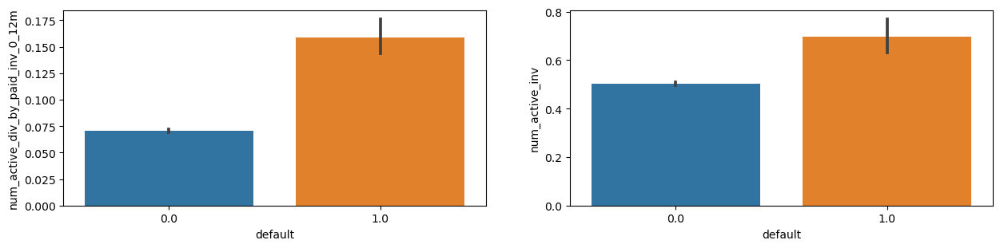

In [65]:
plt.figure(figsize = (15, 7))

plt.subplot(2, 2, 1)
sns.barplot(x='default', y='num_active_div_by_paid_inv_0_12m', data=combined_df)

plt.subplot(2, 2, 2)
sns.barplot(x='default', y='num_active_inv', data=combined_df)

plt.show()

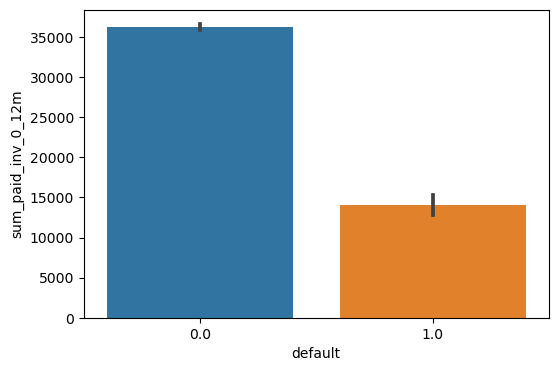

In [66]:
plt.figure(figsize = (6, 4))
sns.barplot(x='default', y='sum_paid_inv_0_12m', data=combined_df)
plt.show()

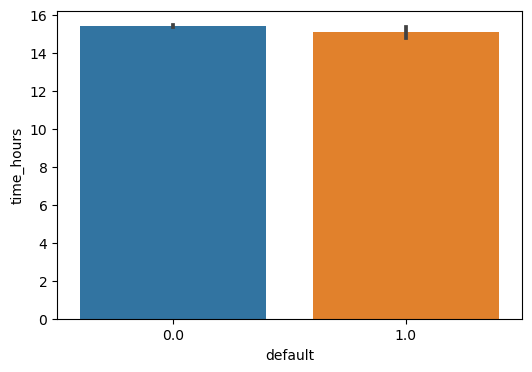

In [67]:
plt.figure(figsize = (6, 4))
sns.barplot(x='default', y='time_hours', data=combined_df)

plt.show()

In [68]:
merchant_category_counts = combined_df.groupby(['default', 'merchant_category']).size().unstack(fill_value=0)
merchant_category_counts = merchant_category_counts.transpose()
print(merchant_category_counts)


default                                              0.00  1.00
merchant_category                                              
Adult Shoes & Clothing                                265     7
Automotive Parts & Accessories                        738    11
Bags & Wallets                                         21     0
Body & Hair Care                                      752    14
Books & Magazines                                    8400    47
Car electronics                                        39     2
Children Clothes & Nurturing products                1338    19
Children toys                                         562     4
Cleaning & Sanitary                                    12     0
Collectibles                                           89     3
Concept stores & Miscellaneous                       3909    60
Cosmetics                                             559    21
Costumes & Party supplies                             135     2
Dating services                         

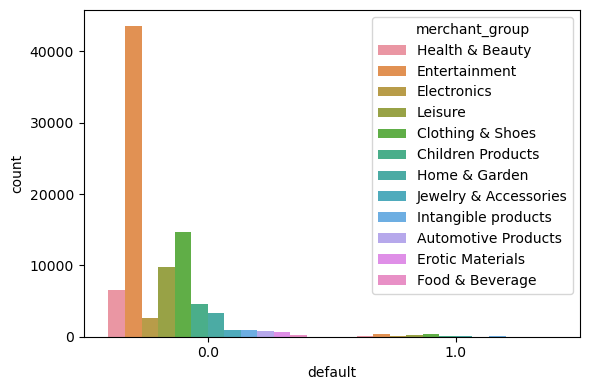

In [69]:
plt.figure(figsize = (6, 4))
sns.countplot(x='default', hue='merchant_group', data=combined_df)
plt.tight_layout() 
plt.show()

In [70]:
sns.pairplot(df_num, corner= True);

<Axes: >

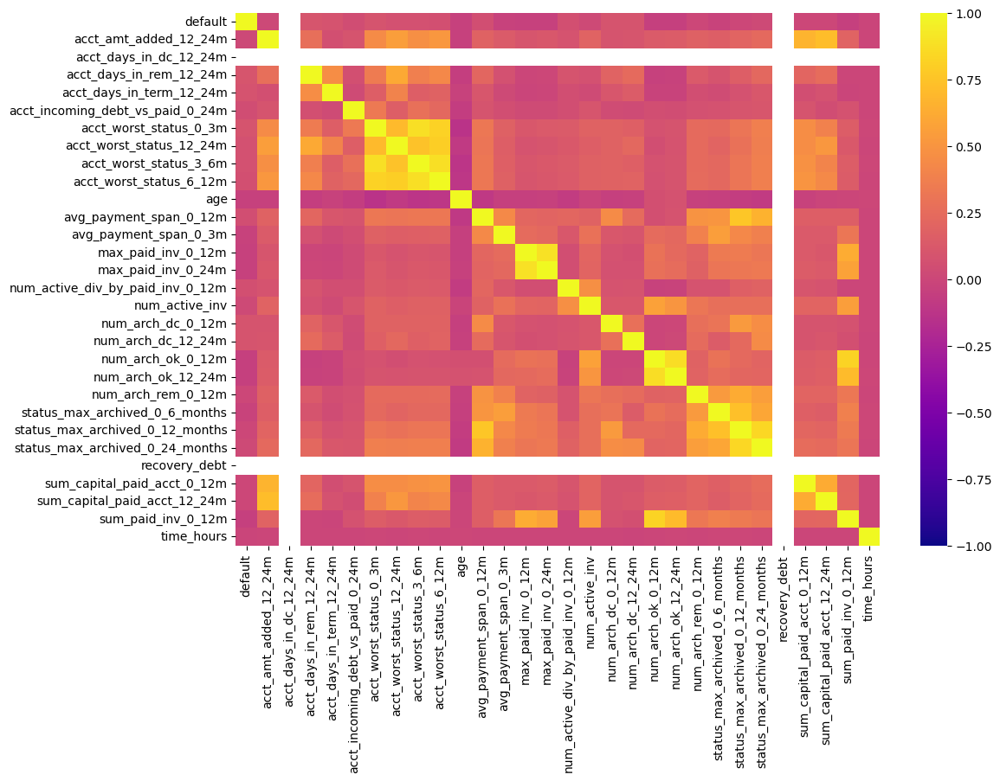

In [71]:
plt.figure(figsize = (12,8))
cor_matrix = df_num.corr()
sns.heatmap(cor_matrix, cmap = 'plasma', vmin = -1, vmax= 1)

In [72]:
df_num.columns

Index(['default', 'acct_amt_added_12_24m', 'acct_days_in_dc_12_24m',
       'acct_days_in_rem_12_24m', 'acct_days_in_term_12_24m',
       'acct_incoming_debt_vs_paid_0_24m', 'acct_worst_status_0_3m',
       'acct_worst_status_12_24m', 'acct_worst_status_3_6m',
       'acct_worst_status_6_12m', 'age', 'avg_payment_span_0_12m',
       'avg_payment_span_0_3m', 'max_paid_inv_0_12m', 'max_paid_inv_0_24m',
       'num_active_div_by_paid_inv_0_12m', 'num_active_inv',
       'num_arch_dc_0_12m', 'num_arch_dc_12_24m', 'num_arch_ok_0_12m',
       'num_arch_ok_12_24m', 'num_arch_rem_0_12m',
       'status_max_archived_0_6_months', 'status_max_archived_0_12_months',
       'status_max_archived_0_24_months', 'recovery_debt',
       'sum_capital_paid_acct_0_12m', 'sum_capital_paid_acct_12_24m',
       'sum_paid_inv_0_12m', 'time_hours'],
      dtype='object')

In [73]:
features_to_scale = df_num.drop(columns=['default'])

In [74]:
from sklearn.preprocessing import StandardScaler
X = StandardScaler()

In [75]:
#from sklearn.preprocessing import MinMaxScaler
#scaler = MinMaxScaler()

In [76]:
scaled_df = pd.DataFrame(X.fit_transform(features_to_scale), columns=features_to_scale.columns)

In [77]:
scaled_df.head()

,acct_amt_added_12_24m,acct_days_in_dc_12_24m,acct_days_in_rem_12_24m,acct_days_in_term_12_24m,acct_incoming_debt_vs_paid_0_24m,acct_worst_status_0_3m,acct_worst_status_12_24m,acct_worst_status_3_6m,acct_worst_status_6_12m,age,...,num_arch_ok_12_24m,num_arch_rem_0_12m,status_max_archived_0_6_months,status_max_archived_0_12_months,status_max_archived_0_24_months,recovery_debt,sum_capital_paid_acct_0_12m,sum_capital_paid_acct_12_24m,sum_paid_inv_0_12m,time_hours
0,-0.40,0.00,-0.24,-0.11,-0.30,0.75,-0.63,0.81,-0.74,-1.24,...,0.70,-0.41,0.23,-0.09,-0.28,0.00,-0.43,-0.36,2.56,-1.22
1,-0.40,0.00,-0.24,-0.11,-0.30,0.75,0.79,0.81,0.79,1.10,...,1.13,2.80,0.23,1.28,1.00,0.00,-0.43,-0.36,0.23,-0.47
2,-0.40,0.00,-0.24,-0.11,-0.30,-0.84,-0.63,-0.79,-0.74,-1.09,...,-0.51,2.80,0.23,1.28,1.00,0.00,-0.43,-0.36,1.59,-0.81
3,-0.40,0.00,-0.24,-0.11,-0.30,-0.84,-0.63,-0.79,-0.74,0.00,...,1.30,-0.41,0.23,-0.09,-0.28,0.00,-0.43,-0.36,5.17,0.07
4,-0.40,0.00,-0.24,-0.11,-0.30,-0.84,-0.63,-0.79,-0.74,-0.85,...,-0.51,-0.41,0.23,-0.09,-0.28,0.00,-0.43,-0.36,-0.52,-0.57


In [78]:
from sklearn.cluster import KMeans 
k_means = KMeans(n_clusters = 2,random_state=1)
k_means.fit(scaled_df)
round(k_means.inertia_,2)

1994217.78

In [79]:
k_means = KMeans(n_clusters = 1,random_state=1)
k_means.fit(scaled_df)
round(k_means.inertia_,2)

2429352.0

In [80]:
k_means = KMeans(n_clusters = 3,random_state=1)
k_means.fit(scaled_df)
round(k_means.inertia_,2)

1852839.69

In [81]:
k_means = KMeans(n_clusters = 4,random_state=1)
k_means.fit(scaled_df)
round(k_means.inertia_,2)

1681968.23

In [82]:
k_means = KMeans(n_clusters = 5,random_state=1)
k_means.fit(scaled_df)
round(k_means.inertia_,2)

1586335.47

In [83]:
k_means = KMeans(n_clusters = 6,random_state=1)
k_means.fit(scaled_df)
round(k_means.inertia_,2)

1482129.57

In [84]:
wss =[] 

In [85]:
for i in range(1,11):
    KM = KMeans(n_clusters=i,random_state=1).fit(scaled_df)
    wss.append(round(KM.inertia_,2))

In [86]:
wss

[2429352.0,
 1994217.78,
 1852839.69,
 1681968.23,
 1586335.47,
 1482129.57,
 1387381.03,
 1326352.16,
 1258610.07,
 1213000.57]

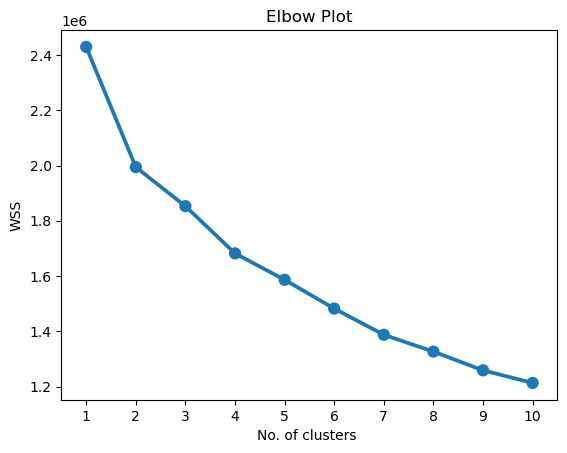

In [87]:
a=[1,2,3,4,5,6,7,8,9,10]
plt.title('Elbow Plot')
sns.pointplot(x=a, y=wss)
plt.xlabel('No. of clusters ')
plt.ylabel('WSS')
plt.show();

In [88]:
from sklearn.metrics import silhouette_samples, silhouette_score

In [89]:
# Silhouette Analysis
from sklearn.metrics import silhouette_score
range_n_clusters=[2,3,4,5,6,7,8,9,10]
for num_clusters in range_n_clusters:
    
    # initialize K means
    kmeans=KMeans(n_clusters=num_clusters, max_iter=50)
    kmeans.fit(scaled_df)
    cluster_labels=kmeans.labels_
    #Silhouette Score
    silhouette_avg = silhouette_score(scaled_df,cluster_labels)
    print("For n_clusters={0}, the silhouette score is {1}".format(num_clusters, silhouette_avg))

For n_clusters=2, the silhouette score is 0.2839701697037606
For n_clusters=3, the silhouette score is 0.26348923491664605
For n_clusters=4, the silhouette score is 0.09037497358905039
For n_clusters=5, the silhouette score is 0.12324918467091217
For n_clusters=6, the silhouette score is 0.1329229524536513
For n_clusters=7, the silhouette score is 0.14086633158789388
For n_clusters=8, the silhouette score is 0.15001376789580348
For n_clusters=9, the silhouette score is 0.13617726332434124
For n_clusters=10, the silhouette score is 0.13306576226451347


In [90]:
k_means = KMeans(n_clusters = 2, random_state=1)
k_means.fit(scaled_df)
labels = k_means.labels_

In [91]:
combined_df["Clus_kmeans"] = labels
combined_df.head()

,default,acct_amt_added_12_24m,acct_days_in_dc_12_24m,acct_days_in_rem_12_24m,acct_days_in_term_12_24m,acct_incoming_debt_vs_paid_0_24m,acct_worst_status_0_3m,acct_worst_status_12_24m,acct_worst_status_3_6m,acct_worst_status_6_12m,...,sum_capital_paid_acct_0_12m,sum_capital_paid_acct_12_24m,sum_paid_inv_0_12m,time_hours,acct_status,merchant_category,merchant_group,has_paid,name_in_email,Clus_kmeans
0,0.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00,1.00,0.00,...,0.00,0.00,178839.00,9.65,1.00,Dietary supplements,Health & Beauty,True,Unknown,1
1,0.00,0.00,0.00,0.00,0.00,0.00,1.00,1.00,1.00,1.00,...,0.00,0.00,49014.00,13.18,1.00,Books & Magazines,Entertainment,True,F L,1
2,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,0.00,0.00,124839.00,11.56,0.00,Diversified entertainment,Entertainment,True,L F,1
3,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,0.00,0.00,324676.00,15.75,0.00,Diversified entertainment,Entertainment,True,F L,0
4,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,0.00,0.00,7100.00,12.70,0.00,Electronic equipment & Related accessories,Electronics,True,F L,0


In [92]:
Cluster_0=combined_df[combined_df['Clus_kmeans']==0]
Cluster_0

,default,acct_amt_added_12_24m,acct_days_in_dc_12_24m,acct_days_in_rem_12_24m,acct_days_in_term_12_24m,acct_incoming_debt_vs_paid_0_24m,acct_worst_status_0_3m,acct_worst_status_12_24m,acct_worst_status_3_6m,acct_worst_status_6_12m,...,sum_capital_paid_acct_0_12m,sum_capital_paid_acct_12_24m,sum_paid_inv_0_12m,time_hours,acct_status,merchant_category,merchant_group,has_paid,name_in_email,Clus_kmeans
3,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,0.00,0.00,324676.00,15.75,0.00,Diversified entertainment,Entertainment,True,F L,0
4,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,0.00,0.00,7100.00,12.70,0.00,Electronic equipment & Related accessories,Electronics,True,F L,0
5,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,0.00,0.00,0.00,18.33,0.00,Dietary supplements,Health & Beauty,False,L F,0
9,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,0.00,0.00,78620.00,13.34,0.00,Diversified entertainment,Entertainment,True,Nick,0
10,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,0.00,0.00,17085.00,15.82,0.00,Concept stores & Miscellaneous,Leisure,True,Unknown,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
89971,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,0.00,0.00,17085.00,15.82,0.00,Concept stores & Miscellaneous,Leisure,True,Unknown,0
89972,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,0.00,0.00,6535.00,11.85,0.00,Diversified entertainment,Entertainment,True,Nick,0
89973,0.00,0.00,0.00,0.00,0.00,0.00,1.00,1.00,1.00,1.00,...,0.00,0.00,47306.00,18.68,1.00,Youthful Shoes & Clothing,Clothing & Shoes,True,F,0
89974,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,0.00,0.00,13530.00,11.96,0.00,Books & Magazines,Entertainment,True,Nick,0


In [93]:
Cluster_1=combined_df[combined_df['Clus_kmeans']==1]
Cluster_1

,default,acct_amt_added_12_24m,acct_days_in_dc_12_24m,acct_days_in_rem_12_24m,acct_days_in_term_12_24m,acct_incoming_debt_vs_paid_0_24m,acct_worst_status_0_3m,acct_worst_status_12_24m,acct_worst_status_3_6m,acct_worst_status_6_12m,...,sum_capital_paid_acct_0_12m,sum_capital_paid_acct_12_24m,sum_paid_inv_0_12m,time_hours,acct_status,merchant_category,merchant_group,has_paid,name_in_email,Clus_kmeans
0,0.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00,1.00,0.00,...,0.00,0.00,178839.00,9.65,1.00,Dietary supplements,Health & Beauty,True,Unknown,1
1,0.00,0.00,0.00,0.00,0.00,0.00,1.00,1.00,1.00,1.00,...,0.00,0.00,49014.00,13.18,1.00,Books & Magazines,Entertainment,True,F L,1
2,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,0.00,0.00,124839.00,11.56,0.00,Diversified entertainment,Entertainment,True,L F,1
6,0.00,0.00,0.00,108.00,0.00,0.00,2.00,2.00,1.00,2.00,...,0.00,0.00,17085.00,15.82,1.00,Concept stores & Miscellaneous,Leisure,True,Unknown,1
7,0.00,57229.00,0.00,0.00,0.00,0.23,1.00,1.00,1.00,1.00,...,42206.00,35336.00,337365.00,12.19,1.00,Diversified entertainment,Entertainment,True,F,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
89955,0.00,6969.00,0.00,108.00,0.00,0.20,2.00,2.00,2.00,2.00,...,0.00,0.00,17085.00,15.82,1.00,Prints & Photos,Leisure,True,Unknown,1
89961,0.00,17606.00,0.00,0.00,0.00,1.40,2.00,1.00,2.00,1.00,...,22214.00,1176.00,104373.00,22.55,1.00,Adult Shoes & Clothing,Clothing & Shoes,True,L F,1
89963,1.00,24272.00,0.00,0.00,0.00,0.13,2.00,1.00,1.00,2.00,...,20020.00,13103.00,6785.00,19.35,1.00,Youthful Shoes & Clothing,Clothing & Shoes,True,L F,1
89966,0.00,113016.00,0.00,0.00,0.00,0.02,1.00,1.00,1.00,2.00,...,116525.50,89917.50,337365.00,12.70,1.00,Books & Magazines,Entertainment,True,L F,1


In [94]:
combined_df.Clus_kmeans.value_counts().sort_index()

Clus_kmeans
0    59807
1    30169
Name: count, dtype: int64

In [95]:
metrics = ['acct_amt_added_12_24m', 'acct_days_in_dc_12_24m', 'acct_days_in_rem_12_24m', 'acct_days_in_term_12_24m',
           'acct_incoming_debt_vs_paid_0_24m', 'acct_worst_status_0_3m', 'acct_worst_status_12_24m', 'acct_worst_status_3_6m',
           'acct_worst_status_6_12m', 'age', 'avg_payment_span_0_12m', 'avg_payment_span_0_3m', 'max_paid_inv_0_12m',
           'max_paid_inv_0_24m','num_active_inv','num_arch_dc_0_12m','num_arch_dc_12_24m','num_arch_ok_0_12m','num_arch_ok_12_24m',
           'num_arch_rem_0_12m', 'status_max_archived_0_6_months', 'status_max_archived_0_12_months', 'status_max_archived_0_24_months', 
           'recovery_debt', 'sum_capital_paid_acct_0_12m', 'sum_capital_paid_acct_12_24m', 'sum_paid_inv_0_12m', 'time_hours']

clust_profile = combined_df.groupby(['Clus_kmeans'])[metrics].mean().reset_index()
clust_profile['freq'] = combined_df.Clus_kmeans.value_counts().sort_index()
clust_profile.T

,0,1
Clus_kmeans,0.00,1.00
acct_amt_added_12_24m,1091.75,32003.36
acct_days_in_dc_12_24m,0.00,0.00
acct_days_in_rem_12_24m,0.10,11.23
acct_days_in_term_12_24m,0.00,0.23
acct_incoming_debt_vs_paid_0_24m,0.10,0.52
acct_worst_status_0_3m,0.23,1.13
acct_worst_status_12_24m,0.10,1.12
acct_worst_status_3_6m,0.18,1.11
acct_worst_status_6_12m,0.15,1.14


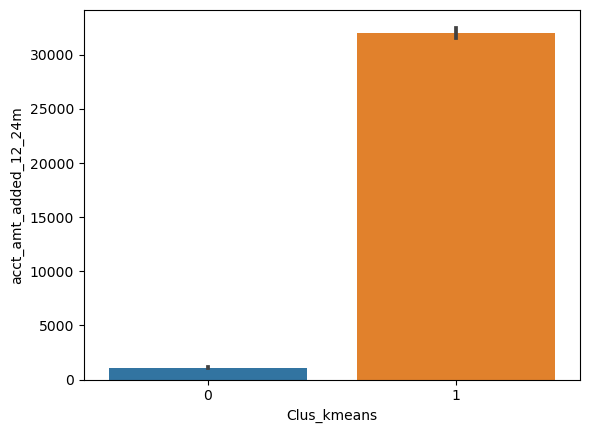

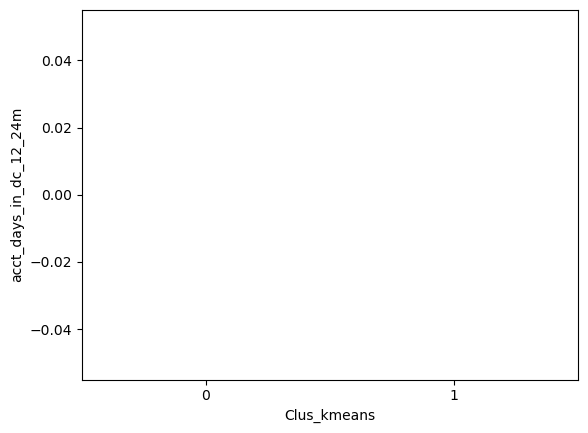

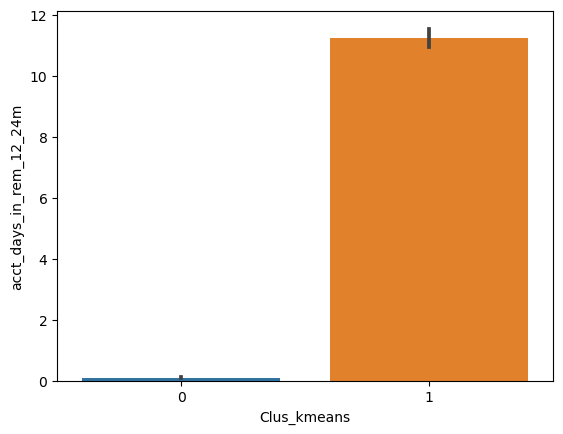

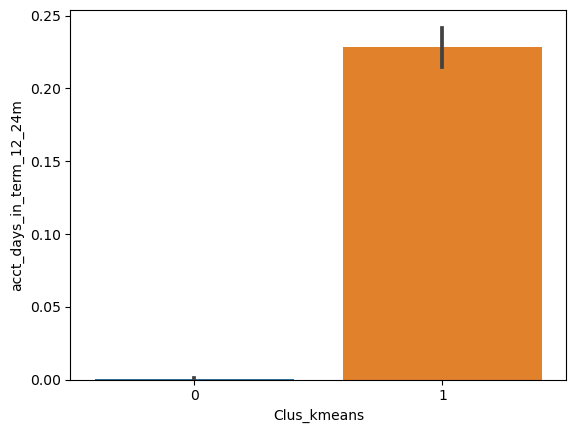

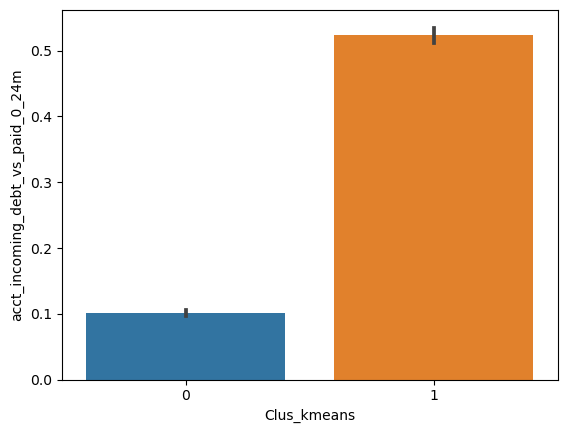

...

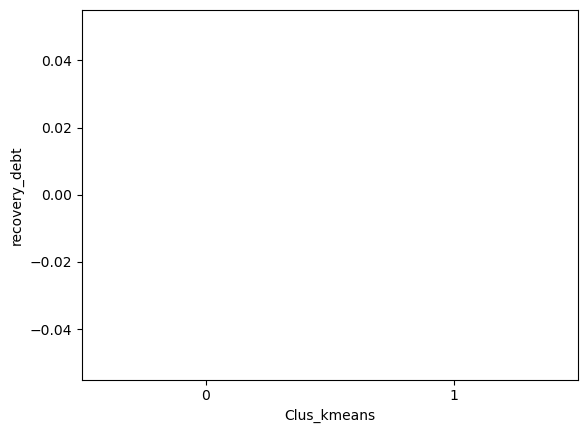

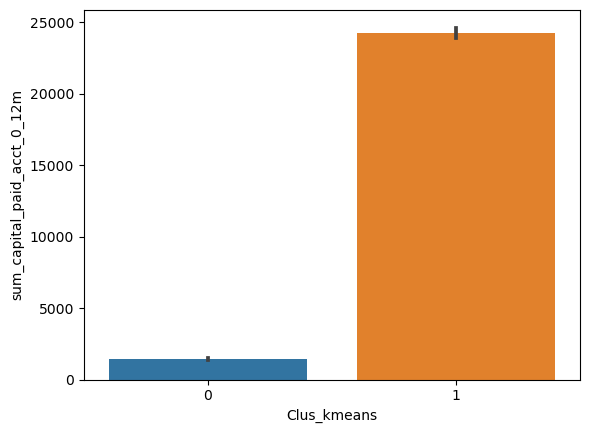

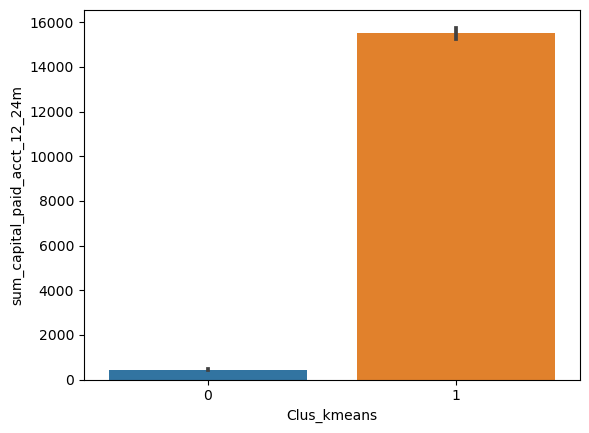

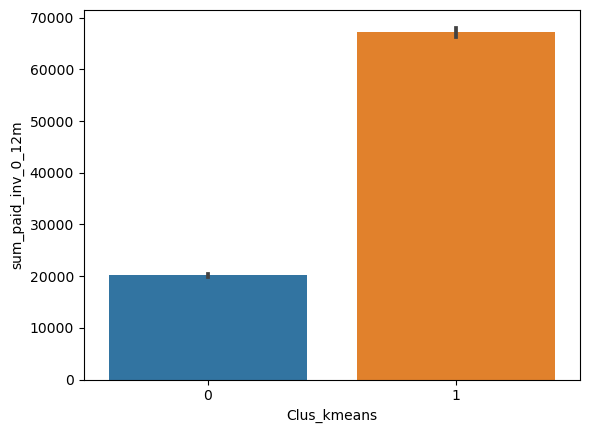

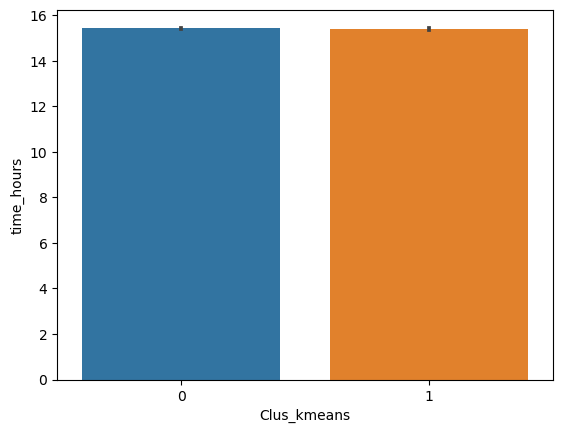

In [96]:
for col in metrics:
    sns.barplot(x = 'Clus_kmeans', y = col, data = combined_df)
    plt.show();

In [97]:
Cluster_0_summary = Cluster_0[metrics].describe()
Cluster_0_summary.T

,count,mean,std,min,25%,50%,75%,max
acct_amt_added_12_24m,59807.00,1091.75,5803.56,0.00,0.00,0.00,0.00,118879.00
acct_days_in_dc_12_24m,59807.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
acct_days_in_rem_12_24m,59807.00,0.10,1.82,0.00,0.00,0.00,0.00,88.00
acct_days_in_term_12_24m,59807.00,0.00,0.06,0.00,0.00,0.00,0.00,7.00
acct_incoming_debt_vs_paid_0_24m,59807.00,0.10,0.59,0.00,0.00,0.00,0.00,6.05
acct_worst_status_0_3m,59807.00,0.23,0.44,0.00,0.00,0.00,0.00,2.00
acct_worst_status_12_24m,59807.00,0.10,0.32,0.00,0.00,0.00,0.00,3.00
acct_worst_status_3_6m,59807.00,0.18,0.40,0.00,0.00,0.00,0.00,2.00
acct_worst_status_6_12m,59807.00,0.15,0.38,0.00,0.00,0.00,0.00,2.00
age,59807.00,36.86,13.62,18.00,25.00,35.00,46.00,70.00


In [98]:
Cluster_1_summary = Cluster_1[metrics].describe()
Cluster_1_summary.T

,count,mean,std,min,25%,50%,75%,max
acct_amt_added_12_24m,30169.00,32003.36,41918.94,0.00,0.00,14933.00,46860.00,164684.50
acct_days_in_dc_12_24m,30169.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
acct_days_in_rem_12_24m,30169.00,11.23,25.66,0.00,0.00,0.00,3.00,108.00
acct_days_in_term_12_24m,30169.00,0.23,1.22,0.00,0.00,0.00,0.00,7.00
acct_incoming_debt_vs_paid_0_24m,30169.00,0.52,1.05,0.00,0.00,0.13,0.61,6.05
acct_worst_status_0_3m,30169.00,1.13,0.50,0.00,1.00,1.00,1.00,2.00
acct_worst_status_12_24m,30169.00,1.12,0.76,0.00,1.00,1.00,2.00,3.00
acct_worst_status_3_6m,30169.00,1.11,0.52,0.00,1.00,1.00,1.00,2.00
acct_worst_status_6_12m,30169.00,1.14,0.58,0.00,1.00,1.00,2.00,2.00
age,30169.00,34.18,10.84,18.00,25.00,32.00,42.00,70.00


Cluster_0_mean = Cluster_0_summary.loc['mean']
Cluster_1_mean = Cluster_1_summary.loc['mean']

plt.figure(figsize=(20, 10))

for i, metric in enumerate(metrics):
    plt.subplot(5, 4, i+1)
    plt.bar(['Cluster 0', 'Cluster 1'], [Cluster_0_mean[metric], Cluster_1_mean[metric]], color=['skyblue', 'salmon'])
    plt.title(metric)
    plt.xlabel('Clusters')
    plt.ylabel('Mean')
    plt.xticks(rotation=45)

plt.tight_layout()
plt.show();


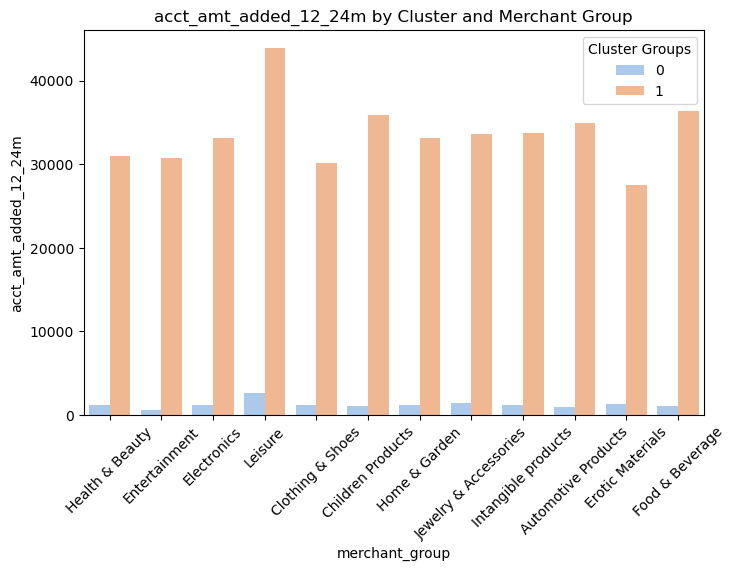

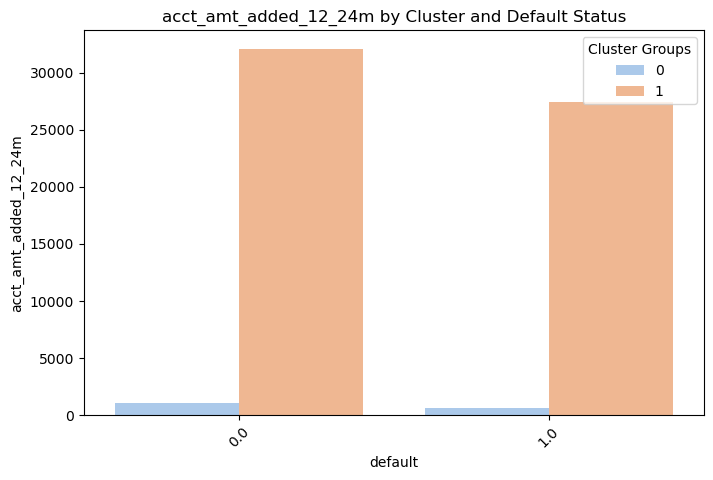

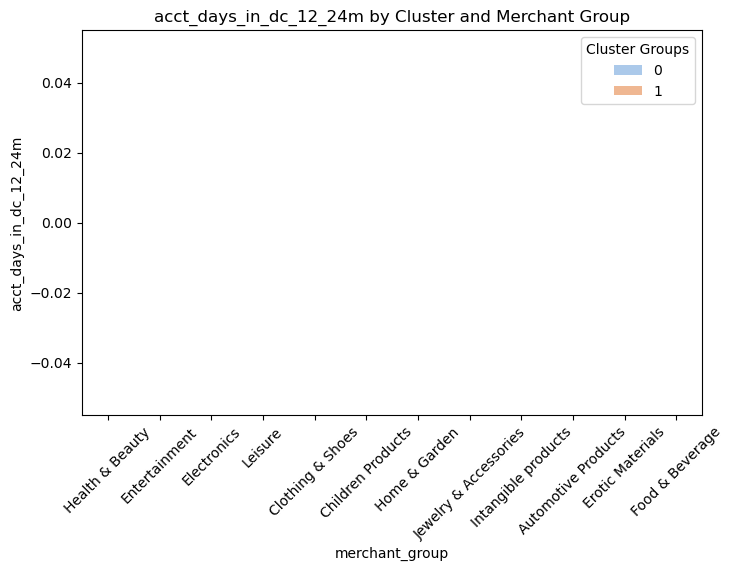

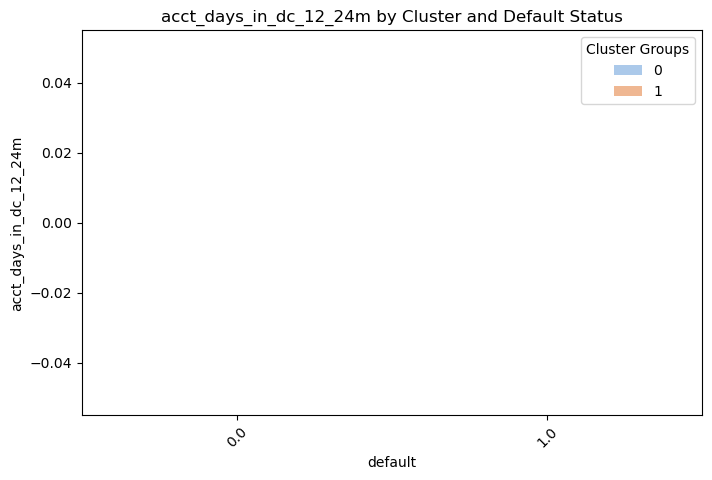

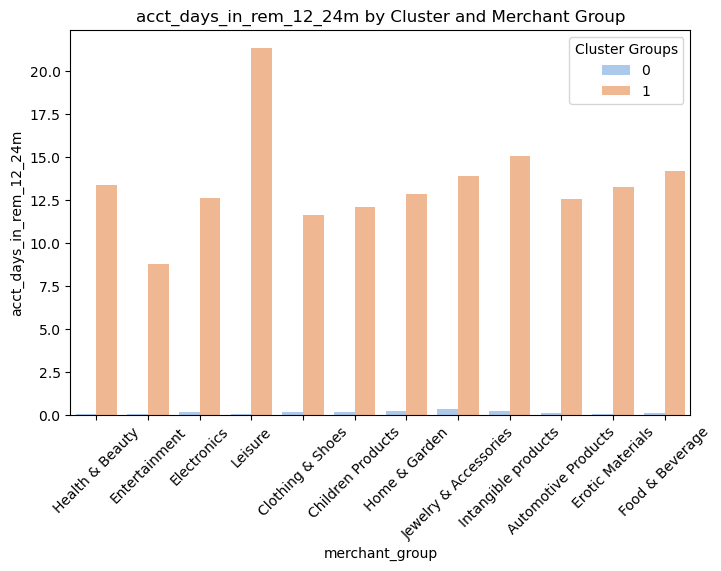

...

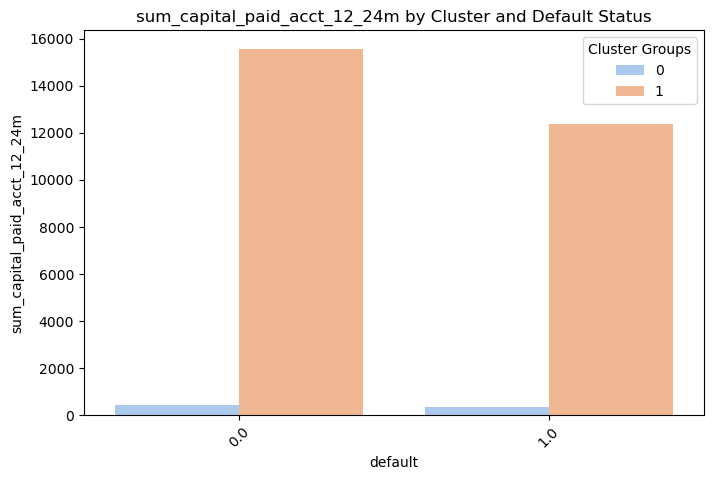

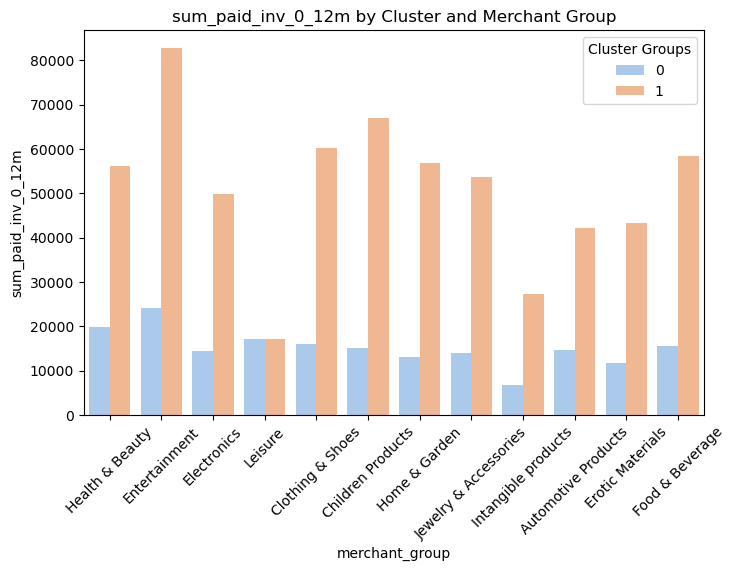

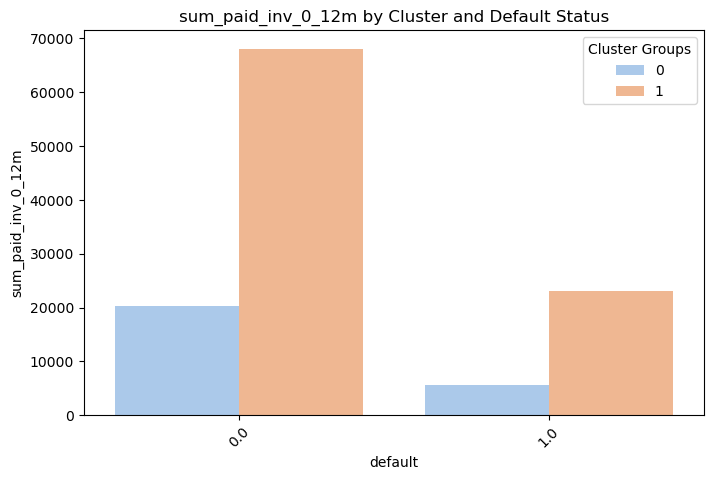

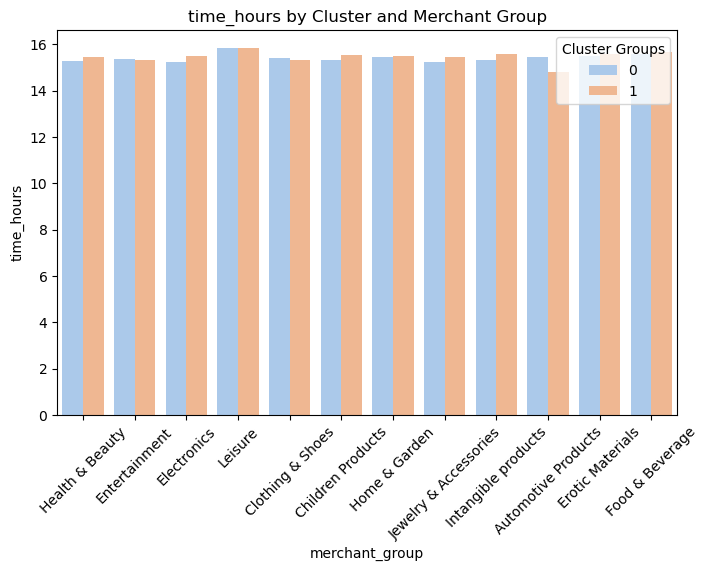

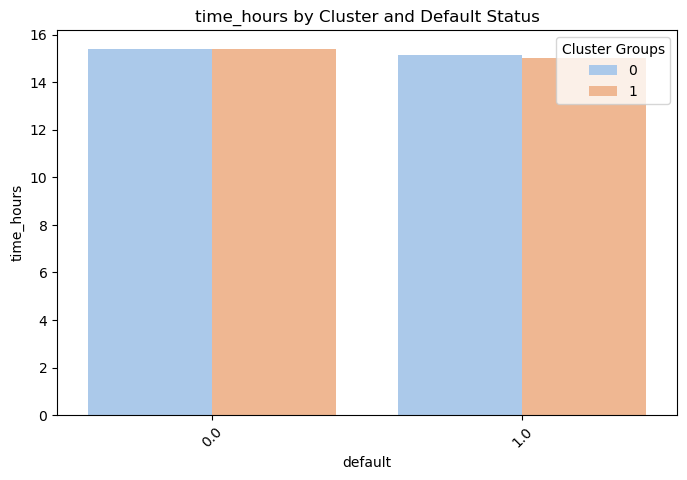

In [99]:

for col in metrics:
    plt.figure(figsize=(8, 5))
    sns.barplot(x='merchant_group', y=col, data=combined_df, hue='Clus_kmeans', palette='pastel', ci=None)
    plt.title(f'{col} by Cluster and Merchant Group')
    plt.legend(title='Cluster Groups', loc='upper right')
    plt.xticks(rotation=45) 

    # Adding merchant groups
    plt.figure(figsize=(8, 5))
    sns.barplot(x='default', y=col, data=combined_df, hue='Clus_kmeans', palette='pastel', ci=None)
    plt.title(f'{col} by Cluster and Default Status')
    plt.legend(title='Cluster Groups', loc='upper right')
    plt.xticks(rotation=45) 

    plt.show();


In [100]:
column_dtypes = df_cat.dtypes

print(column_dtypes)


acct_status          object
merchant_category    object
merchant_group       object
has_paid             object
name_in_email        object
dtype: object


### Convert Object Feature types 

In [101]:
df_cat.columns

Index(['acct_status', 'merchant_category', 'merchant_group', 'has_paid',
       'name_in_email'],
      dtype='object')

In [102]:
df_cat['acct_status'].unique()

array([1.0, 0.0], dtype=object)

In [103]:
df_cat['acct_status'] = df_cat['acct_status'].astype('int64')
df_cat['acct_status'].info()

<class 'pandas.core.series.Series'>
Index: 89976 entries, 0 to 89975
Series name: acct_status
Non-Null Count  Dtype
--------------  -----
89976 non-null  int64
dtypes: int64(1)
memory usage: 1.4 MB


In [104]:
#df_cat['acct_status']=np.where(df_cat['acct_status'] =='1.0', '1', df_cat['acct_status'])
#df_cat['acct_status']=np.where(df_cat['acct_status'] =='0.0', '0', df_cat['acct_status'])

In [105]:
df_cat['merchant_category'].unique()

array(['Dietary supplements', 'Books & Magazines',
       'Diversified entertainment',
       'Electronic equipment & Related accessories',
       'Concept stores & Miscellaneous', 'Youthful Shoes & Clothing',
       'General Shoes & Clothing', 'Prints & Photos',
       'Diversified children products', 'Pet supplies',
       'Diversified Home & Garden products', 'Sports gear & Outdoor',
       'Diversified electronics', 'Diversified Jewelry & Accessories',
       'Travel services', 'Prescription optics',
       'Pharmaceutical products', 'Dating services',
       'Diversified Health & Beauty products', 'Children toys',
       'Automotive Parts & Accessories', 'Jewelry & Watches',
       'Digital services', 'Decoration & Art',
       'Children Clothes & Nurturing products', 'Kitchenware',
       'Hobby articles', 'Personal care & Body improvement', 'Cosmetics',
       'Non', 'Diversified erotic material', 'Food & Beverage',
       'Video Games & Related accessories', 'Tools & Home impro

In [106]:
df_cat['merchant_category']=np.where(df_cat['merchant_category'] =='Dietary supplements', 'Health & Wellness', df_cat['merchant_category'])
df_cat['merchant_category']=np.where(df_cat['merchant_category'] =='Books & Magazines', 'Entertainment & Leisure', df_cat['merchant_category'])
df_cat['merchant_category']=np.where(df_cat['merchant_category'] =='Diversified entertainment', 'Entertainment & Leisure', df_cat['merchant_category'])
df_cat['merchant_category']=np.where(df_cat['merchant_category'] =='Electronic equipment & Related accessories', 'Electronics & Accessories', df_cat['merchant_category'])
df_cat['merchant_category']=np.where(df_cat['merchant_category'] =='Concept stores & Miscellaneous', 'Miscellaneous & Specialized', df_cat['merchant_category'])
df_cat['merchant_category']=np.where(df_cat['merchant_category'] =='Youthful Shoes & Clothing', 'Fashion & Apparel', df_cat['merchant_category'])
df_cat['merchant_category']=np.where(df_cat['merchant_category'] =='General Shoes & Clothing', 'Fashion & Apparel', df_cat['merchant_category'])
df_cat['merchant_category']=np.where(df_cat['merchant_category'] =='Prints & Photos', 'Entertainment & Leisure', df_cat['merchant_category'])
df_cat['merchant_category']=np.where(df_cat['merchant_category'] =='Diversified children products', 'Miscellaneous & Specialized', df_cat['merchant_category'])
df_cat['merchant_category']=np.where(df_cat['merchant_category'] =='Pet supplies', 'Miscellaneous & Specialized', df_cat['merchant_category'])
df_cat['merchant_category']=np.where(df_cat['merchant_category'] =='Diversified Home & Garden products', 'Home & Garden', df_cat['merchant_category'])
df_cat['merchant_category']=np.where(df_cat['merchant_category'] =='Sports gear & Outdoor', 'Sports & Outdoor', df_cat['merchant_category'])
df_cat['merchant_category']=np.where(df_cat['merchant_category'] =='Diversified electronics', 'Electronics & Accessories', df_cat['merchant_category'])
df_cat['merchant_category']=np.where(df_cat['merchant_category'] =='Diversified Jewelry & Accessories', 'Jewelry & Accessories', df_cat['merchant_category'])
df_cat['merchant_category']=np.where(df_cat['merchant_category'] =='Travel services', 'Travel & Services', df_cat['merchant_category'])
df_cat['merchant_category']=np.where(df_cat['merchant_category'] =='Prescription optics', 'Health & Wellness', df_cat['merchant_category'])
df_cat['merchant_category']=np.where(df_cat['merchant_category'] =='Pharmaceutical products', 'Health & Wellness', df_cat['merchant_category'])
df_cat['merchant_category']=np.where(df_cat['merchant_category'] =='Dating services', 'Travel & Services', df_cat['merchant_category'])
df_cat['merchant_category']=np.where(df_cat['merchant_category'] =='Diversified Health & Beauty products', 'Health & Wellness', df_cat['merchant_category'])
df_cat['merchant_category']=np.where(df_cat['merchant_category'] =='Children toys', 'Toys & Hobbies', df_cat['merchant_category'])
df_cat['merchant_category']=np.where(df_cat['merchant_category'] =='Automotive Parts & Accessories', 'Electronics & Accessories', df_cat['merchant_category'])
df_cat['merchant_category']=np.where(df_cat['merchant_category'] =='Jewelry & Watches', 'Jewelry & Accessories', df_cat['merchant_category'])
df_cat['merchant_category']=np.where(df_cat['merchant_category'] =='Digital services', 'Travel & Services', df_cat['merchant_category'])
df_cat['merchant_category']=np.where(df_cat['merchant_category'] =='Decoration & Art', 'Home & Garden', df_cat['merchant_category'])
df_cat['merchant_category']=np.where(df_cat['merchant_category'] =='Children Clothes & Nurturing products', 'Fashion & Apparel', df_cat['merchant_category'])                                          
df_cat['merchant_category']=np.where(df_cat['merchant_category'] =='Kitchenware', 'Home & Garden', df_cat['merchant_category'])
df_cat['merchant_category']=np.where(df_cat['merchant_category'] =='Hobby articles', 'Toys & Hobbies', df_cat['merchant_category'])
df_cat['merchant_category']=np.where(df_cat['merchant_category'] =='Personal care & Body improvement', 'Health & Wellness', df_cat['merchant_category'])
df_cat['merchant_category']=np.where(df_cat['merchant_category'] =='Cosmetics', 'Health & Wellness', df_cat['merchant_category'])
df_cat['merchant_category']=np.where(df_cat['merchant_category'] =='Non', 'Miscellaneous & Specialized', df_cat['merchant_category'])
df_cat['merchant_category']=np.where(df_cat['merchant_category'] =='Diversified erotic material', 'Miscellaneous & Specialized', df_cat['merchant_category'])
df_cat['merchant_category']=np.where(df_cat['merchant_category'] =='Food & Beverage', 'Food & Beverages', df_cat['merchant_category'])
df_cat['merchant_category']=np.where(df_cat['merchant_category'] =='Video Games & Related accessories', 'Entertainment & Leisure', df_cat['merchant_category'])
df_cat['merchant_category']=np.where(df_cat['merchant_category'] =='Tools & Home improvement', 'Electronics & Accessories', df_cat['merchant_category'])
df_cat['merchant_category']=np.where(df_cat['merchant_category'] =='Fragrances', 'Health & Wellness', df_cat['merchant_category'])
df_cat['merchant_category']=np.where(df_cat['merchant_category'] =='Household electronics (whitegoods/appliances)', 'Electronics & Accessories', df_cat['merchant_category'])
df_cat['merchant_category']=np.where(df_cat['merchant_category'] =='Wheels & Tires', 'Miscellaneous & Specialized', df_cat['merchant_category'])
df_cat['merchant_category']=np.where(df_cat['merchant_category'] =='Adult Shoes & Clothing', 'Fashion & Apparel', df_cat['merchant_category'])
df_cat['merchant_category']=np.where(df_cat['merchant_category'] =='Body & Hair Care', 'Health & Wellness', df_cat['merchant_category'])
df_cat['merchant_category']=np.where(df_cat['merchant_category'] =='Underwear', 'Fashion & Apparel', df_cat['merchant_category'])
df_cat['merchant_category']=np.where(df_cat['merchant_category'] =='Furniture', 'Home & Garden', df_cat['merchant_category'])
df_cat['merchant_category']=np.where(df_cat['merchant_category'] =='Erotic Clothing & Accessories', 'Fashion & Apparel', df_cat['merchant_category'])
df_cat['merchant_category']=np.where(df_cat['merchant_category'] =='Music & Movies', 'Entertainment & Leisure', df_cat['merchant_category'])
df_cat['merchant_category']=np.where(df_cat['merchant_category'] =='Cleaning & Sanitary', 'Home & Garden', df_cat['merchant_category'])
df_cat['merchant_category']=np.where(df_cat['merchant_category'] =='Sex toys', 'Miscellaneous & Specialized', df_cat['merchant_category'])
df_cat['merchant_category']=np.where(df_cat['merchant_category'] =='Bags & Wallets', 'Fashion & Apparel', df_cat['merchant_category'])                                          
df_cat['merchant_category']=np.where(df_cat['merchant_category'] =='Costumes & Party supplies', 'Fashion & Apparel', df_cat['merchant_category'])                                         
df_cat['merchant_category']=np.where(df_cat['merchant_category'] =='Musical Instruments & Equipment', 'Toys & Hobbies', df_cat['merchant_category'])                                          
df_cat['merchant_category']=np.where(df_cat['merchant_category'] =='Tobacco', 'Food & Beverages', df_cat['merchant_category'])                                          
df_cat['merchant_category']=np.where(df_cat['merchant_category'] =='Wine', 'Food & Beverages', df_cat['merchant_category'])     
df_cat['merchant_category']=np.where(df_cat['merchant_category'] =='Collectibles', 'Toys & Hobbies', df_cat['merchant_category'])       
df_cat['merchant_category']=np.where(df_cat['merchant_category'] =='Safety products', 'Miscellaneous & Specialized', df_cat['merchant_category'])      
df_cat['merchant_category']=np.where(df_cat['merchant_category'] =='Car electronics', 'Electronics & Accessories', df_cat['merchant_category'])     
df_cat['merchant_category']=np.where(df_cat['merchant_category'] =='Plants & Flowers', 'Home & Garden', df_cat['merchant_category'])      
df_cat['merchant_category']=np.where(df_cat['merchant_category'] =='Event tickets', 'Entertainment & Leisure', df_cat['merchant_category'])      
df_cat['merchant_category']=np.where(df_cat['merchant_category'] =='Office machines & Related accessories (excl. computers)', 'Electronics & Accessories', df_cat['merchant_category'])      
df_cat['merchant_category']=np.where(df_cat['merchant_category'] =='Education', 'Travel & Services', df_cat['merchant_category'])       
      
                                          
                                          

In [107]:
# Print unique values in 'merchant_category' column
print(df_cat['merchant_category'].unique())


['Health & Wellness' 'Entertainment & Leisure' 'Electronics & Accessories'
 'Miscellaneous & Specialized' 'Fashion & Apparel' 'Home & Garden'
 'Sports & Outdoor' 'Jewelry & Accessories' 'Travel & Services'
 'Toys & Hobbies' 'Food & Beverages']


In [108]:
df_cat['merchant_group'].unique()

array(['Health & Beauty', 'Entertainment', 'Electronics', 'Leisure',
       'Clothing & Shoes', 'Children Products', 'Home & Garden',
       'Jewelry & Accessories', 'Intangible products',
       'Automotive Products', 'Erotic Materials', 'Food & Beverage'],
      dtype=object)

In [109]:
df_cat['merchant_group']=np.where(df_cat['merchant_group'] =='Health & Beauty', '1', df_cat['merchant_group'])
df_cat['merchant_group']=np.where(df_cat['merchant_group'] =='Entertainment', '2', df_cat['merchant_group'])
df_cat['merchant_group']=np.where(df_cat['merchant_group'] =='Electronics', '3', df_cat['merchant_group'])
df_cat['merchant_group']=np.where(df_cat['merchant_group'] =='Leisure', '4', df_cat['merchant_group'])
df_cat['merchant_group']=np.where(df_cat['merchant_group'] =='Clothing & Shoes', '5', df_cat['merchant_group'])
df_cat['merchant_group']=np.where(df_cat['merchant_group'] =='Children Products', '6', df_cat['merchant_group'])
df_cat['merchant_group']=np.where(df_cat['merchant_group'] =='Home & Garden', '7', df_cat['merchant_group'])
df_cat['merchant_group']=np.where(df_cat['merchant_group'] =='Jewelry & Accessories', '8', df_cat['merchant_group'])
df_cat['merchant_group']=np.where(df_cat['merchant_group'] =='Intangible products', '9', df_cat['merchant_group'])
df_cat['merchant_group']=np.where(df_cat['merchant_group'] =='Automotive Products','10', df_cat['merchant_group'])
df_cat['merchant_group']=np.where(df_cat['merchant_group'] =='Erotic Materials', '11', df_cat['merchant_group'])
df_cat['merchant_group']=np.where(df_cat['merchant_group'] =='Food & Beverage', '12', df_cat['merchant_group'])
                                    

In [110]:
df_cat['has_paid'].unique()

array([True, False], dtype=object)

In [111]:
#df_cat['has_paid']=np.where(df_cat['has_paid'] =='True', 'Paid', df_cat['has_paid'])
#df_cat['has_paid']=np.where(df_cat['has_paid'] =='False', 'Unpaid', df_cat['has_paid'])

In [112]:
df_cat['has_paid'] = df_cat['has_paid'].map({True: 'Paid', False: 'Unpaid'})

In [113]:
df_cat['has_paid'].unique()

array(['Paid', 'Unpaid'], dtype=object)

In [114]:
df_cat['name_in_email'].unique()

array(['Unknown', 'F L', 'L F', 'F', 'Nick', 'L', 'Initials'],
      dtype=object)

In [115]:
df_cat['name_in_email']=np.where(df_cat['name_in_email'] =='Unknown', '0', df_cat['name_in_email'])
df_cat['name_in_email']=np.where(df_cat['name_in_email'] =='F L', '1', df_cat['name_in_email'])
df_cat['name_in_email']=np.where(df_cat['name_in_email'] =='L F', '2', df_cat['name_in_email'])
df_cat['name_in_email']=np.where(df_cat['name_in_email'] =='F', '3', df_cat['name_in_email'])
df_cat['name_in_email']=np.where(df_cat['name_in_email'] =='Nick', '4', df_cat['name_in_email'])
df_cat['name_in_email']=np.where(df_cat['name_in_email'] =='L', '5', df_cat['name_in_email'])
df_cat['name_in_email']=np.where(df_cat['name_in_email'] =='Initials', '6', df_cat['name_in_email'])


In [116]:
df_cat.head()

,acct_status,merchant_category,merchant_group,has_paid,name_in_email
0,1,Health & Wellness,1,Paid,0
1,1,Entertainment & Leisure,2,Paid,1
2,0,Entertainment & Leisure,2,Paid,2
3,0,Entertainment & Leisure,2,Paid,1
4,0,Electronics & Accessories,3,Paid,1


In [117]:
df_cat.info()

<class 'pandas.core.frame.DataFrame'>
Index: 89976 entries, 0 to 89975
Data columns (total 5 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   acct_status        89976 non-null  int64 
 1   merchant_category  89976 non-null  object
 2   merchant_group     89976 non-null  object
 3   has_paid           89976 non-null  object
 4   name_in_email      89976 non-null  object
dtypes: int64(1), object(4)
memory usage: 4.1+ MB


In [118]:
df_cat['merchant_group'] = df_cat['merchant_group'].astype('int64')
df_cat['name_in_email'] = df_cat['name_in_email'].astype('int64')

df_cat.info()

<class 'pandas.core.frame.DataFrame'>
Index: 89976 entries, 0 to 89975
Data columns (total 5 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   acct_status        89976 non-null  int64 
 1   merchant_category  89976 non-null  object
 2   merchant_group     89976 non-null  int64 
 3   has_paid           89976 non-null  object
 4   name_in_email      89976 non-null  int64 
dtypes: int64(3), object(2)
memory usage: 4.1+ MB


### Encode the data

In [119]:
df_cat = pd.get_dummies(df_cat, drop_first=True)
df_cat.head()

,acct_status,merchant_group,name_in_email,merchant_category_Entertainment & Leisure,merchant_category_Fashion & Apparel,merchant_category_Food & Beverages,merchant_category_Health & Wellness,merchant_category_Home & Garden,merchant_category_Jewelry & Accessories,merchant_category_Miscellaneous & Specialized,merchant_category_Sports & Outdoor,merchant_category_Toys & Hobbies,merchant_category_Travel & Services,has_paid_Unpaid
0,1,1,0,False,False,False,True,False,False,False,False,False,False,False
1,1,2,1,True,False,False,False,False,False,False,False,False,False,False
2,0,2,2,True,False,False,False,False,False,False,False,False,False,False
3,0,2,1,True,False,False,False,False,False,False,False,False,False,False
4,0,3,1,False,False,False,False,False,False,False,False,False,False,False


In [120]:
df_cat = df_cat.astype(int)

In [121]:
df_cat.head()

,acct_status,merchant_group,name_in_email,merchant_category_Entertainment & Leisure,merchant_category_Fashion & Apparel,merchant_category_Food & Beverages,merchant_category_Health & Wellness,merchant_category_Home & Garden,merchant_category_Jewelry & Accessories,merchant_category_Miscellaneous & Specialized,merchant_category_Sports & Outdoor,merchant_category_Toys & Hobbies,merchant_category_Travel & Services,has_paid_Unpaid
0,1,1,0,0,0,0,1,0,0,0,0,0,0,0
1,1,2,1,1,0,0,0,0,0,0,0,0,0,0
2,0,2,2,1,0,0,0,0,0,0,0,0,0,0
3,0,2,1,1,0,0,0,0,0,0,0,0,0,0
4,0,3,1,0,0,0,0,0,0,0,0,0,0,0


In [122]:
X = pd.concat([scaled_df, df_cat], axis=1)
y = df_num['default']  

In [123]:
print("Shape of X:", X.shape)
print("Shape of y:", y.shape)


Shape of X: (89976, 43)
Shape of y: (89976,)


In [124]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30, random_state=1,stratify = y)

In [125]:
y_train.value_counts()

default
0.00    62081
1.00      902
Name: count, dtype: int64

In [126]:
y_test.value_counts()

default
0.00    26607
1.00      386
Name: count, dtype: int64

In [127]:
print('Number of rows and columns of the training set for the independent variables:',X_train.shape)
print('Number of rows and columns of the training set for the dependent variable:',y_train.shape)
print('Number of rows and columns of the test set for the independent variables:',X_test.shape)
print('Number of rows and columns of the test set for the dependent variable:',y_test.shape)

Number of rows and columns of the training set for the independent variables: (62983, 43)
Number of rows and columns of the training set for the dependent variable: (62983,)
Number of rows and columns of the test set for the independent variables: (26993, 43)
Number of rows and columns of the test set for the dependent variable: (26993,)


In [128]:
#print(df_cat.dtypes)

In [129]:
#numeric_columns = X_train.select_dtypes(include=['float64', 'int64'])

In [130]:
# Check for missing values in X_train_filtered
#missing_values = numeric_columns.isna().sum()

# Display columns with missing values and their counts
#print("Columns with missing values:")
#print(missing_values[missing_values > 0])


In [133]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

def calculate_vif(vif_X):
    vif_data = pd.DataFrame()
    vif_data["Feature"] = vif_X.columns
    vif_data["VIF"] = [variance_inflation_factor(vif_X.values, i) for i in range(len(vif_X.columns))]
    return vif_data

threshold_vif = 5  

#X =  numeric_columns 
vif_X = X_train

while True:
    vif_results = calculate_vif(vif_X)
    max_vif = vif_results['VIF'].max()
    
    if max_vif > threshold_vif:
        # Get the index of the feature with the highest VIF
        idx_to_drop = vif_results[vif_results['VIF'] == max_vif].index[0]
        
        # Print the information of the column being removed
        print(f"Removing '{vif_X.columns[idx_to_drop]}' with highest VIF value of {max_vif}")
        
        # Drop the feature with the highest VIF
        vif_X = vif_X.drop(vif_X.columns[idx_to_drop], axis=1)
        
        # Reset the index
        vif_X = vif_X.reset_index(drop=True)
    else:
        break

final_vif_results = calculate_vif(vif_X)
        
# Print the final VIF results
print("\nFinal VIF Results:")
print(calculate_vif(vif_X).sort_values(by='VIF', ascending=False))


Removing 'merchant_group' with highest VIF value of 10.10647827633307
Removing 'num_arch_ok_0_12m' with highest VIF value of 8.993852745647176
Removing 'status_max_archived_0_12_months' with highest VIF value of 8.115212598706227
Removing 'acct_worst_status_3_6m' with highest VIF value of 7.061335219890631
Removing 'acct_status' with highest VIF value of 6.216167322544285
Removing 'max_paid_inv_0_12m' with highest VIF value of 5.785689217307013

Final VIF Results:
                                          Feature  VIF
6                        acct_worst_status_12_24m 4.84
7                         acct_worst_status_6_12m 4.63
19                status_max_archived_0_24_months 3.96
23                             sum_paid_inv_0_12m 3.82
5                          acct_worst_status_0_3m 3.42
0                           acct_amt_added_12_24m 2.71
16                             num_arch_ok_12_24m 2.49
13                                 num_active_inv 2.44
22                   sum_capital_pai

In [137]:
final_vif_results = final_vif_results.dropna(subset=['VIF'])

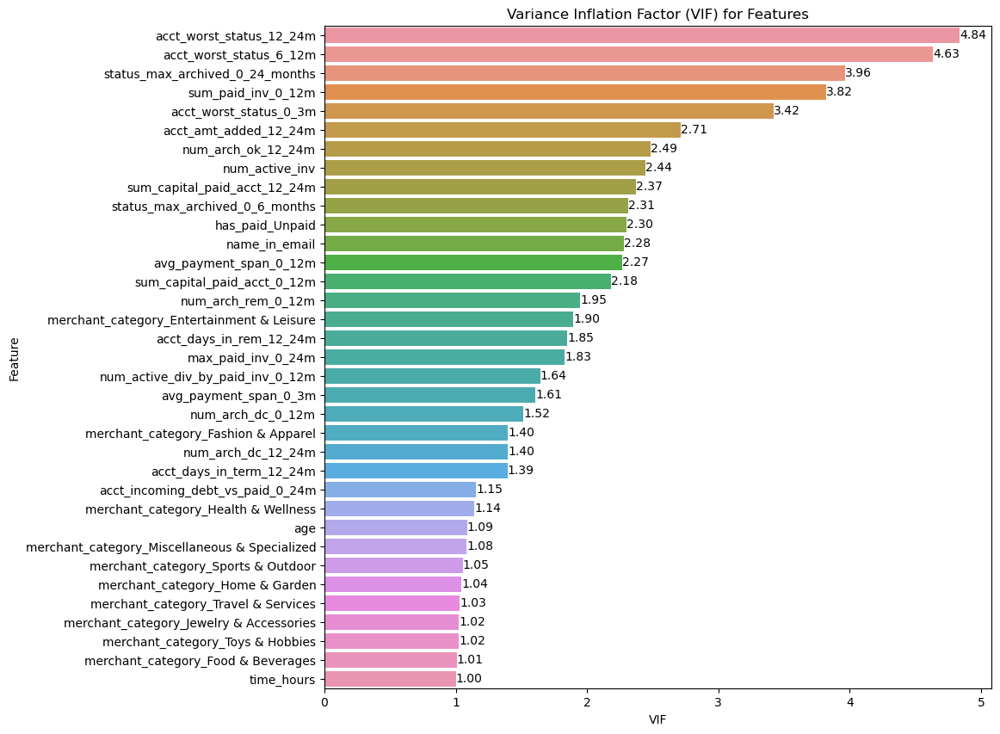

In [139]:
plt.figure(figsize=(10, 10))
sns.barplot(x="VIF", y="Feature", data=final_vif_results.sort_values(by='VIF', ascending=False))

# Annotate the bars with the VIF values
for index, value in enumerate(final_vif_results.sort_values(by='VIF', ascending=False)['VIF']):
    plt.text(value, index, f'{value:.2f}', va='center')

plt.title("Variance Inflation Factor (VIF) for Features")
plt.xlabel("VIF")
plt.ylabel("Feature")
plt.show();

In [141]:
X_train = vif_X.drop(['acct_days_in_dc_12_24m', 'recovery_debt'], axis=1)

In [142]:
X_train.columns

Index(['acct_amt_added_12_24m', 'acct_days_in_rem_12_24m',
       'acct_days_in_term_12_24m', 'acct_incoming_debt_vs_paid_0_24m',
       'acct_worst_status_0_3m', 'acct_worst_status_12_24m',
       'acct_worst_status_6_12m', 'age', 'avg_payment_span_0_12m',
       'avg_payment_span_0_3m', 'max_paid_inv_0_24m',
       'num_active_div_by_paid_inv_0_12m', 'num_active_inv',
       'num_arch_dc_0_12m', 'num_arch_dc_12_24m', 'num_arch_ok_12_24m',
       'num_arch_rem_0_12m', 'status_max_archived_0_6_months',
       'status_max_archived_0_24_months', 'sum_capital_paid_acct_0_12m',
       'sum_capital_paid_acct_12_24m', 'sum_paid_inv_0_12m', 'time_hours',
       'name_in_email', 'merchant_category_Entertainment & Leisure',
       'merchant_category_Fashion & Apparel',
       'merchant_category_Food & Beverages',
       'merchant_category_Health & Wellness',
       'merchant_category_Home & Garden',
       'merchant_category_Jewelry & Accessories',
       'merchant_category_Miscellaneous & Spec

In [143]:
X_test = X_test.drop(['merchant_group','num_arch_ok_0_12m','status_max_archived_0_12_months','acct_worst_status_3_6m','acct_status','max_paid_inv_0_12m','acct_days_in_dc_12_24m', 'recovery_debt'], axis=1)

#X_test = X_test[X_train.columns]

In [144]:
X_test.columns

Index(['acct_amt_added_12_24m', 'acct_days_in_rem_12_24m',
       'acct_days_in_term_12_24m', 'acct_incoming_debt_vs_paid_0_24m',
       'acct_worst_status_0_3m', 'acct_worst_status_12_24m',
       'acct_worst_status_6_12m', 'age', 'avg_payment_span_0_12m',
       'avg_payment_span_0_3m', 'max_paid_inv_0_24m',
       'num_active_div_by_paid_inv_0_12m', 'num_active_inv',
       'num_arch_dc_0_12m', 'num_arch_dc_12_24m', 'num_arch_ok_12_24m',
       'num_arch_rem_0_12m', 'status_max_archived_0_6_months',
       'status_max_archived_0_24_months', 'sum_capital_paid_acct_0_12m',
       'sum_capital_paid_acct_12_24m', 'sum_paid_inv_0_12m', 'time_hours',
       'name_in_email', 'merchant_category_Entertainment & Leisure',
       'merchant_category_Fashion & Apparel',
       'merchant_category_Food & Beverages',
       'merchant_category_Health & Wellness',
       'merchant_category_Home & Garden',
       'merchant_category_Jewelry & Accessories',
       'merchant_category_Miscellaneous & Spec

In [145]:
#X = X.reset_index(drop=True)
#bool_columns = X_train.select_dtypes(include=['bool']).reset_index(drop=True)

In [146]:
#X_train_filtered = pd.concat([X, bool_columns], axis=1)
#X_train_filtered.columns

### SMOTE 

In [147]:
#pip install --upgrade imbalanced-learn scikit-learn

In [148]:
from imblearn.over_sampling import SMOTE 

In [149]:
from collections import Counter

In [150]:
counter=Counter(y_train)
counter

Counter({0.0: 62081, 1.0: 902})

In [151]:
#sm = SMOTE(random_state=33, sampling_strategy = .75)
sm = SMOTE(random_state=2)
X_train_res, y_train_res = sm.fit_resample(X_train, y_train.ravel())

In [152]:
counter=Counter(y_train_res)
counter

Counter({0.0: 62081, 1.0: 62081})

### Logistic Regression Model

In [153]:
from sklearn.linear_model import LogisticRegression

In [154]:
model = LogisticRegression(solver='newton-cg', max_iter=10000, verbose=True, n_jobs=2)
model.fit(X_train_res, y_train_res)


[Parallel(n_jobs=2)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done   1 out of   1 | elapsed:    3.4s finished


LogisticRegression(max_iter=10000, n_jobs=2, solver='newton-cg', verbose=True)

### Predicting on Training and Test dataset

In [155]:
ytrain_predict = model.predict(X_train_res)
ytest_predict = model.predict(X_test)

### Getting the Predicted Classes and Probs

In [156]:
ytrain_predict_prob=model.predict_proba(X_train_res)
pd.DataFrame(ytrain_predict_prob).head()

,0,1
0,0.82,0.18
1,0.99,0.01
2,1.00,0.00
3,0.74,0.26
4,0.63,0.37


In [157]:
ytest_predict_prob=model.predict_proba(X_test)
pd.DataFrame(ytest_predict_prob).head()

,0,1
0,0.98,0.02
1,0.73,0.27
2,0.87,0.13
3,0.98,0.02
4,0.88,0.12


### Model Evaluation

In [158]:
# Accuracy - Training Data
model.score(X_train_res, y_train_res)

0.8331695687891626

### AUC and ROC for the training data

AUC: 0.922


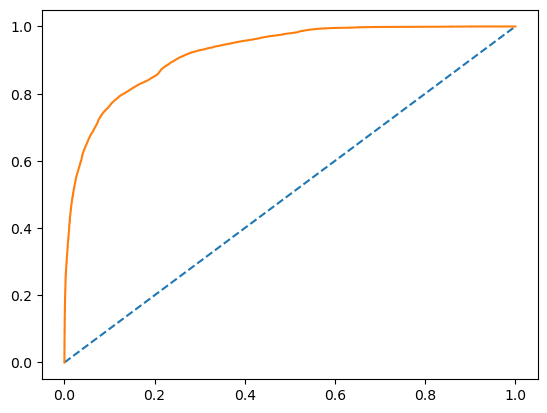

In [159]:
# predict probabilities
probs = model.predict_proba(X_train_res)
# keep probabilities for the positive outcome only
probs = probs[:, 1]
# calculate AUC
auc = roc_auc_score(y_train_res, probs)
print('AUC: %.3f' % auc)
# calculate roc curve
train_fpr, train_tpr, train_thresholds = roc_curve(y_train_res, probs)
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(train_fpr, train_tpr);

In [160]:
# Accuracy - Test Data
model.score(X_test, y_test)

0.8585929685474012

### AUC and ROC for the test data

AUC: 0.922


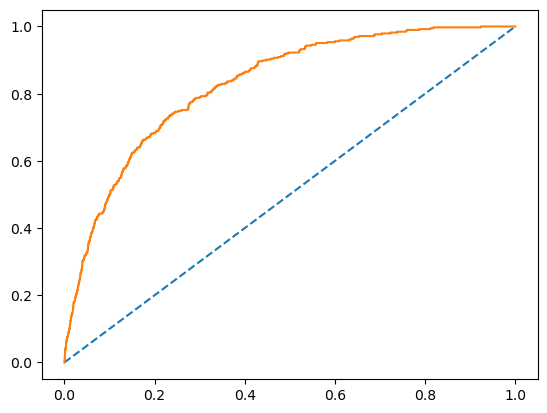

In [161]:
# predict probabilities
probs = model.predict_proba(X_test)
# keep probabilities for the positive outcome only
probs = probs[:, 1]
# calculate AUC
test_auc = roc_auc_score(y_test, probs)
print('AUC: %.3f' % auc)
# calculate roc curve
test_fpr, test_tpr, test_thresholds = roc_curve(y_test, probs)
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(test_fpr, test_tpr);

### Confusion Matrix for the training data

In [162]:
cm = confusion_matrix(y_train_res, ytrain_predict)
cm

array([[53242,  8839],
       [11875, 50206]], dtype=int64)

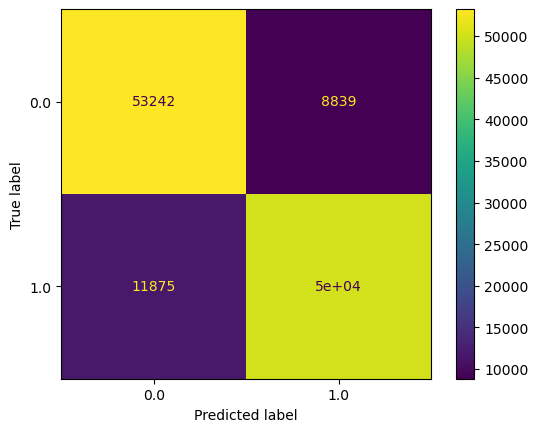

In [163]:
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=model.classes_)
disp.plot()

In [164]:
print(classification_report(y_train_res, ytrain_predict))

              precision    recall  f1-score   support

         0.0       0.82      0.86      0.84     62081
         1.0       0.85      0.81      0.83     62081

    accuracy                           0.83    124162
   macro avg       0.83      0.83      0.83    124162
weighted avg       0.83      0.83      0.83    124162



### Confusion Matrix for test data

In [165]:
cm = confusion_matrix(y_test, ytest_predict)
cm

array([[22950,  3657],
       [  160,   226]], dtype=int64)

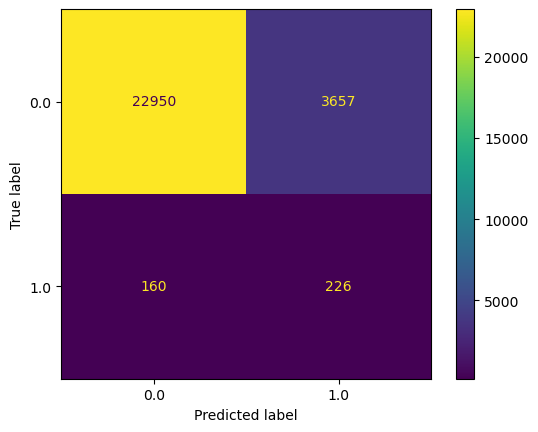

In [166]:
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=model.classes_)
disp.plot()

In [167]:
print(classification_report(y_test, ytest_predict))

              precision    recall  f1-score   support

         0.0       0.99      0.86      0.92     26607
         1.0       0.06      0.59      0.11       386

    accuracy                           0.86     26993
   macro avg       0.53      0.72      0.51     26993
weighted avg       0.98      0.86      0.91     26993



### Applying GridSearchCV for Logistic Regression

In [168]:
grid={'penalty':['l2','none'],
      'solver':['newton-cg', 'lbfgs', 'liblinear', 'sag', 'saga'],
      'tol':[0.0001,0.00001]}

In [169]:
model = LogisticRegression(max_iter=10000,n_jobs=2)

In [170]:
grid_search = GridSearchCV(estimator = model, param_grid = grid, cv = 5,n_jobs=-1,scoring='f1')

In [171]:
grid_search.fit(X_train_res, y_train_res)

GridSearchCV(cv=5, estimator=LogisticRegression(max_iter=10000, n_jobs=2),
             n_jobs=-1,
             param_grid={'penalty': ['l2', 'none'],
                         'solver': ['newton-cg', 'lbfgs', 'liblinear', 'sag',
                                    'saga'],
                         'tol': [0.0001, 1e-05]},
             scoring='f1')

In [172]:
print(grid_search.best_params_,'\n')
print(grid_search.best_estimator_)

{'penalty': 'l2', 'solver': 'lbfgs', 'tol': 0.0001} 

LogisticRegression(max_iter=10000, n_jobs=2)


In [173]:
best_model = grid_search.best_estimator_

In [174]:
# Prediction on the training set

ytrain_predict = best_model.predict(X_train_res)
ytest_predict = best_model.predict(X_test)

In [175]:
## Getting the probabilities on the train set
ytrain_predict_prob=best_model.predict_proba(X_train_res)
pd.DataFrame(ytrain_predict_prob).head()

,0,1
0,0.81,0.19
1,0.99,0.01
2,1.00,0.00
3,0.74,0.26
4,0.63,0.37


In [176]:
## Getting the probabilities on the test set

ytest_predict_prob=best_model.predict_proba(X_test)
pd.DataFrame(ytest_predict_prob).head()

,0,1
0,0.97,0.03
1,0.73,0.27
2,0.87,0.13
3,0.98,0.02
4,0.88,0.12


In [177]:
## Confusion matrix on the training data
cm = confusion_matrix(y_train_res, ytrain_predict)
cm

array([[53248,  8833],
       [11868, 50213]], dtype=int64)

              precision    recall  f1-score   support

         0.0       0.82      0.86      0.84     62081
         1.0       0.85      0.81      0.83     62081

    accuracy                           0.83    124162
   macro avg       0.83      0.83      0.83    124162
weighted avg       0.83      0.83      0.83    124162
 



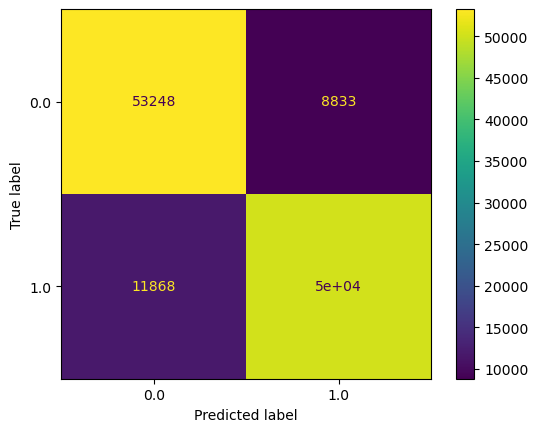

In [178]:
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=best_model.classes_)
disp.plot()
print(classification_report(y_train_res, ytrain_predict),'\n');

              precision    recall  f1-score   support

         0.0       0.99      0.86      0.92     26607
         1.0       0.06      0.59      0.11       386

    accuracy                           0.86     26993
   macro avg       0.53      0.72      0.51     26993
weighted avg       0.98      0.86      0.91     26993
 



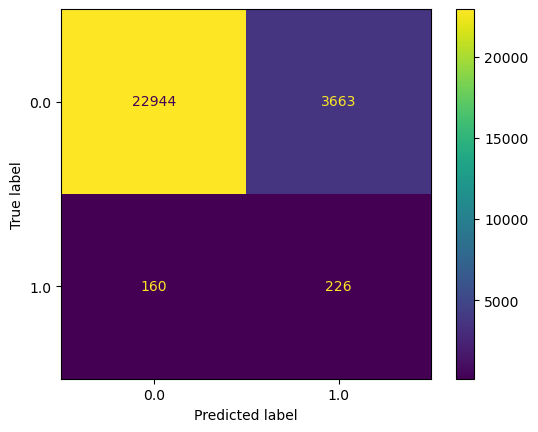

In [179]:
## Confusion matrix on the test data
cm = confusion_matrix(y_test, ytest_predict)
cm
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=best_model.classes_)
disp.plot()
print(classification_report(y_test, ytest_predict),'\n');

In [180]:
# Accuracy - Training Data
best_model.score(X_train_res, y_train_res)

0.8332742707108455

AUC: 0.922


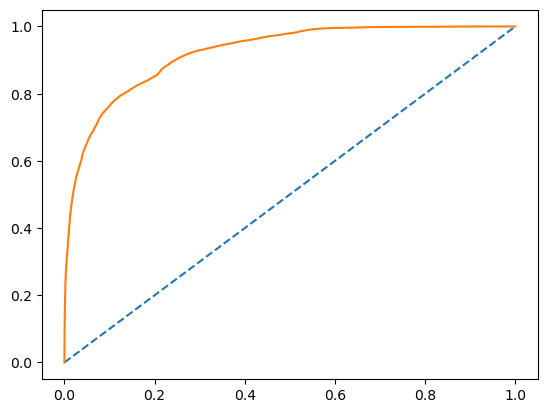

In [181]:
# predict probabilities
probs = best_model.predict_proba(X_train_res)
# keep probabilities for the positive outcome only
probs = probs[:, 1]
# calculate AUC
auc = roc_auc_score(y_train_res, probs)
print('AUC: %.3f' % auc)
# calculate roc curve
train_fpr, train_tpr, train_thresholds = roc_curve(y_train_res, probs)
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(train_fpr, train_tpr);

In [182]:
# Accuracy - Test Data
best_model.score(X_test, y_test)

0.8583706886970696

AUC: 0.922


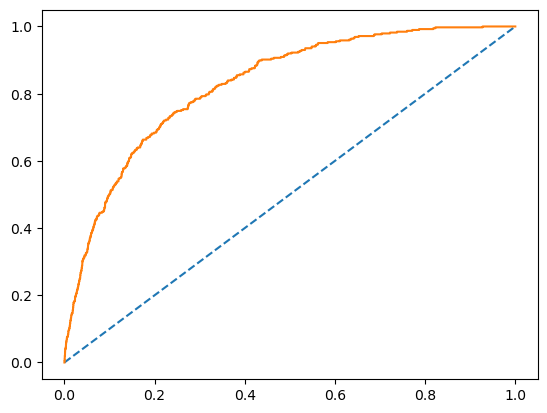

In [183]:
# predict probabilities
probs = best_model.predict_proba(X_test)
# keep probabilities for the positive outcome only
probs = probs[:, 1]
# calculate AUC
test_auc = roc_auc_score(y_test, probs)
print('AUC: %.3f' % auc)
# calculate roc curve
test_fpr, test_tpr, test_thresholds = roc_curve(y_test, probs)
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(test_fpr, test_tpr);

### LDA Model

In [184]:
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis

In [185]:
clf = LinearDiscriminantAnalysis()
model=clf.fit(X_train_res,y_train_res)
model

LinearDiscriminantAnalysis()

In [186]:
# Training Data Class Prediction with a cut-off value of 0.5
pred_class_train = model.predict(X_train_res)

# Test Data Class Prediction with a cut-off value of 0.5
pred_class_test = model.predict(X_test)

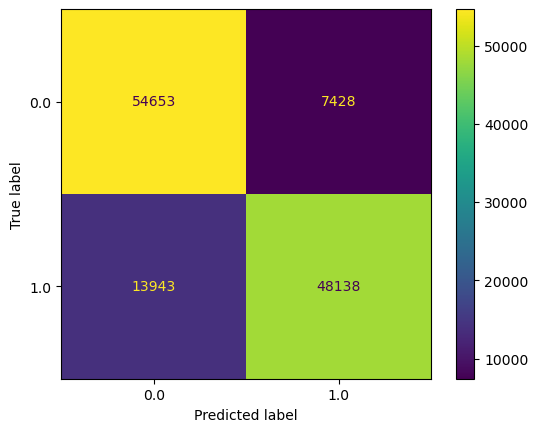

In [187]:
## Confusion matrix on the training data
cm = confusion_matrix(y_train_res, pred_class_train)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=model.classes_)
disp.plot()

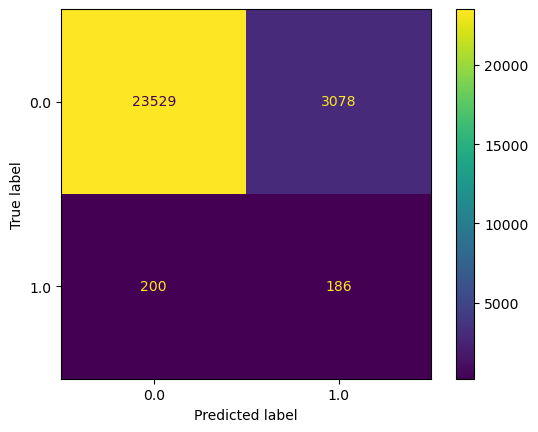

In [188]:
## Confusion matrix on the test data
cm = confusion_matrix(y_test, pred_class_test)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=model.classes_)
disp.plot()

In [189]:
print('Classification Report of the training data:','\n',classification_report(y_train_res,pred_class_train),'\n')
print('Classification Report of the test data:','\n',classification_report(y_test,pred_class_test))

Classification Report of the training data: 
               precision    recall  f1-score   support

         0.0       0.80      0.88      0.84     62081
         1.0       0.87      0.78      0.82     62081

    accuracy                           0.83    124162
   macro avg       0.83      0.83      0.83    124162
weighted avg       0.83      0.83      0.83    124162
 

Classification Report of the test data: 
               precision    recall  f1-score   support

         0.0       0.99      0.88      0.93     26607
         1.0       0.06      0.48      0.10       386

    accuracy                           0.88     26993
   macro avg       0.52      0.68      0.52     26993
weighted avg       0.98      0.88      0.92     26993



### Probability prediction for the training and test data

In [190]:
# Training Data Probability Prediction
pred_prob_train = model.predict_proba(X_train_res)

# Test Data Probability Prediction
pred_prob_test = model.predict_proba(X_test)

AUC for the Training Data: 0.916


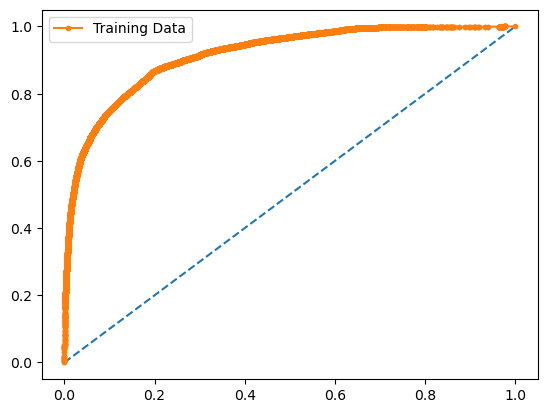

In [191]:
# AUC and ROC for the training data

# calculate AUC
auc = roc_auc_score(y_train_res,pred_prob_train[:,1])
print('AUC for the Training Data: %.3f' % auc)

#  calculate roc curve
fpr, tpr, thresholds = roc_curve(y_train_res,pred_prob_train[:,1])
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(fpr, tpr, marker='.',label = 'Training Data')
plt.legend(loc='best')
plt.show();

AUC for the Test Data: 0.809


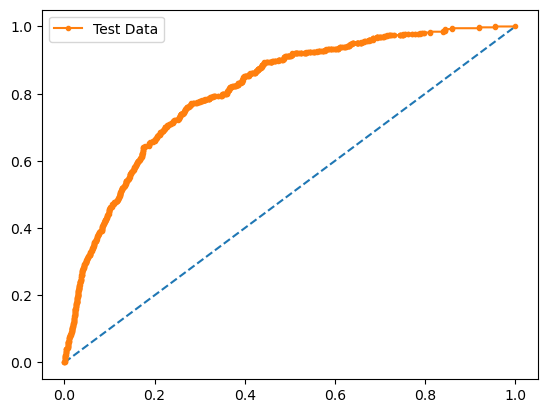

In [192]:
# AUC and ROC for the test data

# calculate AUC
auc = roc_auc_score(y_test,pred_prob_test[:,1])
print('AUC for the Test Data: %.3f' % auc)

#  calculate roc curve
fpr, tpr, thresholds = roc_curve(y_test,pred_prob_test[:,1])
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(fpr, tpr, marker='.',label='Test Data')
# show the plot
plt.legend(loc='best')
plt.show();

In [193]:
pred_prob_train[:,1]

array([0.16126923, 0.01321203, 0.00409015, ..., 0.99306235, 0.80560566,
       0.46353326])

In [194]:
pred_prob_test[:,1]

array([0.23531188, 0.18466623, 0.09861143, ..., 0.46394961, 0.02948335,
       0.33339608])

### Generate Coefficients and intercept for the Linear Discriminant Function

In [195]:
#intercept value
clf.intercept_ 

array([1.80739545])

In [196]:
#coefficients for the Linear Discriminant Function
clf.coef_

array([[ 0.07374533,  0.19834564,  0.06419369,  0.04171327,  0.69587381,
        -0.28361028, -0.07020134, -0.47555226,  0.08681857, -0.26583201,
        -0.49594277,  0.14394838,  0.20838482,  0.34731744,  0.25569976,
        -0.30713895,  0.09828434, -0.0539846 , -0.32959165, -0.20683818,
        -0.12843448, -0.19309842, -0.0630764 , -0.28667908, -3.80001169,
        -3.23227425, -2.8245436 , -4.66718975, -4.43962405, -5.42530432,
        -3.31541134, -3.44888859, -3.51394897, -1.76193452,  1.1875371 ]])

In [197]:
X.columns

Index(['acct_amt_added_12_24m', 'acct_days_in_dc_12_24m',
       'acct_days_in_rem_12_24m', 'acct_days_in_term_12_24m',
       'acct_incoming_debt_vs_paid_0_24m', 'acct_worst_status_0_3m',
       'acct_worst_status_12_24m', 'acct_worst_status_3_6m',
       'acct_worst_status_6_12m', 'age', 'avg_payment_span_0_12m',
       'avg_payment_span_0_3m', 'max_paid_inv_0_12m', 'max_paid_inv_0_24m',
       'num_active_div_by_paid_inv_0_12m', 'num_active_inv',
       'num_arch_dc_0_12m', 'num_arch_dc_12_24m', 'num_arch_ok_0_12m',
       'num_arch_ok_12_24m', 'num_arch_rem_0_12m',
       'status_max_archived_0_6_months', 'status_max_archived_0_12_months',
       'status_max_archived_0_24_months', 'recovery_debt',
       'sum_capital_paid_acct_0_12m', 'sum_capital_paid_acct_12_24m',
       'sum_paid_inv_0_12m', 'time_hours', 'acct_status', 'merchant_group',
       'name_in_email', 'merchant_category_Entertainment & Leisure',
       'merchant_category_Fashion & Apparel',
       'merchant_category_Fo

In [198]:
a=clf.coef_
np.round(a,2) # rounded up coefficients 

array([[ 0.07,  0.2 ,  0.06,  0.04,  0.7 , -0.28, -0.07, -0.48,  0.09,
        -0.27, -0.5 ,  0.14,  0.21,  0.35,  0.26, -0.31,  0.1 , -0.05,
        -0.33, -0.21, -0.13, -0.19, -0.06, -0.29, -3.8 , -3.23, -2.82,
        -4.67, -4.44, -5.43, -3.32, -3.45, -3.51, -1.76,  1.19]])


LDF=(1.80739545)+ X1*(0.07) + X2*(0.2) + X3*(0.06) + X4*(0.04) + X5*(0.7) + X6*(-0.28) + X7*(-0.07) +X8*(-0.48) + X9*(0.09) + X10*(-0.27) + X11*(-0.5) + X12*(0.14) + X13*(0.21) + X14*(0.35) + X15*(0.26) + X16*(-0.31) + X17*(0.1) + X18*(-0.05)
        + X19*(-0.33) + X20*(-0.21) + X21*(-0.13) + X22*(-0.19) + X23*(-0.06) + X24*(-0.29) + X25*(-3.8) + X26*(-3.23) + X27*(-2.82) + X28*(-4.67) + X29*(-4.44) + X30*(-5.43) + X31*(-3.32) + X32*(-3.45) + X33*(-3.51) + X34*(-1.76) + X35*(1.19)


In [199]:
# Define parameter grid for hyperparameter tuning
param_grid = {
    'solver': ['svd', 'lsqr', 'eigen']
}

In [200]:
lda_model = LinearDiscriminantAnalysis()

In [201]:
grid_search = GridSearchCV(estimator=lda_model, param_grid=param_grid, cv=5, scoring='accuracy')

In [202]:
grid_search.fit(X_train_res, y_train_res)

GridSearchCV(cv=5, estimator=LinearDiscriminantAnalysis(),
             param_grid={'solver': ['svd', 'lsqr', 'eigen']},
             scoring='accuracy')

In [203]:
print("Best Parameters:", grid_search.best_params_)
print("Best Estimator:", grid_search.best_estimator_)

Best Parameters: {'solver': 'svd'}
Best Estimator: LinearDiscriminantAnalysis()


In [204]:
best_model = grid_search.best_estimator_

In [205]:
ytrain_predict = best_model.predict(X_train_res)
ytest_predict = best_model.predict(X_test)

In [206]:
ytrain_predict_prob=best_model.predict_proba(X_train_res)
pd.DataFrame(ytrain_predict_prob).head()

,0,1
0,0.84,0.16
1,0.99,0.01
2,1.00,0.00
3,0.67,0.33
4,0.66,0.34


In [207]:
ytest_predict_prob=best_model.predict_proba(X_test)
pd.DataFrame(ytest_predict_prob).head()

,0,1
0,0.76,0.24
1,0.82,0.18
2,0.90,0.10
3,0.97,0.03
4,0.92,0.08


[[54653  7428]
 [13943 48138]]


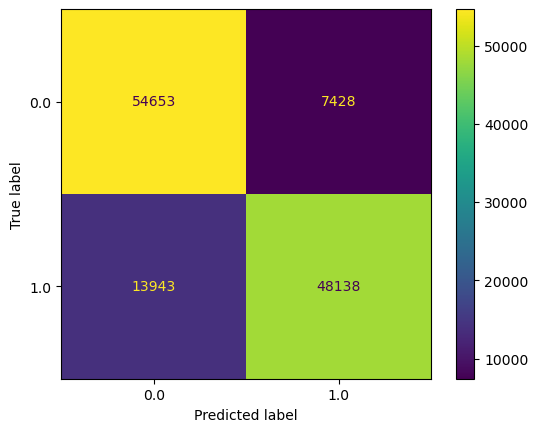

In [208]:
## Confusion matrix on the training data
cm = confusion_matrix(y_train_res, ytrain_predict)
print (cm)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=best_model.classes_)
disp.plot()

In [209]:
print(classification_report(y_train_res, ytrain_predict),'\n');

              precision    recall  f1-score   support

         0.0       0.80      0.88      0.84     62081
         1.0       0.87      0.78      0.82     62081

    accuracy                           0.83    124162
   macro avg       0.83      0.83      0.83    124162
weighted avg       0.83      0.83      0.83    124162
 



[[23529  3078]
 [  200   186]]


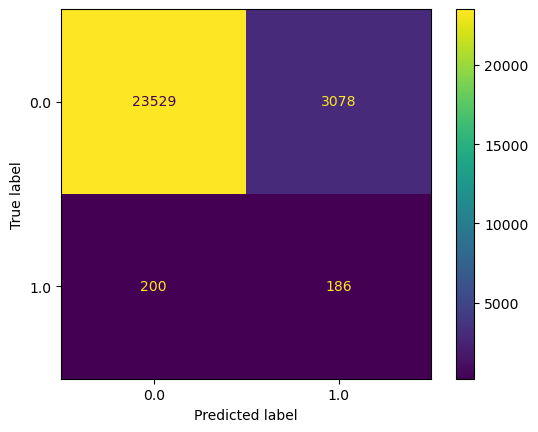

In [210]:
## Confusion matrix on the test data
cm = confusion_matrix(y_test, ytest_predict)
print(cm)

disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=best_model.classes_)
disp.plot()


In [211]:
print(classification_report(y_test, ytest_predict),'\n');

              precision    recall  f1-score   support

         0.0       0.99      0.88      0.93     26607
         1.0       0.06      0.48      0.10       386

    accuracy                           0.88     26993
   macro avg       0.52      0.68      0.52     26993
weighted avg       0.98      0.88      0.92     26993
 



In [212]:
# Accuracy - Training Data
best_model.score(X_train_res, y_train_res)

0.8278780947471851

AUC: 0.916


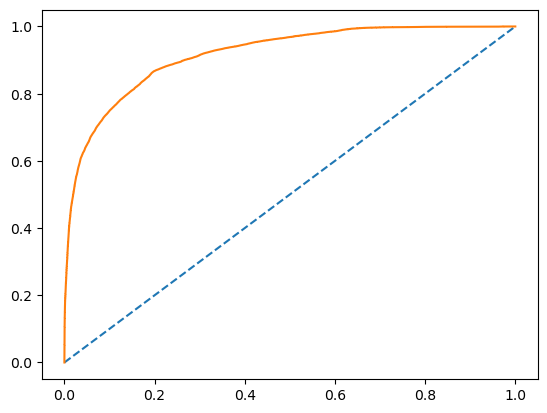

In [213]:
# predict probabilities
probs = best_model.predict_proba(X_train_res)
# keep probabilities for the positive outcome only
probs = probs[:, 1]
# calculate AUC
auc = roc_auc_score(y_train_res, probs)
print('AUC: %.3f' % auc)
# calculate roc curve
train_fpr, train_tpr, train_thresholds = roc_curve(y_train_res, probs)
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(train_fpr, train_tpr);

In [214]:
# Accuracy - Test Data
best_model.score(X_test, y_test)

0.8785611084355203

AUC: 0.916


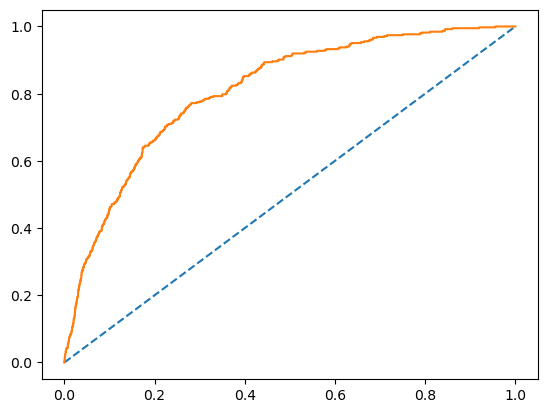

In [215]:
# predict probabilities
probs = best_model.predict_proba(X_test)
# keep probabilities for the positive outcome only
probs = probs[:, 1]
# calculate AUC
test_auc = roc_auc_score(y_test, probs)
print('AUC: %.3f' % auc)
# calculate roc curve
test_fpr, test_tpr, test_thresholds = roc_curve(y_test, probs)
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(test_fpr, test_tpr);

### Gaussian Naive Bayes

In [216]:
from sklearn.naive_bayes import GaussianNB

In [217]:
NB_model = GaussianNB()
NB_model.fit(X_train_res, y_train_res)

GaussianNB()

In [218]:
y_train_predict = NB_model.predict(X_train_res)
pred_prob_train = NB_model.predict_proba(X_train_res)

In [219]:
model_score = NB_model.score(X_train_res, y_train_res)                      
print("Accuracy:",model_score)
print('\n', "Confusion_matrix:", confusion_matrix(y_train_res, y_train_predict))          
print('\n', "Classification_report:", '\n', classification_report(y_train_res, y_train_predict))     

Accuracy: 0.791071342278636

 Confusion_matrix: [[44673 17408]
 [ 8533 53548]]

 Classification_report: 
               precision    recall  f1-score   support

         0.0       0.84      0.72      0.77     62081
         1.0       0.75      0.86      0.81     62081

    accuracy                           0.79    124162
   macro avg       0.80      0.79      0.79    124162
weighted avg       0.80      0.79      0.79    124162



AUC for the Training Data (Naive Bayes): 0.850


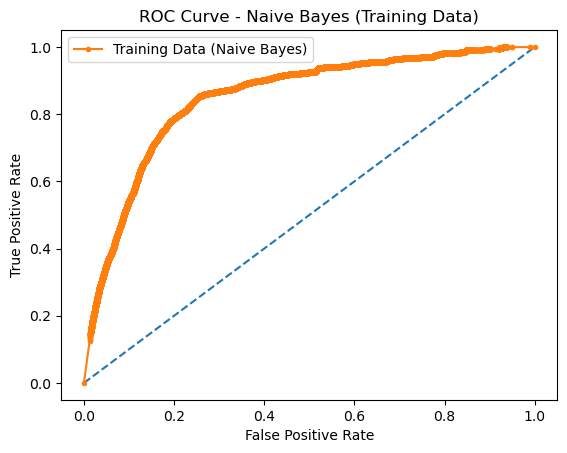

In [220]:
auc_train = roc_auc_score(y_train_res, pred_prob_train[:,1])
print('AUC for the Training Data (Naive Bayes): %.3f' % auc_train)

# ROC curve for the training data
fpr_train, tpr_train, thresholds_train = roc_curve(y_train_res, pred_prob_train[:,1])
plt.plot([0, 1], [0, 1], linestyle='--')
plt.plot(fpr_train, tpr_train, marker='.', label='Training Data (Naive Bayes)')
plt.legend(loc='best')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve - Naive Bayes (Training Data)')
plt.show();

In [221]:
y_test_predict = NB_model.predict(X_test)
pred_prob_test = NB_model.predict_proba(X_test)

In [222]:
## Performance Matrix on test data set
model_score = NB_model.score(X_test, y_test)                   
print("Accuracy:",model_score)
print('\n', "Confusion matrix:",confusion_matrix(y_test, y_test_predict))         
print('\n', "Classification report:",'\n', classification_report(y_test, y_test_predict))    

Accuracy: 0.7236320527544178

 Confusion matrix: [[19262  7345]
 [  115   271]]

 Classification report: 
               precision    recall  f1-score   support

         0.0       0.99      0.72      0.84     26607
         1.0       0.04      0.70      0.07       386

    accuracy                           0.72     26993
   macro avg       0.51      0.71      0.45     26993
weighted avg       0.98      0.72      0.83     26993



AUC for the Test Data (Naive Bayes): 0.766


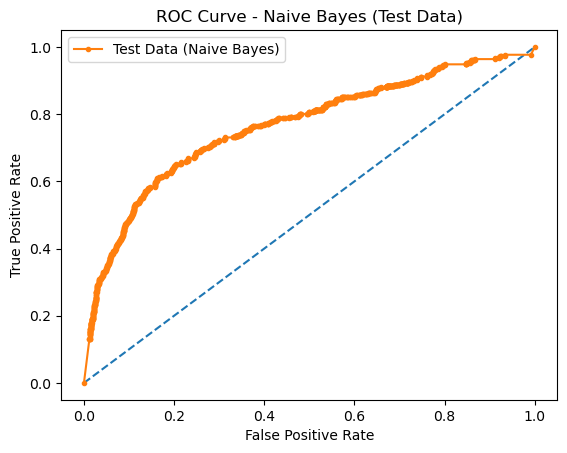

In [223]:
auc_test = roc_auc_score(y_test, pred_prob_test[:,1])
print('AUC for the Test Data (Naive Bayes): %.3f' % auc_test)

# ROC curve for the test data
fpr_test, tpr_test, thresholds_test = roc_curve(y_test, pred_prob_test[:,1])
plt.plot([0, 1], [0, 1], linestyle='--')
plt.plot(fpr_test, tpr_test, marker='.', label='Test Data (Naive Bayes)')
plt.legend(loc='best')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve - Naive Bayes (Test Data)')
plt.show();

### Cross Validation on Naive Bayes Model

In [224]:
from sklearn.model_selection import cross_val_score
train_scores = cross_val_score(NB_model, X_train_res, y_train_res, cv=5)
print('\n', "Train scores:", train_scores)
print ('\n', "Accuracy:", np.mean(train_scores))
print('\n', "Confusion_matrix:", confusion_matrix(y_train_res, y_train_predict))      
print('\n', "Classification report:", '\n', classification_report(y_train_res, y_train_predict))


 Train scores: [0.78186284 0.79402408 0.79848582 0.79244523 0.78781411]

 Accuracy: 0.7909264184364961

 Confusion_matrix: [[44673 17408]
 [ 8533 53548]]

 Classification report: 
               precision    recall  f1-score   support

         0.0       0.84      0.72      0.77     62081
         1.0       0.75      0.86      0.81     62081

    accuracy                           0.79    124162
   macro avg       0.80      0.79      0.79    124162
weighted avg       0.80      0.79      0.79    124162



AUC: 0.916


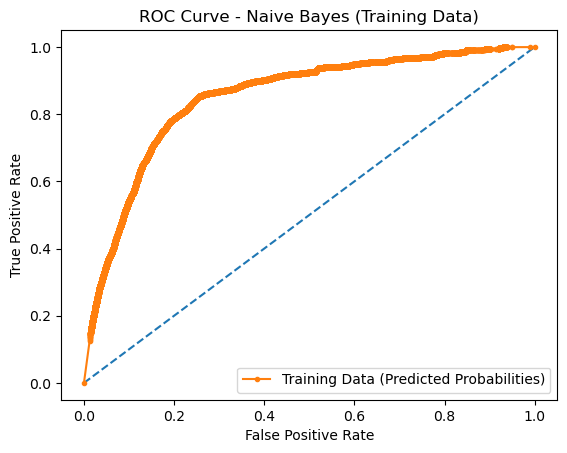

In [225]:
# Get predicted probabilities on training data without cross-validation
y_train_pred_proba = NB_model.predict_proba(X_train_res)

# Use the predicted probabilities to calculate AUC and plot ROC curve
auc_train = roc_auc_score(y_train_res, y_train_pred_proba[:,1])
print('AUC: %.3f' % auc)

fpr_train, tpr_train, thresholds_train = roc_curve(y_train_res, y_train_pred_proba[:,1])

# Plot ROC curve for training data
plt.plot([0, 1], [0, 1], linestyle='--')
plt.plot(fpr_train, tpr_train, marker='.', label='Training Data (Predicted Probabilities)')
plt.legend(loc='best')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve - Naive Bayes (Training Data)')
plt.show();


In [226]:
test_scores = cross_val_score(NB_model, X_test, y_test, cv=5)
print('\n', "Test scores:",test_scores)
print('\n', "Accuracy:", np.mean(test_scores))
print('\n', "Confusion matrix:",confusion_matrix(y_test, y_test_predict)) 
print('\n',  "Classification report:", '\n',classification_report(y_test, y_test_predict))


 Test scores: [0.90535284 0.90424153 0.89516577 0.9049648  0.90107447]

 Accuracy: 0.9021598829143844

 Confusion matrix: [[19262  7345]
 [  115   271]]

 Classification report: 
               precision    recall  f1-score   support

         0.0       0.99      0.72      0.84     26607
         1.0       0.04      0.70      0.07       386

    accuracy                           0.72     26993
   macro avg       0.51      0.71      0.45     26993
weighted avg       0.98      0.72      0.83     26993



AUC: 0.916


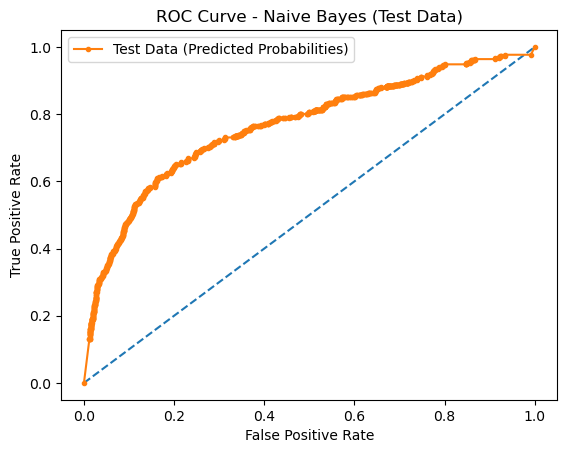

In [227]:
y_test_pred_proba = NB_model.predict_proba(X_test)

auc_test = roc_auc_score(y_test, y_test_pred_proba[:,1])
print('AUC: %.3f' % auc)

fpr_test, tpr_test, thresholds_test = roc_curve(y_test, y_test_pred_proba[:,1])

# Plot ROC curve for test data
plt.plot([0, 1], [0, 1], linestyle='--')
plt.plot(fpr_test, tpr_test, marker='.', label='Test Data (Predicted Probabilities)')
plt.legend(loc='best')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve - Naive Bayes (Test Data)')
plt.show();

### KNN Model

In [228]:
from sklearn.neighbors import KNeighborsClassifier

KNN_model=KNeighborsClassifier()
KNN_model.fit(X_train_res,y_train_res)

KNeighborsClassifier()

In [229]:
## Performance Matrix on train data set
y_train_predict = KNN_model.predict(X_train_res)
model_score = KNN_model.score(X_train_res, y_train_res)
print('\n', "Accuracy:", model_score)
print('\n', "Confusion matrix:",'\n',confusion_matrix(y_train_res, y_train_predict))
print('\n', "Classification report:",'\n',classification_report(y_train_res, y_train_predict))


 Accuracy: 0.9650134501699392

 Confusion matrix: 
 [[58161  3920]
 [  424 61657]]

 Classification report: 
               precision    recall  f1-score   support

         0.0       0.99      0.94      0.96     62081
         1.0       0.94      0.99      0.97     62081

    accuracy                           0.97    124162
   macro avg       0.97      0.97      0.96    124162
weighted avg       0.97      0.97      0.96    124162



In [230]:
## Performance Matrix on test data set
y_test_predict = KNN_model.predict(X_test)
model_score = KNN_model.score(X_test, y_test)
print('\n', "Accuracy:",model_score)
print('\n', "Confusion matrix:",'\n',confusion_matrix(y_test, y_test_predict))
print('\n', "Classification report:",'\n',classification_report(y_test, y_test_predict))


 Accuracy: 0.912606972177972

 Confusion matrix: 
 [[24477  2130]
 [  229   157]]

 Classification report: 
               precision    recall  f1-score   support

         0.0       0.99      0.92      0.95     26607
         1.0       0.07      0.41      0.12       386

    accuracy                           0.91     26993
   macro avg       0.53      0.66      0.54     26993
weighted avg       0.98      0.91      0.94     26993



In [231]:
# empty list that will hold accuracy scores
ac_scores = []

# perform accuracy metrics for values from 1,3,5....19
for k in range(1,20,2):
    knn = KNeighborsClassifier(n_neighbors=k)
    knn.fit(X_train_res, y_train_res)
    # evaluate test accuracy
    scores = knn.score(X_test, y_test)
    ac_scores.append(scores)

# changing to misclassification error
MCE = [1 - x for x in ac_scores]
MCE

[0.05275441781202539,
 0.07231504464120331,
 0.08739302782202796,
 0.10076686548364389,
 0.11173267143333454,
 0.11847516022672544,
 0.1261808617048864,
 0.1344052161671544,
 0.1397028859333901,
 0.14540806875856704]

**Plot misclassification error vs k (with k value on X-axis) using matplotlib**

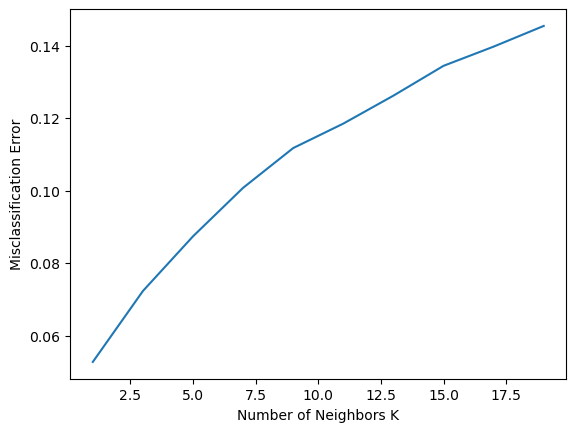

In [232]:
import matplotlib.pyplot as plt
# plot misclassification error vs k
plt.plot(range(1,20,2), MCE)
plt.xlabel('Number of Neighbors K')
plt.ylabel('Misclassification Error')
plt.show();

The best value of k would be where the MCE is lowest. In this case, it seems that k=1 has the lowest MCE of 0.05275441781202539. Therefore, k=1 would be the best value for building your KNN model

In [233]:
from sklearn.neighbors import KNeighborsClassifier

KNN_model=KNeighborsClassifier(n_neighbors=1)
KNN_model.fit(X_train_res,y_train_res)

KNeighborsClassifier(n_neighbors=1)

In [234]:
## Performance Matrix on train data set
y_train_predict = KNN_model.predict(X_train_res)
model_score = KNN_model.score(X_train_res, y_train_res)
print("Accuracy:",model_score)
print('\n', "Confusion matrix:",'\n',confusion_matrix(y_train_res, y_train_predict))
print('\n', "Classification report:",'\n',classification_report(y_train_res, y_train_predict))

Accuracy: 0.9985180651084873

 Confusion matrix: 
 [[62024    57]
 [  127 61954]]

 Classification report: 
               precision    recall  f1-score   support

         0.0       1.00      1.00      1.00     62081
         1.0       1.00      1.00      1.00     62081

    accuracy                           1.00    124162
   macro avg       1.00      1.00      1.00    124162
weighted avg       1.00      1.00      1.00    124162



AUC for Training Data: 0.9985180651084873


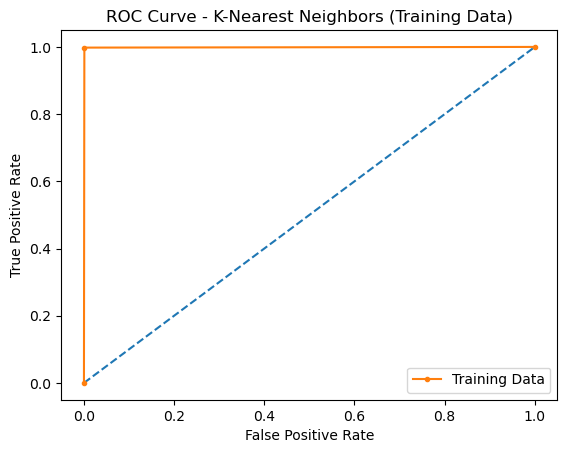

In [235]:
y_train_pred_proba = KNN_model.predict_proba(X_train_res)[:, 1]

# Calculate AUC for training data
auc_train = roc_auc_score(y_train_res, y_train_pred_proba)

print("AUC for Training Data:", auc_train)

# Compute ROC curve for training data
fpr_train, tpr_train, thresholds_train = roc_curve(y_train_res, y_train_pred_proba)

# Plot ROC curve for training data
plt.plot([0, 1], [0, 1], linestyle='--')
plt.plot(fpr_train, tpr_train, marker='.', label='Training Data')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve - K-Nearest Neighbors (Training Data)')
plt.legend()
plt.show();

In [236]:
## Performance Matrix on test data set
y_test_predict = KNN_model.predict(X_test)
model_score = KNN_model.score(X_test, y_test)
print("Accuracy:",model_score)
print('\n', "Confusion matrix:",'\n',confusion_matrix(y_test, y_test_predict))
print('\n', "Classification report:",'\n',classification_report(y_test, y_test_predict))

Accuracy: 0.9472455821879746

 Confusion matrix: 
 [[25470  1137]
 [  287    99]]

 Classification report: 
               precision    recall  f1-score   support

         0.0       0.99      0.96      0.97     26607
         1.0       0.08      0.26      0.12       386

    accuracy                           0.95     26993
   macro avg       0.53      0.61      0.55     26993
weighted avg       0.98      0.95      0.96     26993



AUC for Test Data: 0.6068717842961191


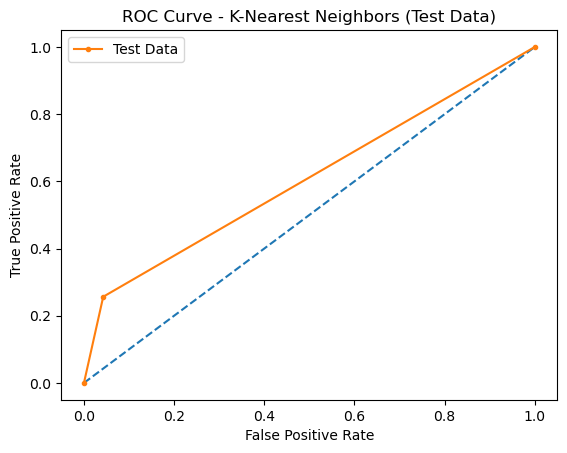

In [237]:
y_test_pred_proba = KNN_model.predict_proba(X_test)[:, 1]

# Calculate AUC for test data
auc_test = roc_auc_score(y_test, y_test_pred_proba)

print("AUC for Test Data:", auc_test)

# Compute ROC curve for test data
fpr_test, tpr_test, thresholds_test = roc_curve(y_test, y_test_pred_proba)

# Plot ROC curve for test data
plt.plot([0, 1], [0, 1], linestyle='--')
plt.plot(fpr_test, tpr_test, marker='.', label='Test Data')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve - K-Nearest Neighbors (Test Data)')
plt.legend()
plt.show();

In [238]:
0.9985180651084873 - 0.9472455821879746

0.051272482920512674

#### Lets check train and test for K=3 with other evaluation metrics

In [239]:
from sklearn.neighbors import KNeighborsClassifier

KNN_model=KNeighborsClassifier(n_neighbors=3)
KNN_model.fit(X_train_res,y_train_res)

KNeighborsClassifier(n_neighbors=3)

In [240]:
## Performance Matrix on train data set
y_train_predict = KNN_model.predict(X_train_res)
model_score = KNN_model.score(X_train_res, y_train_res)
print("Accuracy:",model_score)
print('\n', "Confusion matrix:",'\n',confusion_matrix(y_train_res, y_train_predict))
print('\n', "Classification report:",'\n',classification_report(y_train_res, y_train_predict))

Accuracy: 0.9778595705610412

 Confusion matrix: 
 [[59677  2404]
 [  345 61736]]

 Classification report: 
               precision    recall  f1-score   support

         0.0       0.99      0.96      0.98     62081
         1.0       0.96      0.99      0.98     62081

    accuracy                           0.98    124162
   macro avg       0.98      0.98      0.98    124162
weighted avg       0.98      0.98      0.98    124162



AUC for Training Data: 0.9986658469009121


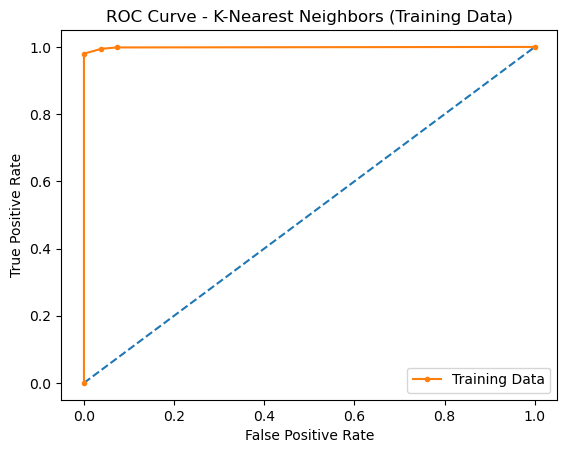

In [241]:
y_train_pred_proba = KNN_model.predict_proba(X_train_res)[:, 1]

# Calculate AUC for training data
auc_train = roc_auc_score(y_train_res, y_train_pred_proba)

print("AUC for Training Data:", auc_train)

# Compute ROC curve for training data
fpr_train, tpr_train, thresholds_train = roc_curve(y_train_res, y_train_pred_proba)

# Plot ROC curve for training data
plt.plot([0, 1], [0, 1], linestyle='--')
plt.plot(fpr_train, tpr_train, marker='.', label='Training Data')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve - K-Nearest Neighbors (Training Data)')
plt.legend()
plt.show();

In [242]:
## Performance Matrix on test data set
y_test_predict = KNN_model.predict(X_test)
model_score = KNN_model.score(X_test, y_test)
print("Accuracy:",model_score)
print('\n',"Confusion matrix:", '\n',confusion_matrix(y_test, y_test_predict))
print('\n',"Classification report:", '\n',classification_report(y_test, y_test_predict))

Accuracy: 0.9276849553587967

 Confusion matrix: 
 [[24909  1698]
 [  254   132]]

 Classification report: 
               precision    recall  f1-score   support

         0.0       0.99      0.94      0.96     26607
         1.0       0.07      0.34      0.12       386

    accuracy                           0.93     26993
   macro avg       0.53      0.64      0.54     26993
weighted avg       0.98      0.93      0.95     26993



AUC for Test Data: 0.6677007161035771


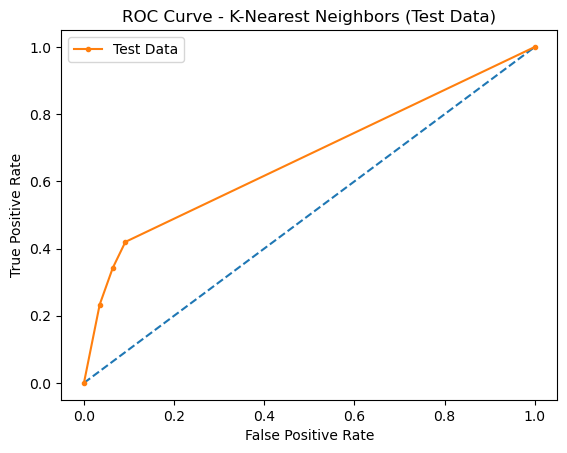

In [243]:
y_test_pred_proba = KNN_model.predict_proba(X_test)[:, 1]

# Calculate AUC for test data
auc_test = roc_auc_score(y_test, y_test_pred_proba)

print("AUC for Test Data:", auc_test)

# Compute ROC curve for test data
fpr_test, tpr_test, thresholds_test = roc_curve(y_test, y_test_pred_proba)

# Plot ROC curve for test data
plt.plot([0, 1], [0, 1], linestyle='--')
plt.plot(fpr_test, tpr_test, marker='.', label='Test Data')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve - K-Nearest Neighbors (Test Data)')
plt.legend()
plt.show();

In [244]:
0.9778595705610412 - 0.9276849553587967

0.05017461520224453

### Decision Tree

In [245]:
from sklearn import tree

DT_model= tree.DecisionTreeClassifier(criterion = 'gini')
DT_model.fit(X_train_res, y_train_res)

DecisionTreeClassifier()

In [246]:
## Performance Matrix on train data set
y_train_predict = DT_model.predict(X_train_res)
model_score = DT_model.score(X_train_res, y_train_res)
print("Accuracy:",model_score)
print('\n', "Confusion matrix:",'\n',confusion_matrix(y_train_res, y_train_predict))
print('\n', "Classification report:",'\n',classification_report(y_train_res, y_train_predict))

Accuracy: 0.9992751405421949

 Confusion matrix: 
 [[62024    57]
 [   33 62048]]

 Classification report: 
               precision    recall  f1-score   support

         0.0       1.00      1.00      1.00     62081
         1.0       1.00      1.00      1.00     62081

    accuracy                           1.00    124162
   macro avg       1.00      1.00      1.00    124162
weighted avg       1.00      1.00      1.00    124162



AUC: 1.000


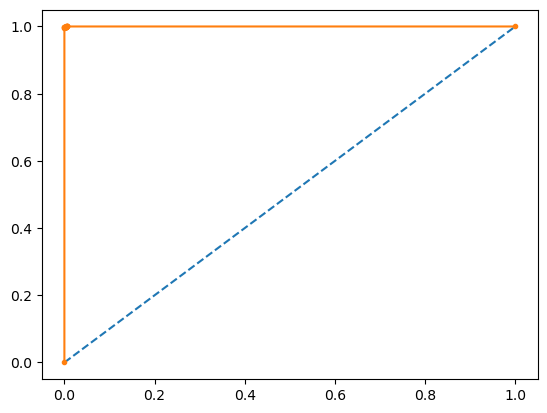

In [247]:
# predict probabilities
probs = DT_model.predict_proba(X_train_res)
# keep probabilities for the positive outcome only
probs = probs[:, 1]
# calculate AUC
from sklearn.metrics import roc_auc_score
auc = roc_auc_score(y_train_res, probs)
print('AUC: %.3f' % auc)
# calculate roc curve
from sklearn.metrics import roc_curve
fpr, tpr, thresholds = roc_curve(y_train_res, probs)
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(fpr, tpr, marker='.')
# show the plot
plt.show();

In [248]:
## Performance Matrix on test data set
y_test_predict = DT_model.predict(X_test)
model_score = DT_model.score(X_test, y_test)
print("Accuracy:",model_score)
print('\n', "Confusion matrix:",'\n',confusion_matrix(y_test, y_test_predict))
print('\n', "Classification report:",'\n',classification_report(y_test, y_test_predict))

Accuracy: 0.964027710888008

 Confusion matrix: 
 [[25940   667]
 [  304    82]]

 Classification report: 
               precision    recall  f1-score   support

         0.0       0.99      0.97      0.98     26607
         1.0       0.11      0.21      0.14       386

    accuracy                           0.96     26993
   macro avg       0.55      0.59      0.56     26993
weighted avg       0.98      0.96      0.97     26993



AUC: 0.594


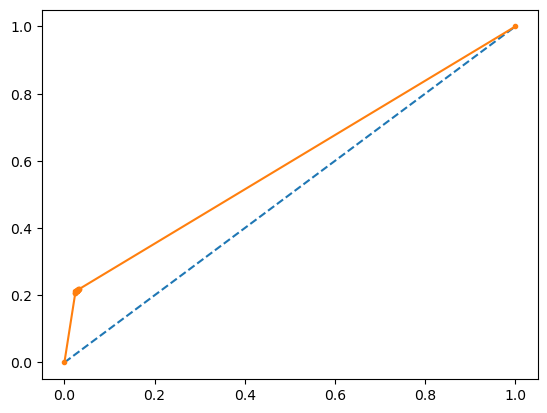

In [249]:
# predict probabilities
probs = DT_model.predict_proba(X_test)
# keep probabilities for the positive outcome only
probs = probs[:, 1]
# calculate AUC
from sklearn.metrics import roc_auc_score
auc = roc_auc_score(y_test, probs)
print('AUC: %.3f' % auc)
# calculate roc curve
from sklearn.metrics import roc_curve
fpr, tpr, thresholds = roc_curve(y_test, probs)
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(fpr, tpr, marker='.')
# show the plot
plt.show();

### Regularising the Decision Tree

In [250]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import GridSearchCV

param_grid = {'max_features': ['auto', 'sqrt', 'log2'],
              'ccp_alpha': [0.1, .01, .001],
              'max_depth' : [1,5,10,15,20],
              'min_samples_leaf':[1,5,10,15,20],
              'criterion' :['gini', 'entropy']
             }
tree_clas = DecisionTreeClassifier(random_state=1024)
grid_search = GridSearchCV(estimator=tree_clas, param_grid=param_grid, cv=5, verbose=True)
grid_search.fit(X_train_res, y_train_res)

Fitting 5 folds for each of 450 candidates, totalling 2250 fits


GridSearchCV(cv=5, estimator=DecisionTreeClassifier(random_state=1024),
             param_grid={'ccp_alpha': [0.1, 0.01, 0.001],
                         'criterion': ['gini', 'entropy'],
                         'max_depth': [1, 5, 10, 15, 20],
                         'max_features': ['auto', 'sqrt', 'log2'],
                         'min_samples_leaf': [1, 5, 10, 15, 20]},
             verbose=True)

In [251]:
grid_search.best_estimator_

DecisionTreeClassifier(ccp_alpha=0.001, criterion='entropy', max_depth=20,
                       max_features='sqrt', min_samples_leaf=10,
                       random_state=1024)

In [252]:
reg_dt_model = DecisionTreeClassifier(ccp_alpha=0.001, criterion='entropy', max_depth=20,
                       max_features='sqrt', min_samples_leaf=10,
                       random_state=1024)

reg_dt_model.fit(X_train_res, y_train_res)


DecisionTreeClassifier(ccp_alpha=0.001, criterion='entropy', max_depth=20,
                       max_features='sqrt', min_samples_leaf=10,
                       random_state=1024)

In [253]:
## Performance Matrix on train data set
y_train_predict = reg_dt_model.predict(X_train_res)
model_score = reg_dt_model.score(X_train_res, y_train_res)
print("Accuracy:",model_score)
print('\n', "Confusion matrix:",'\n',confusion_matrix(y_train_res, y_train_predict))
print('\n', "Classification report:",'\n',classification_report(y_train_res, y_train_predict))

Accuracy: 0.8498010663488024

 Confusion matrix: 
 [[49010 13071]
 [ 5578 56503]]

 Classification report: 
               precision    recall  f1-score   support

         0.0       0.90      0.79      0.84     62081
         1.0       0.81      0.91      0.86     62081

    accuracy                           0.85    124162
   macro avg       0.85      0.85      0.85    124162
weighted avg       0.85      0.85      0.85    124162



In [254]:
## Performance Matrix on test data set
y_test_predict = reg_dt_model.predict(X_test)
model_score = reg_dt_model.score(X_test, y_test)
print("Accuracy:",model_score)
print('\n', "Confusion matrix:",'\n',confusion_matrix(y_test, y_test_predict))
print('\n', "Classification report:",'\n',classification_report(y_test, y_test_predict))

Accuracy: 0.7881673026340162

 Confusion matrix: 
 [[21004  5603]
 [  115   271]]

 Classification report: 
               precision    recall  f1-score   support

         0.0       0.99      0.79      0.88     26607
         1.0       0.05      0.70      0.09       386

    accuracy                           0.79     26993
   macro avg       0.52      0.75      0.48     26993
weighted avg       0.98      0.79      0.87     26993



AUC: 0.926


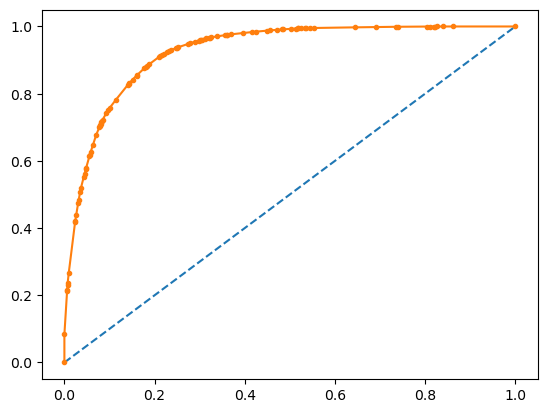

In [255]:
# predict probabilities
probs = reg_dt_model.predict_proba(X_train_res)
# keep probabilities for the positive outcome only
probs = probs[:, 1]
# calculate AUC
from sklearn.metrics import roc_auc_score
auc = roc_auc_score(y_train_res, probs)
print('AUC: %.3f' % auc)
# calculate roc curve
from sklearn.metrics import roc_curve
fpr, tpr, thresholds = roc_curve(y_train_res, probs)
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(fpr, tpr, marker='.')
# show the plot
plt.show()

AUC: 0.839


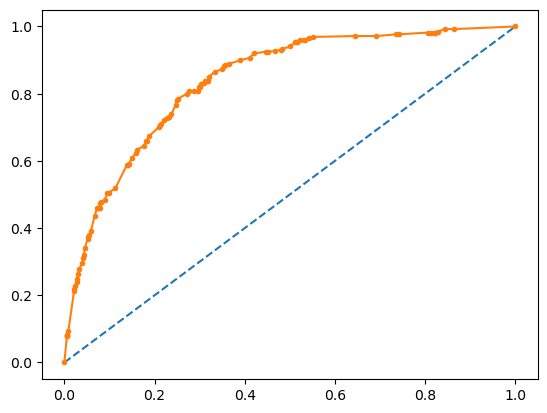

In [256]:
# predict probabilities
probs = reg_dt_model.predict_proba(X_test)
# keep probabilities for the positive outcome only
probs = probs[:, 1]
# calculate AUC
from sklearn.metrics import roc_auc_score
auc = roc_auc_score(y_test, probs)
print('AUC: %.3f' % auc)
# calculate roc curve
from sklearn.metrics import roc_curve
fpr, tpr, thresholds = roc_curve(y_test, probs)
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(fpr, tpr, marker='.')
# show the plot
plt.show()

### Random Forest

In [257]:
from sklearn.ensemble import RandomForestClassifier

RF_model=RandomForestClassifier(n_estimators=100,random_state=1)
RF_model.fit(X_train_res, y_train_res)

RandomForestClassifier(random_state=1)

In [258]:
## Performance Matrix on train data set
y_train_predict = RF_model.predict(X_train_res)
model_score =RF_model.score(X_train_res, y_train_res)
print("Accuracy:",model_score)
print('\n', "Confusion matrix:",'\n',confusion_matrix(y_train_res, y_train_predict))
print('\n', "Classification report:",'\n',classification_report(y_train_res, y_train_predict))

Accuracy: 0.9992670865482193

 Confusion matrix: 
 [[62022    59]
 [   32 62049]]

 Classification report: 
               precision    recall  f1-score   support

         0.0       1.00      1.00      1.00     62081
         1.0       1.00      1.00      1.00     62081

    accuracy                           1.00    124162
   macro avg       1.00      1.00      1.00    124162
weighted avg       1.00      1.00      1.00    124162



AUC for Training Data: 0.9999707355940938


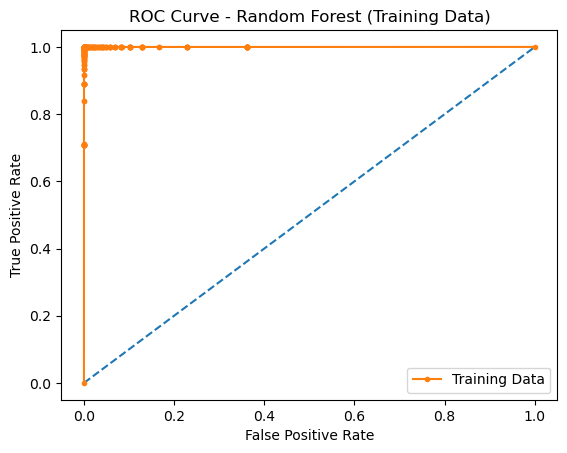

In [259]:
y_train_pred_proba = RF_model.predict_proba(X_train_res)[:, 1]

# Calculate AUC for training data
auc_train = roc_auc_score(y_train_res, y_train_pred_proba)
print("AUC for Training Data:", auc_train)

# Compute ROC curve for training data
fpr_train, tpr_train, thresholds_train = roc_curve(y_train_res, y_train_pred_proba)

# Plot ROC curve for training data
plt.plot([0, 1], [0, 1], linestyle='--')
plt.plot(fpr_train, tpr_train, marker='.', label='Training Data')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve - Random Forest (Training Data)')
plt.legend()
plt.show();

In [260]:
## Performance Matrix on test data set
y_test_predict = RF_model.predict(X_test)
model_score = RF_model.score(X_test, y_test)
print("Accuracy:",model_score)
print('\n', "Confusion matrix:",'\n',confusion_matrix(y_test, y_test_predict))
print('\n', "Classification report:",'\n',classification_report(y_test, y_test_predict))

Accuracy: 0.9747341903456451

 Confusion matrix: 
 [[26259   348]
 [  334    52]]

 Classification report: 
               precision    recall  f1-score   support

         0.0       0.99      0.99      0.99     26607
         1.0       0.13      0.13      0.13       386

    accuracy                           0.97     26993
   macro avg       0.56      0.56      0.56     26993
weighted avg       0.98      0.97      0.97     26993



AUC for Test Data: 0.8383324073625098


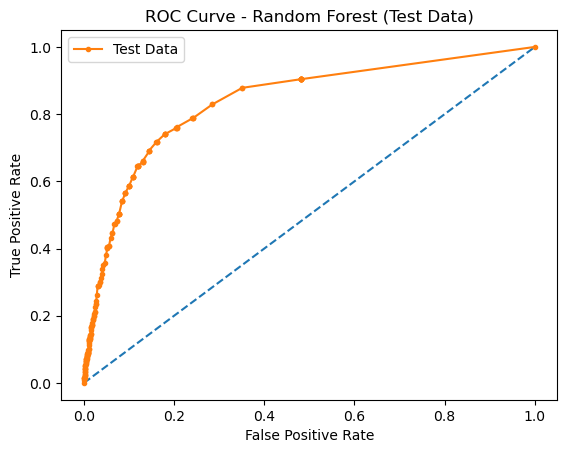

In [261]:
y_test_pred_proba = RF_model.predict_proba(X_test)[:, 1]

# Calculate AUC for test data
auc_test = roc_auc_score(y_test, y_test_pred_proba)

print("AUC for Test Data:", auc_test)

# Compute ROC curve for test data
fpr_test, tpr_test, thresholds_test = roc_curve(y_test, y_test_pred_proba)

# Plot ROC curve for test data
plt.plot([0, 1], [0, 1], linestyle='--')
plt.plot(fpr_test, tpr_test, marker='.', label='Test Data')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve - Random Forest (Test Data)')
plt.legend()
plt.show();

Accuracy of trained dataset: 0.9860424919389356

 Confusion matrix: 
 [[62022    59]
 [   32 62049]]

 Classification report for train dataset: 
               precision    recall  f1-score   support

         0.0       0.80      0.88      0.84     62081
         1.0       0.87      0.78      0.82     62081

    accuracy                           0.83    124162
   macro avg       0.83      0.83      0.83    124162
weighted avg       0.83      0.83      0.83    124162
 

AUC for Training Data (Cross-Validation): 0.9999707355940938


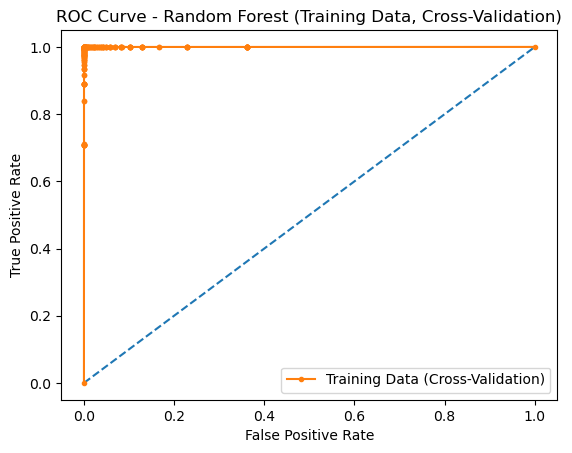

In [262]:
from sklearn.model_selection import cross_val_score
clfCVRF = RandomForestClassifier(n_estimators=100, random_state=1)

train_cv_score = cross_val_score(clfCVRF, X_train_res, y_train_res, cv=5)
print("Accuracy of trained dataset:",np.mean(train_cv_score))
print('\n', "Confusion matrix:",'\n',confusion_matrix(y_train_res, y_train_predict))
print('\n',"Classification report for train dataset:",'\n',classification_report(y_train_res, ytrain_predict),'\n');

y_train_pred_proba_cv = clfCVRF.fit(X_train_res, y_train_res).predict_proba(X_train_res)


# Calculate AUC for training data using cross-validated predictions
auc_train_cv = roc_auc_score(y_train_res, y_train_pred_proba_cv[:, 1])
print("AUC for Training Data (Cross-Validation):", auc_train_cv)

# Compute ROC curve for training data using cross-validated predictions
fpr_train_cv, tpr_train_cv, thresholds_train_cv = roc_curve(y_train_res, y_train_pred_proba_cv[:, 1])

# Plot ROC curve for training data using cross-validated predictions
plt.plot([0, 1], [0, 1], linestyle='--')
plt.plot(fpr_train_cv, tpr_train_cv, marker='.', label='Training Data (Cross-Validation)')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve - Random Forest (Training Data, Cross-Validation)')
plt.legend()
plt.show();

Accuracy of test dataset: 0.9855517958844218

 Confusion matrix: 
 [[26259   348]
 [  334    52]]

 Classification report for test dataset: 
               precision    recall  f1-score   support

         0.0       0.99      0.88      0.93     26607
         1.0       0.06      0.48      0.10       386

    accuracy                           0.88     26993
   macro avg       0.52      0.68      0.52     26993
weighted avg       0.98      0.88      0.92     26993
 

AUC for Test Data (Cross-Validation): 0.8383324073625098


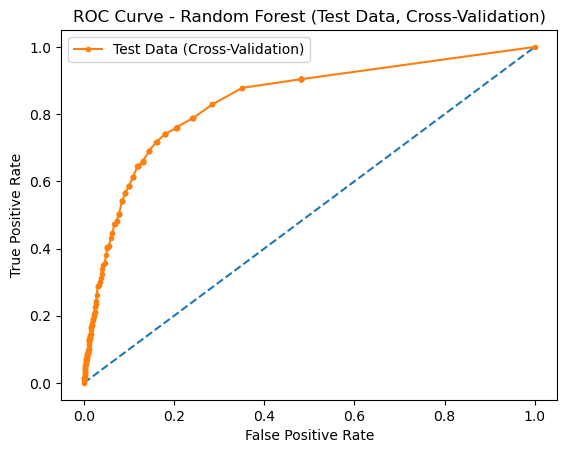

In [263]:
test_cv_score = cross_val_score(clfCVRF, X_test, y_test, cv=5)
print("Accuracy of test dataset:",np.mean(test_cv_score))
print('\n', "Confusion matrix:",'\n',confusion_matrix(y_test, y_test_predict))
print('\n',"Classification report for test dataset:",'\n',classification_report(y_test, ytest_predict),'\n');

y_test_pred_proba_cv = clfCVRF.fit(X_train_res, y_train_res).predict_proba(X_test)

# Calculate AUC for test data using cross-validated predictions
auc_test_cv = roc_auc_score(y_test, y_test_pred_proba_cv[:, 1])
print("AUC for Test Data (Cross-Validation):", auc_test_cv)

# Compute ROC curve for test data using cross-validated predictions
fpr_test_cv, tpr_test_cv, thresholds_test_cv = roc_curve(y_test, y_test_pred_proba_cv[:, 1])

# Plot ROC curve for test data using cross-validated predictions
plt.plot([0, 1], [0, 1], linestyle='--')
plt.plot(fpr_test_cv, tpr_test_cv, marker='.', label='Test Data (Cross-Validation)')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve - Random Forest (Test Data, Cross-Validation)')
plt.legend()
plt.show();

### Bagging

In [264]:
from sklearn.ensemble import BaggingClassifier
from sklearn.tree import DecisionTreeClassifier

cart = DecisionTreeClassifier()

Bagging_model = BaggingClassifier(estimator=cart, n_estimators=100, random_state=1)

Bagging_model.fit(X_train_res, y_train_res)

BaggingClassifier(estimator=DecisionTreeClassifier(), n_estimators=100,
                  random_state=1)

In [265]:
## Performance Matrix on train data set
y_train_predict = Bagging_model.predict(X_train_res)
model_score =Bagging_model.score(X_train_res, y_train_res)
print("Accuracy:",model_score)
print('\n',"Confusion Matrix:",'\n',confusion_matrix(y_train_res, y_train_predict))
print('\n',"Classification report:",'\n',classification_report(y_train_res, y_train_predict))

Accuracy: 0.9992670865482193

 Confusion Matrix: 
 [[62023    58]
 [   33 62048]]

 Classification report: 
               precision    recall  f1-score   support

         0.0       1.00      1.00      1.00     62081
         1.0       1.00      1.00      1.00     62081

    accuracy                           1.00    124162
   macro avg       1.00      1.00      1.00    124162
weighted avg       1.00      1.00      1.00    124162



AUC for Training Data: 0.9999718515628472


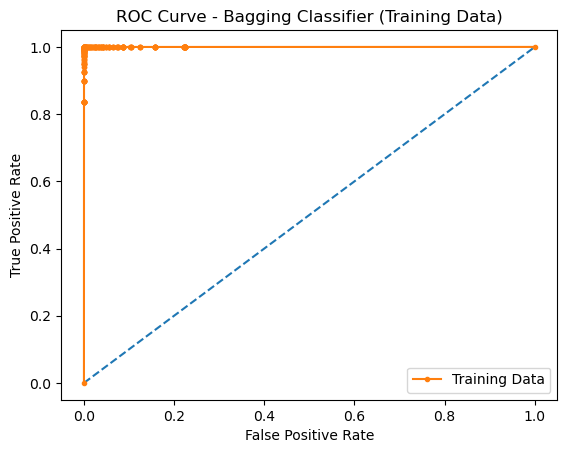

In [266]:
y_train_pred_proba = Bagging_model.predict_proba(X_train_res)[:, 1]

auc_train = roc_auc_score(y_train_res, y_train_pred_proba)
print("AUC for Training Data:", auc_train)

fpr_train, tpr_train, thresholds_train = roc_curve(y_train_res, y_train_pred_proba)

# Plot ROC curve for training data
plt.plot([0, 1], [0, 1], linestyle='--')
plt.plot(fpr_train, tpr_train, marker='.', label='Training Data')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve - Bagging Classifier (Training Data)')
plt.legend()
plt.show();


In [267]:
## Performance Matrix on test data set
y_test_predict = Bagging_model.predict(X_test)
model_score = Bagging_model.score(X_test, y_test)
print("Accuracy:",model_score)
print('\n',"Confusion Matrix:",'\n',confusion_matrix(y_test, y_test_predict))
print('\n',"Classification report:",'\n',classification_report(y_test, y_test_predict))

Accuracy: 0.9721779720668321

 Confusion Matrix: 
 [[26182   425]
 [  326    60]]

 Classification report: 
               precision    recall  f1-score   support

         0.0       0.99      0.98      0.99     26607
         1.0       0.12      0.16      0.14       386

    accuracy                           0.97     26993
   macro avg       0.56      0.57      0.56     26993
weighted avg       0.98      0.97      0.97     26993



AUC for Test Data: 0.795278804849166


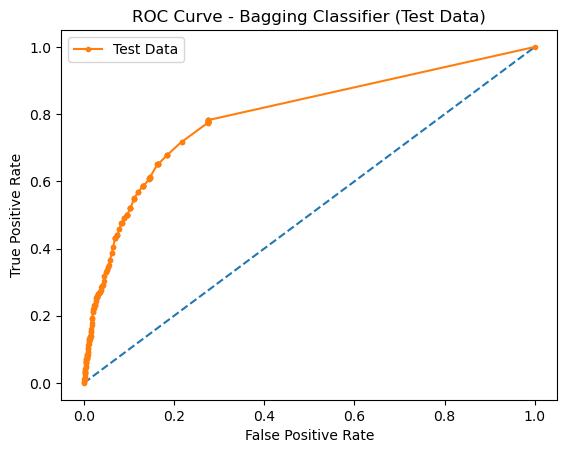

In [268]:
y_test_pred_proba = Bagging_model.predict_proba(X_test)[:, 1]

# Calculate AUC for test data
auc_test = roc_auc_score(y_test, y_test_pred_proba)
print("AUC for Test Data:", auc_test)

# Compute ROC curve for test data
fpr_test, tpr_test, thresholds_test = roc_curve(y_test, y_test_pred_proba)

# Plot ROC curve for test data
plt.plot([0, 1], [0, 1], linestyle='--')
plt.plot(fpr_test, tpr_test, marker='.', label='Test Data')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve - Bagging Classifier (Test Data)')
plt.legend()
plt.show();

param_grid = {
    'n_estimators': [50, 100, 150],
    'max_samples': [0.5, 0.7, 1.0],
    'max_features': [0.5, 0.7, 1.0]
}
grid_search_bagging = GridSearchCV(Bagging_model, param_grid, cv=5)
grid_search_bagging.fit(X_train_res, y_train_res)
best_params_bagging = grid_search_bagging.best_params_
best_score_bagging = grid_search_bagging.best_score_
print("Best Parameters for Bagging Classifier:", best_params_bagging)
print("Best Score for Bagging Classifier:", best_score_bagging)
best_bagging_model = BaggingClassifier(**best_params_bagging, random_state=1)
best_bagging_model.fit(X_train_res, y_train_res)
y_train_predict_bagging = best_bagging_model.predict(X_train_res)
train_score_bagging = best_bagging_model.score(X_train_res, y_train_res)
print("Bagging Classifier - Training Performance:")
print("Accuracy:", train_score_bagging)
print("Confusion Matrix:\n", confusion_matrix(y_train_res, y_train_predict_bagging))
print("Classification Report:\n", classification_report(y_train_res, y_train_predict_bagging))
y_test_predict_bagging = best_bagging_model.predict(X_test)
test_score_bagging = best_bagging_model.score(X_test, y_test)
print("\nBagging Classifier - Test Performance:")
print("Accuracy:", test_score_bagging)
print("Confusion Matrix:\n", confusion_matrix(y_test, y_test_predict_bagging))
print("Classification Report:\n", classification_report(y_test, y_test_predict_bagging))

### Bagging for LDA

In [269]:
lda_model = LinearDiscriminantAnalysis()

In [270]:
bagging_lda_model = BaggingClassifier(estimator=lda_model, n_estimators=100, random_state=1)

In [271]:
bagging_lda_model.fit(X_train_res, y_train_res)

BaggingClassifier(estimator=LinearDiscriminantAnalysis(), n_estimators=100,
                  random_state=1)

In [272]:
train_score_bagging_lda = bagging_lda_model.score(X_train_res, y_train_res)
print("Bagging (with LDA) - Training Accuracy:", train_score_bagging_lda)

Bagging (with LDA) - Training Accuracy: 0.8278458787712827


In [273]:
test_score_bagging_lda = bagging_lda_model.score(X_test, y_test)
print("Bagging (with LDA) - Test Accuracy:", test_score_bagging_lda)

Bagging (with LDA) - Test Accuracy: 0.8785240617937984


In [274]:
y_train_pred_bagging_lda = bagging_lda_model.predict(X_train_res)
y_test_pred_bagging_lda = bagging_lda_model.predict(X_test)

In [275]:
print("Confusion matrix (Training set):\n", confusion_matrix(y_train_res, y_train_pred_bagging_lda))
print("\nClassification report (Training set):\n", classification_report(y_train_res, y_train_pred_bagging_lda))

Confusion matrix (Training set):
 [[54648  7433]
 [13942 48139]]

Classification report (Training set):
               precision    recall  f1-score   support

         0.0       0.80      0.88      0.84     62081
         1.0       0.87      0.78      0.82     62081

    accuracy                           0.83    124162
   macro avg       0.83      0.83      0.83    124162
weighted avg       0.83      0.83      0.83    124162



In [276]:
print("\nConfusion matrix (Test set):\n", confusion_matrix(y_test, y_test_pred_bagging_lda))
print("\nClassification report (Test set):\n", classification_report(y_test, y_test_pred_bagging_lda))


Confusion matrix (Test set):
 [[23529  3078]
 [  201   185]]

Classification report (Test set):
               precision    recall  f1-score   support

         0.0       0.99      0.88      0.93     26607
         1.0       0.06      0.48      0.10       386

    accuracy                           0.88     26993
   macro avg       0.52      0.68      0.52     26993
weighted avg       0.98      0.88      0.92     26993



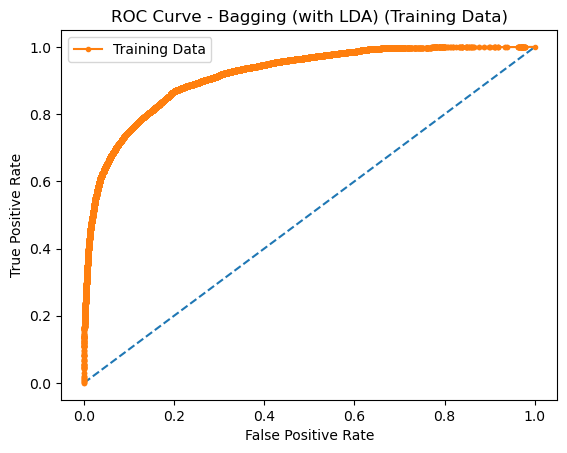

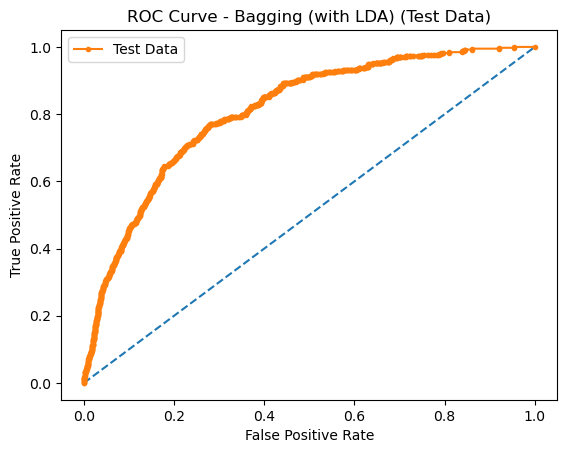

AUC for Training Data: 0.9163060835879885
AUC for Test Data: 0.8093393456200217


In [277]:
y_train_pred_proba_bagging_lda = bagging_lda_model.predict_proba(X_train_res)[:, 1]

# Calculate AUC for training data
auc_train = roc_auc_score(y_train_res, y_train_pred_proba_bagging_lda)

# Compute ROC curve for training data
fpr_train, tpr_train, thresholds_train = roc_curve(y_train_res, y_train_pred_proba_bagging_lda)

# Plot ROC curve for training data
plt.plot([0, 1], [0, 1], linestyle='--')
plt.plot(fpr_train, tpr_train, marker='.', label='Training Data')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve - Bagging (with LDA) (Training Data)')
plt.legend()
plt.show()


y_test_pred_proba_bagging_lda = bagging_lda_model.predict_proba(X_test)[:, 1]
# Calculate AUC for test data
auc_test = roc_auc_score(y_test, y_test_pred_proba_bagging_lda)

# Compute ROC curve for test data
fpr_test, tpr_test, thresholds_test = roc_curve(y_test, y_test_pred_proba_bagging_lda)

# Plot ROC curve for test data
plt.plot([0, 1], [0, 1], linestyle='--')
plt.plot(fpr_test, tpr_test, marker='.', label='Test Data')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve - Bagging (with LDA) (Test Data)')
plt.legend()
plt.show()

print("AUC for Training Data:", auc_train)
print("AUC for Test Data:", auc_test)

### Ada Boost

In [278]:
from sklearn.ensemble import AdaBoostClassifier

In [279]:
dt = DecisionTreeClassifier(max_depth=3)

In [280]:
adb_model_dt = AdaBoostClassifier(estimator=dt, n_estimators=50, random_state=1)

In [281]:
adb_model_dt.fit(X_train_res, y_train_res)

AdaBoostClassifier(estimator=DecisionTreeClassifier(max_depth=3),
                   random_state=1)

In [282]:
y_train_predict_adb_dt = adb_model_dt.predict(X_train_res)
train_score_adb_dt = adb_model_dt.score(X_train_res, y_train_res)
print("AdaBoost (with Decision Tree) - Training Performance:")
print("Accuracy:", train_score_adb_dt)
print("Confusion Matrix:\n", confusion_matrix(y_train_res, y_train_predict_adb_dt))
print("Classification Report:\n", classification_report(y_train_res, y_train_predict_adb_dt))


AdaBoost (with Decision Tree) - Training Performance:
Accuracy: 0.9673168924469645
Confusion Matrix:
 [[60477  1604]
 [ 2454 59627]]
Classification Report:
               precision    recall  f1-score   support

         0.0       0.96      0.97      0.97     62081
         1.0       0.97      0.96      0.97     62081

    accuracy                           0.97    124162
   macro avg       0.97      0.97      0.97    124162
weighted avg       0.97      0.97      0.97    124162



AUC for Training Data: 0.9960671884657197


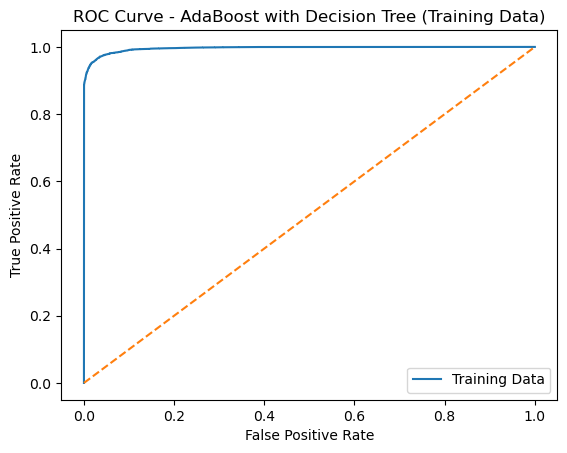

In [283]:
y_train_pred_proba_adb_dt = adb_model_dt.predict_proba(X_train_res)[:, 1]
auc_train_adb_dt = roc_auc_score(y_train_res, y_train_pred_proba_adb_dt)
print("AUC for Training Data:", auc_train_adb_dt)

# Compute ROC curve for training data
fpr_train_adb_dt, tpr_train_adb_dt, _ = roc_curve(y_train_res, y_train_pred_proba_adb_dt)

# Plot ROC curve for training data
plt.plot(fpr_train_adb_dt, tpr_train_adb_dt, label='Training Data')
plt.plot([0, 1], [0, 1], linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve - AdaBoost with Decision Tree (Training Data)')
plt.legend()
plt.show();


In [284]:
y_test_predict_adb_dt = adb_model_dt.predict(X_test)
test_score_adb_dt = adb_model_dt.score(X_test, y_test)
print("\nAdaBoost (with Decision Tree) - Test Performance:")
print("Accuracy:", test_score_adb_dt)
print("Confusion Matrix:\n", confusion_matrix(y_test, y_test_predict_adb_dt))
print("Classification Report:\n", classification_report(y_test, y_test_predict_adb_dt))


AdaBoost (with Decision Tree) - Test Performance:
Accuracy: 0.9621012855184677
Confusion Matrix:
 [[25895   712]
 [  311    75]]
Classification Report:
               precision    recall  f1-score   support

         0.0       0.99      0.97      0.98     26607
         1.0       0.10      0.19      0.13       386

    accuracy                           0.96     26993
   macro avg       0.54      0.58      0.55     26993
weighted avg       0.98      0.96      0.97     26993



AUC for Test Data: 0.8070378553619942


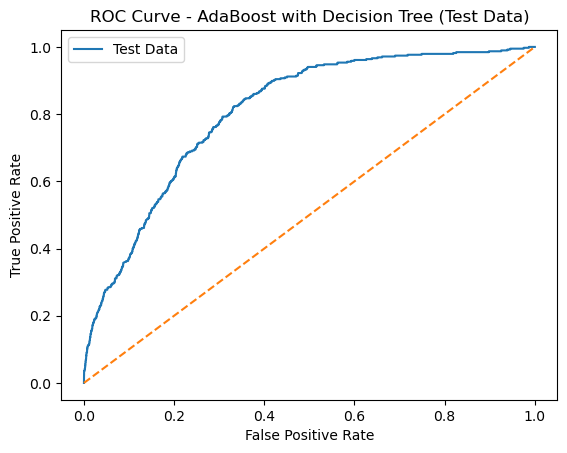

In [285]:
y_test_pred_proba_adb_dt = adb_model_dt.predict_proba(X_test)[:, 1]

# Calculate AUC for test data
auc_test_adb_dt = roc_auc_score(y_test, y_test_pred_proba_adb_dt)

print("AUC for Test Data:", auc_test_adb_dt)

# Compute ROC curve for test data
fpr_test_adb_dt, tpr_test_adb_dt, _ = roc_curve(y_test, y_test_pred_proba_adb_dt)

# Plot ROC curve for test data
plt.plot(fpr_test_adb_dt, tpr_test_adb_dt, label='Test Data')
plt.plot([0, 1], [0, 1], linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve - AdaBoost with Decision Tree (Test Data)')
plt.legend()
plt.show();

In [286]:
adb_model = AdaBoostClassifier(estimator=reg_dt_model, n_estimators=50, random_state=1)

In [287]:
adb_model.fit(X_train_res, y_train_res)

AdaBoostClassifier(estimator=DecisionTreeClassifier(ccp_alpha=0.001,
                                                    criterion='entropy',
                                                    max_depth=20,
                                                    max_features='sqrt',
                                                    min_samples_leaf=10,
                                                    random_state=1024),
                   random_state=1)

In [288]:
y_train_predict = adb_model.predict(X_train_res)
model_score = adb_model.score(X_train_res, y_train_res)
print("Accuracy:",model_score)
print('\n', "Confusion matrix:",'\n',confusion_matrix(y_train_res, y_train_predict))
print('\n', "Classification report:",'\n',classification_report(y_train_res, y_train_predict))

Accuracy: 0.9914627663858507

 Confusion matrix: 
 [[61609   472]
 [  588 61493]]

 Classification report: 
               precision    recall  f1-score   support

         0.0       0.99      0.99      0.99     62081
         1.0       0.99      0.99      0.99     62081

    accuracy                           0.99    124162
   macro avg       0.99      0.99      0.99    124162
weighted avg       0.99      0.99      0.99    124162



AUC for Training Data: 0.9997089194907425


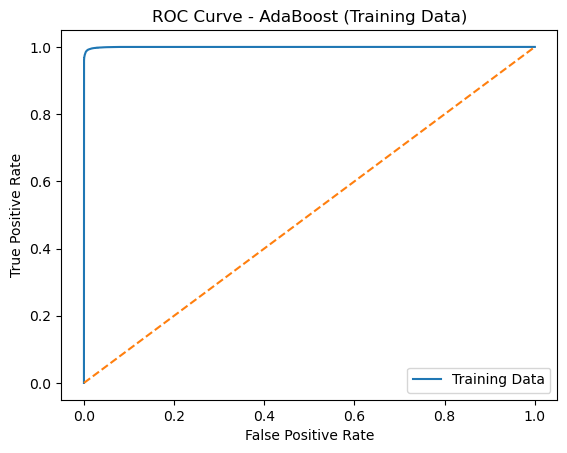

In [289]:
y_train_pred_proba_adb = adb_model.predict_proba(X_train_res)[:, 1]

# Calculate AUC for training data
auc_train_adb = roc_auc_score(y_train_res, y_train_pred_proba_adb)
print("AUC for Training Data:", auc_train_adb)

# Compute ROC curve for training data
fpr_train_adb, tpr_train_adb, _ = roc_curve(y_train_res, y_train_pred_proba_adb)

# Plot ROC curve for training data
plt.plot(fpr_train_adb, tpr_train_adb, label='Training Data')
plt.plot([0, 1], [0, 1], linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve - AdaBoost (Training Data)')
plt.legend()
plt.show();


In [290]:
y_test_predict = adb_model.predict(X_test)
model_score = adb_model.score(X_test, y_test)
print("Accuracy:",model_score)
print('\n', "Confusion matrix:",'\n',confusion_matrix(y_test, y_test_predict))
print('\n', "Classification report:",'\n',classification_report(y_test, y_test_predict))

Accuracy: 0.9716222724410032

 Confusion matrix: 
 [[26157   450]
 [  316    70]]

 Classification report: 
               precision    recall  f1-score   support

         0.0       0.99      0.98      0.99     26607
         1.0       0.13      0.18      0.15       386

    accuracy                           0.97     26993
   macro avg       0.56      0.58      0.57     26993
weighted avg       0.98      0.97      0.97     26993



AUC for Test Data: 0.7858251393191747


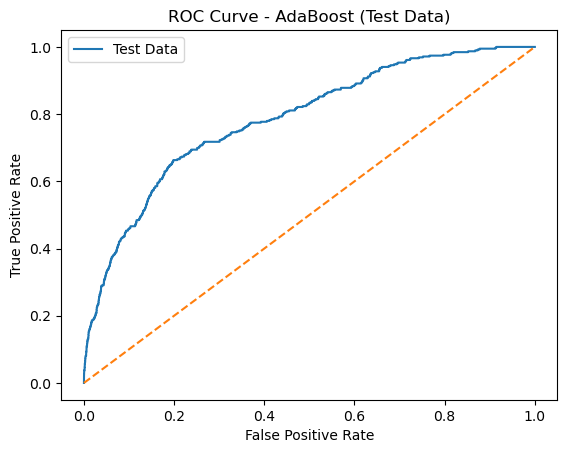

In [291]:
y_test_pred_proba_adb = adb_model.predict_proba(X_test)[:, 1]

# Calculate AUC for test data
auc_test_adb = roc_auc_score(y_test, y_test_pred_proba_adb)
print("AUC for Test Data:", auc_test_adb)

# Compute ROC curve for test data
fpr_test_adb, tpr_test_adb, _ = roc_curve(y_test, y_test_pred_proba_adb)

# Plot ROC curve for test data
plt.plot(fpr_test_adb, tpr_test_adb, label='Test Data')
plt.plot([0, 1], [0, 1], linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve - AdaBoost (Test Data)')
plt.legend()
plt.show()



### Gradient Boosting
Gradient boosting is a machine learning technique for regression and classification problems, which produces a prediction model in the form of an ensemble of weak prediction models, typically decision trees.

In [292]:
from sklearn.ensemble import GradientBoostingClassifier
gbcl = GradientBoostingClassifier(random_state=1)
gbcl = gbcl.fit(X_train_res, y_train_res)

In [293]:
## Performance Matrix on train data set
y_train_predict = gbcl.predict(X_train_res)
model_score = gbcl.score(X_train_res, y_train_res)
print("Accuracy:",model_score)
print('\n',"Confusion Matrix:",'\n',confusion_matrix(y_train_res, y_train_predict))
print('\n',"Classification report:",'\n',classification_report(y_train_res, y_train_predict))

Accuracy: 0.9072018814129927

 Confusion Matrix: 
 [[55769  6312]
 [ 5210 56871]]

 Classification report: 
               precision    recall  f1-score   support

         0.0       0.91      0.90      0.91     62081
         1.0       0.90      0.92      0.91     62081

    accuracy                           0.91    124162
   macro avg       0.91      0.91      0.91    124162
weighted avg       0.91      0.91      0.91    124162



AUC for Training Data: 0.9730548132785641


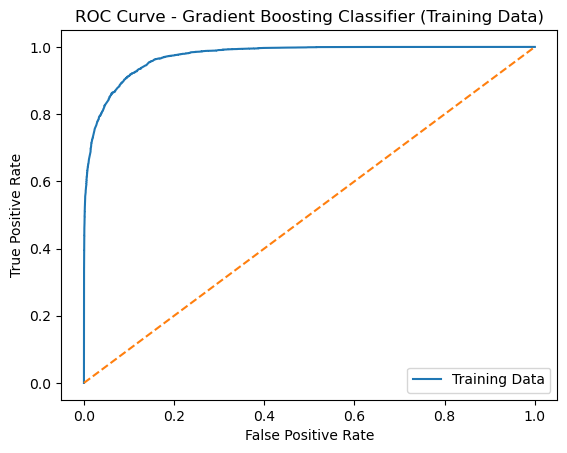

In [294]:
y_train_pred_proba_gbcl = gbcl.predict_proba(X_train_res)[:, 1]

# Calculate AUC for training data
auc_train_gbcl = roc_auc_score(y_train_res, y_train_pred_proba_gbcl)
print("AUC for Training Data:", auc_train_gbcl)

# Compute ROC curve for training data
fpr_train_gbcl, tpr_train_gbcl, _ = roc_curve(y_train_res, y_train_pred_proba_gbcl)

# Plot ROC curve for training data
plt.plot(fpr_train_gbcl, tpr_train_gbcl, label='Training Data')
plt.plot([0, 1], [0, 1], linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve - Gradient Boosting Classifier (Training Data)')
plt.legend()
plt.show();

In [295]:
## Performance Matrix on test data set
y_test_predict = gbcl.predict(X_test)
model_score = gbcl.score(X_test, y_test)
print("Accuracy:",model_score)
print('\n',"Confusion Matrix:",'\n',confusion_matrix(y_test, y_test_predict))
print('\n',"Classification report:",'\n',classification_report(y_test, y_test_predict))

Accuracy: 0.8933797651242915

 Confusion Matrix: 
 [[23903  2704]
 [  174   212]]

 Classification report: 
               precision    recall  f1-score   support

         0.0       0.99      0.90      0.94     26607
         1.0       0.07      0.55      0.13       386

    accuracy                           0.89     26993
   macro avg       0.53      0.72      0.54     26993
weighted avg       0.98      0.89      0.93     26993



AUC for Test Data: 0.8698208192904162


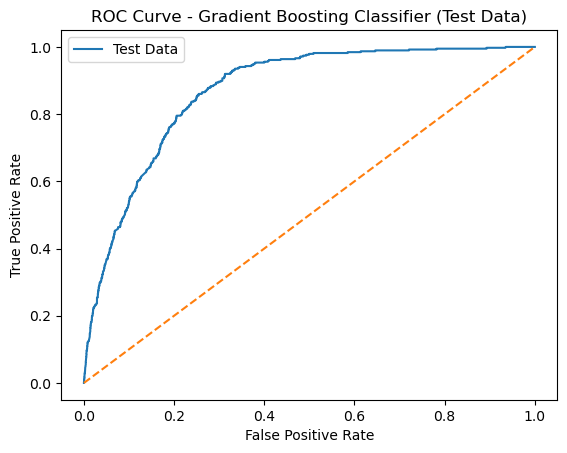

In [296]:
y_test_pred_proba_gbcl = gbcl.predict_proba(X_test)[:, 1]

# Calculate AUC for test data
auc_test_gbcl = roc_auc_score(y_test, y_test_pred_proba_gbcl)
print("AUC for Test Data:", auc_test_gbcl)

# Compute ROC curve for test data
fpr_test_gbcl, tpr_test_gbcl, _ = roc_curve(y_test, y_test_pred_proba_gbcl)

# Plot ROC curve for test data
plt.plot(fpr_test_gbcl, tpr_test_gbcl, label='Test Data')
plt.plot([0, 1], [0, 1], linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve - Gradient Boosting Classifier (Test Data)')
plt.legend()
plt.show();


In [327]:
importance_df = pd.DataFrame(gbcl.feature_importances_, columns = ["Imp"], index = X_train_res.columns)

In [331]:
importance_df_sorted = importance_df.sort_values('Imp', ascending=True)
importance_df_sorted

,Imp
sum_capital_paid_acct_12_24m,0.00
num_arch_dc_12_24m,0.00
acct_amt_added_12_24m,0.00
has_paid_Unpaid,0.00
merchant_category_Travel & Services,0.00
acct_days_in_term_12_24m,0.00
merchant_category_Food & Beverages,0.00
sum_capital_paid_acct_0_12m,0.00
num_arch_rem_0_12m,0.00
num_arch_dc_0_12m,0.00


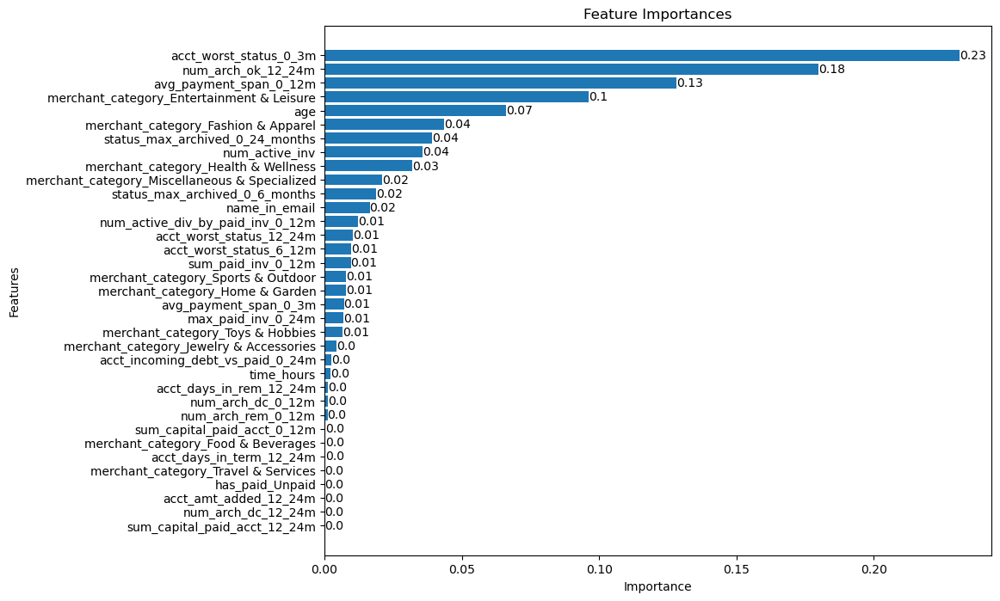

In [333]:
plt.figure(figsize=(10, 8))
bars = plt.barh(importance_df_sorted.index, importance_df_sorted["Imp"])
plt.xlabel('Importance')
plt.ylabel('Features')
plt.title('Feature Importances')

# Adding bar values
for bar in bars:
    plt.text(bar.get_width(), bar.get_y() + bar.get_height()/2, round(bar.get_width(), 2), 
             ha='left', va='center', color='black')

plt.show();